### BADASS Analysis: amino acids

Can we distinguish five different amino acids from one another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Amino acids:
- Glutamate (E)
- Arginine (R)
- Serine (S)
- Valine (V)
- Tryptophan (W)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array amino acid data

In [3]:
aa_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/'
                           'AAs/Reformatted_AA_csvs/'},
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep','GRP46', 'GRP51', 'CCHept', 'CCHept-L14A', 'CCHept-I17A-L21A',
                            'CCHept-I17G-L21G', 'CCHept-I24A', 'CCHept-I24P', 'GRP80', 'GRP63', 'GRP52',
                            'CCHex', 'CCPent', 'NLKEIA', 'QLKEIA', 'CCHex2', 'GRP22', 'CCHept-I17H',
                            'CCHept-I17T', 'CCHept-L21H-I24H', 'CCHept-L21N-I24N', 'CCHept-L21S-I24S',
                            'CCHept-L21T-I24T', 'CCHept-I24H', 'CCHept-I24N', 'CCHept-I24S', 'CCHept-I24T',
                            'CCHept-L7K', 'CCHept-I17K', 'CCHept-I17K-I24E', 'CCHept-L21E-I24K', 'CCHept-L21K',
                            'CCHept-L21K-I24E', 'CCHept-I24D', 'CCHept-I24E', 'CCHept-I24K', 'CCHept-L28K',
                            'CCPent-I24K', 'CCHex2-I24K', 'CCHept-L7W', 'CCHept-L7Y', 'CCHept-L21S-I24Y',
                            'CCHept-L21Y-I24S', 'CCHept-I24Y', 'CCHept-L28W', 'CCHept-L28Y', 'GRP35']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
aa_fluor_data.group_xlsx_repeats()

In [5]:
aa_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['E_repeat_1.xlsx',
                             'R_repeat_1.xlsx',
                             'S_repeat_1.xlsx',
                             'V_repeat_1.xlsx',
                             'W_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['E_repeat_2.xlsx',
                             'R_repeat_2.xlsx',
                             'S_repeat_2.xlsx',
                             'V_repeat_2.xlsx',
                             'W_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['E_repeat_3.xlsx',
                             'R_repeat_3.xlsx',
                             'S_repeat_3.xlsx',
                             'V_repeat_3.xlsx',
                             'W_repeat_3.xlsx'])])),
             ('repeat_4',
              OrderedDict([('DPH',
                     

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_1.xlsx
Drawing scatter plot of data spread for E_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

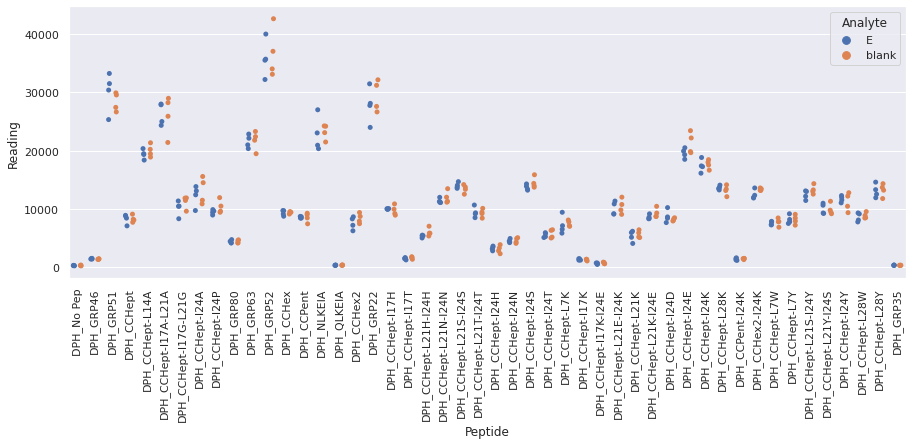

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx
Drawing scatter plot of data spread for R_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

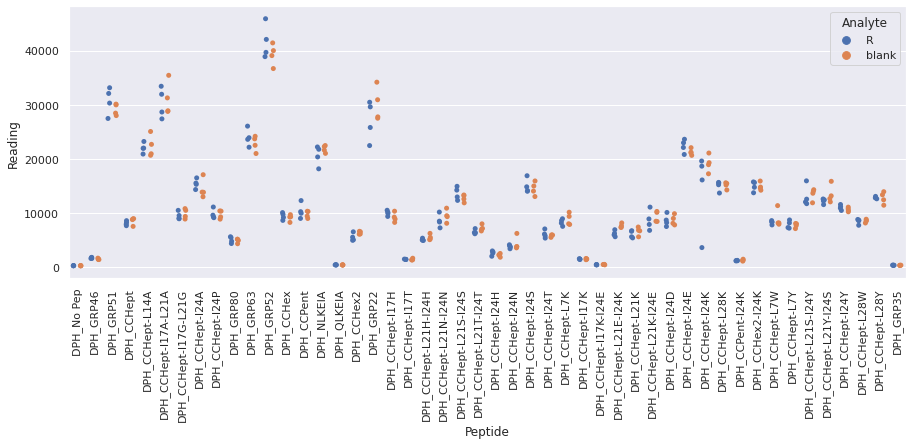

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_1.xlsx
Drawing scatter plot of data spread for S_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

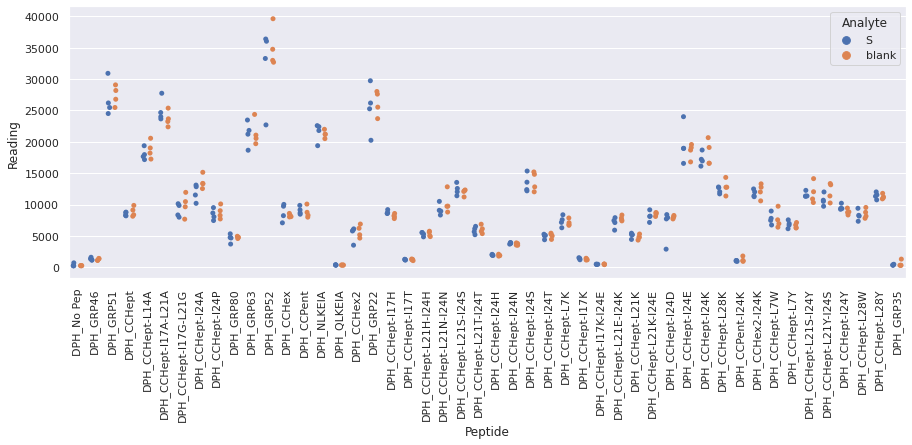

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_1.xlsx
Drawing scatter plot of data spread for V_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

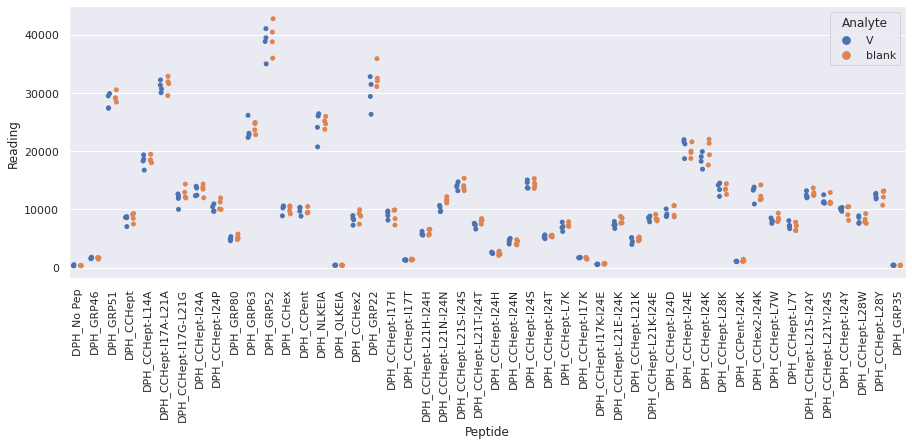

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_1.xlsx
Drawing scatter plot of data spread for W_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

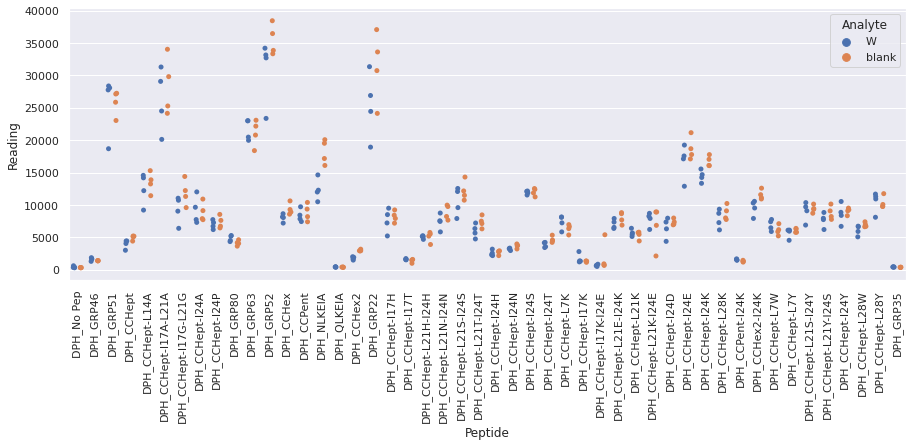

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_2.xlsx
Drawing scatter plot of data spread for E_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

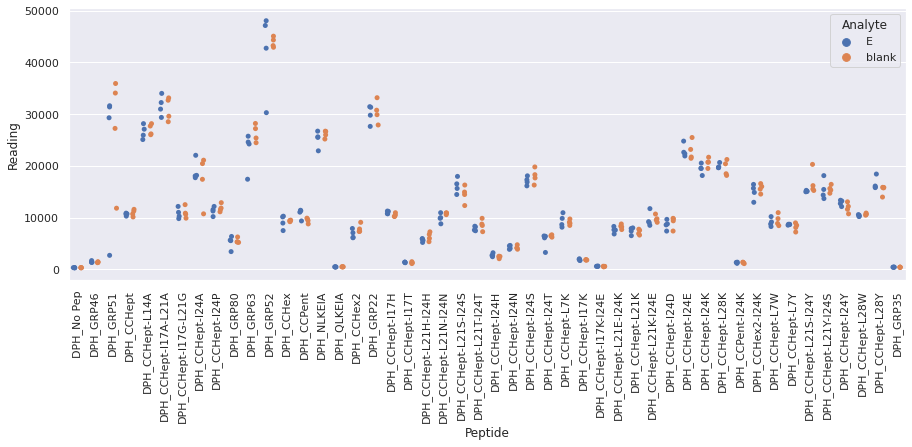

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_2.xlsx
Drawing scatter plot of data spread for R_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

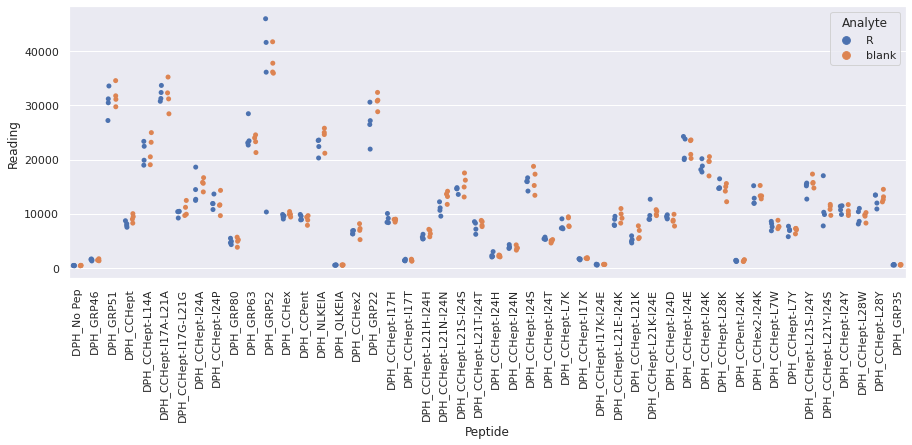

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_2.xlsx
Drawing scatter plot of data spread for S_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

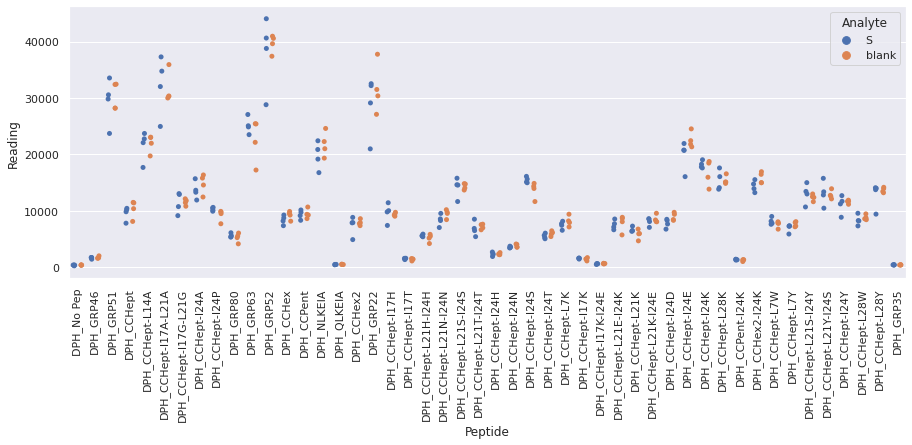

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_2.xlsx
Drawing scatter plot of data spread for V_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

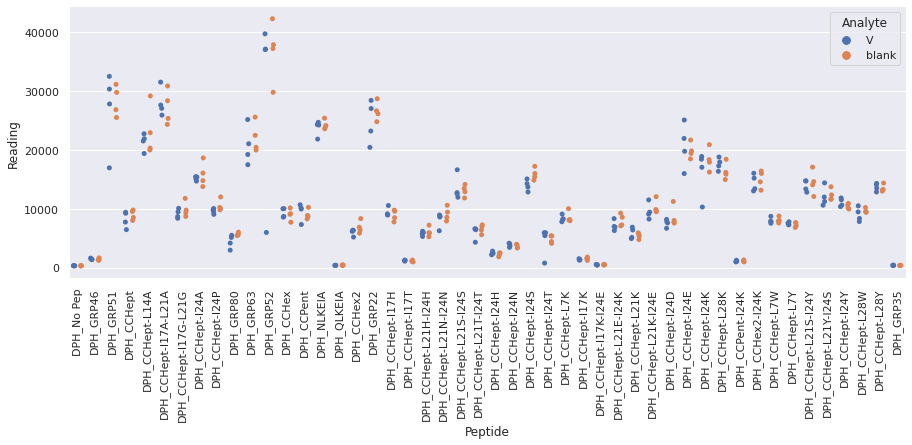

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_2.xlsx
Drawing scatter plot of data spread for W_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

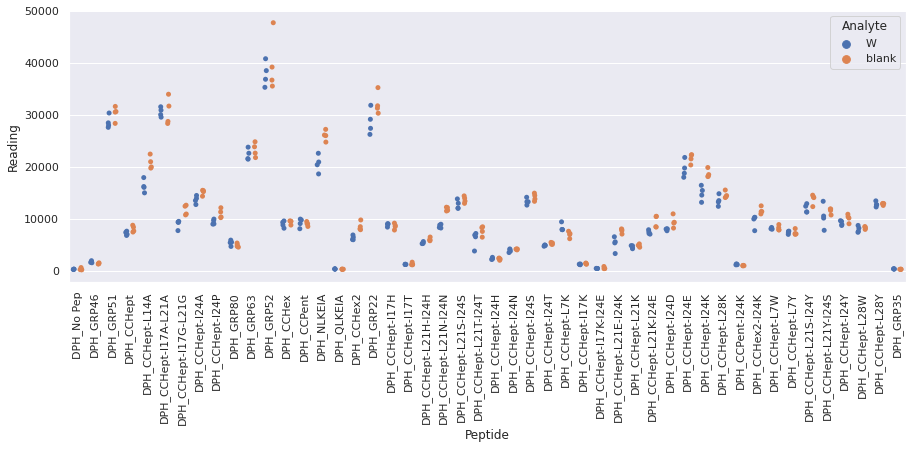

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_3.xlsx
Drawing scatter plot of data spread for E_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

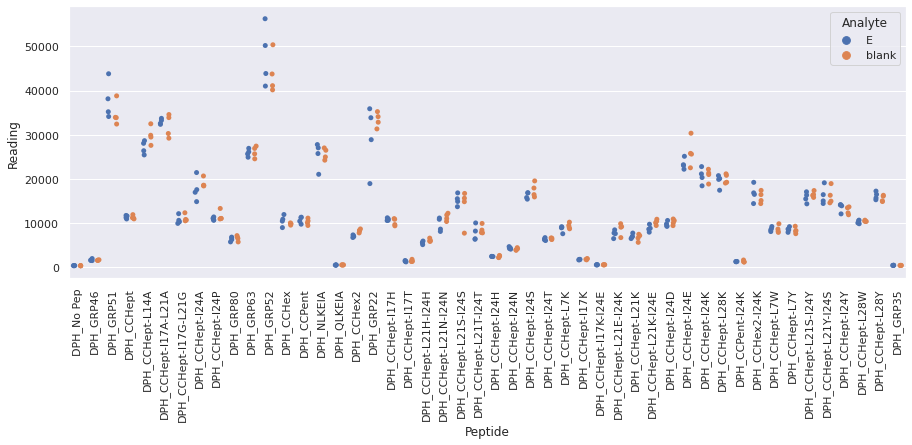

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_3.xlsx
Drawing scatter plot of data spread for R_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

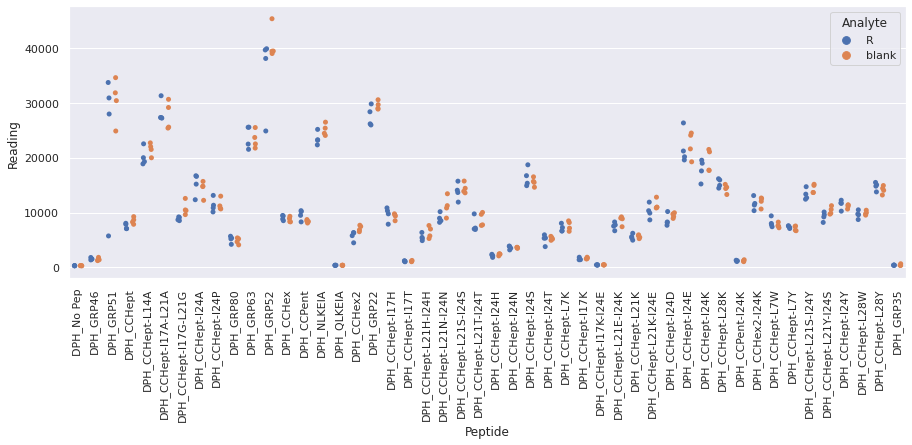

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_3.xlsx
Drawing scatter plot of data spread for S_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

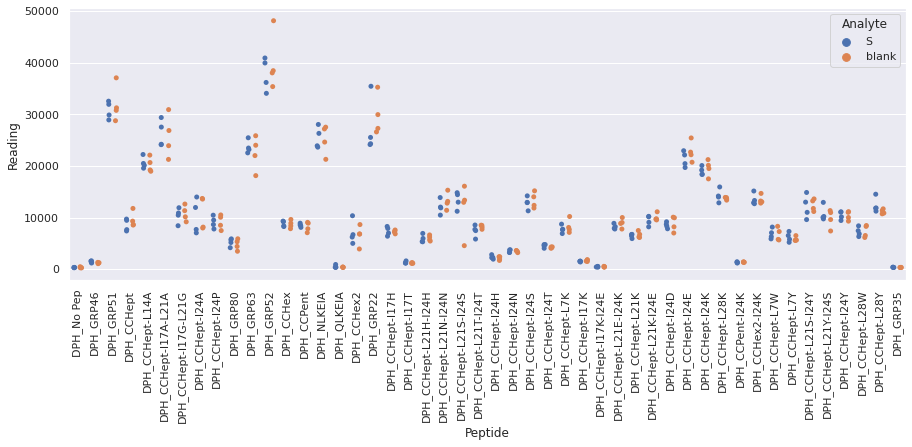

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_3.xlsx
Drawing scatter plot of data spread for V_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

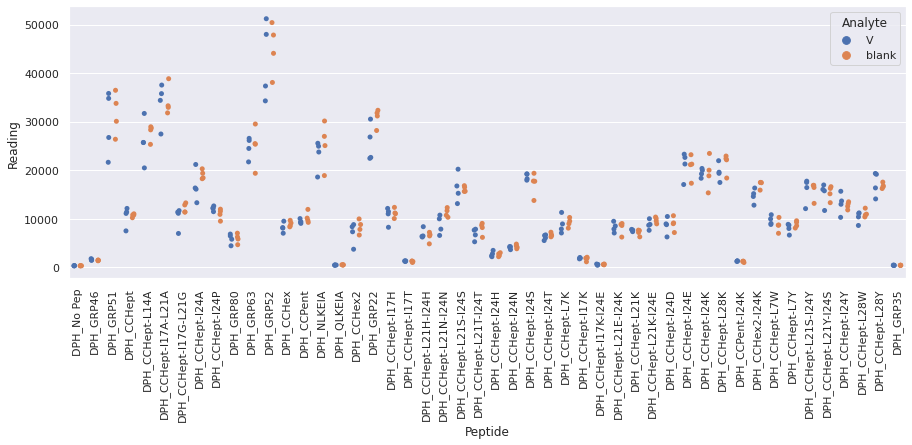

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_3.xlsx
Drawing scatter plot of data spread for W_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

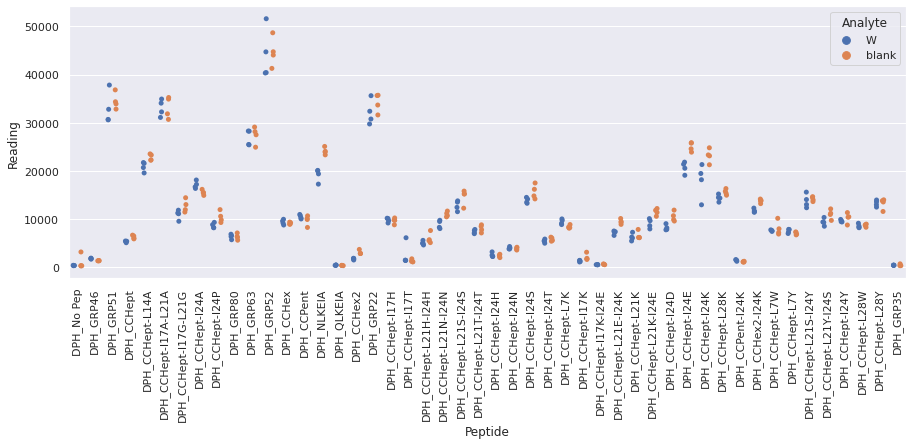

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_4.xlsx
Drawing scatter plot of data spread for E_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

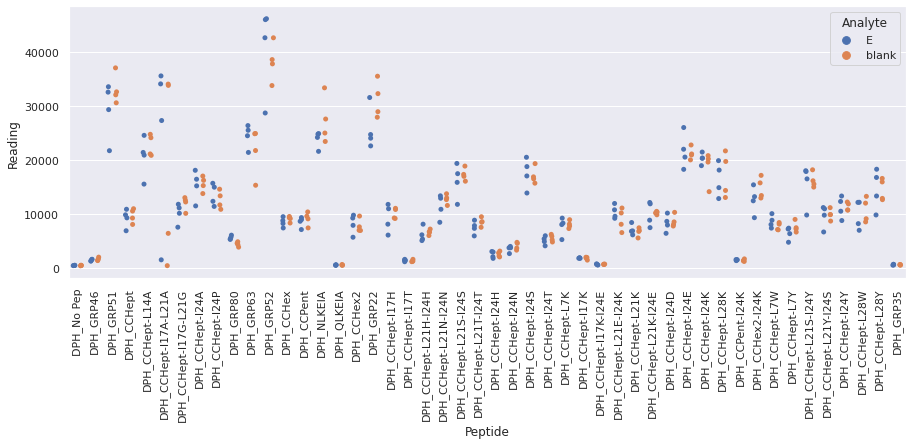

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_4.xlsx
Drawing scatter plot of data spread for R_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

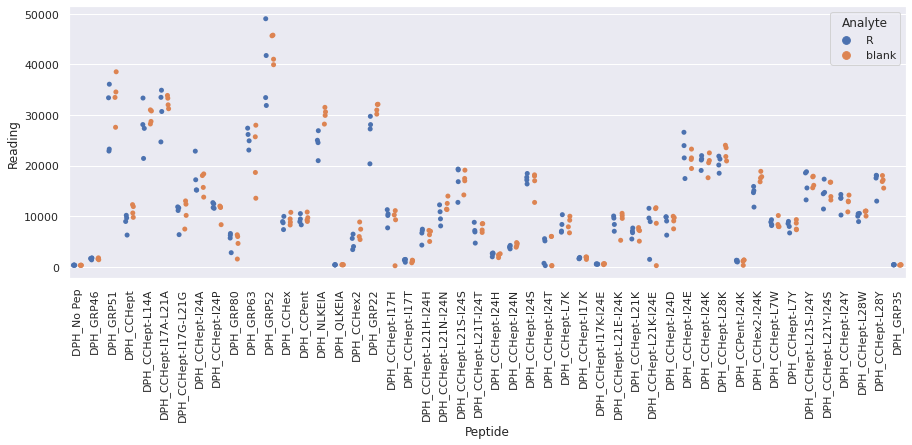

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_4.xlsx
Drawing scatter plot of data spread for S_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

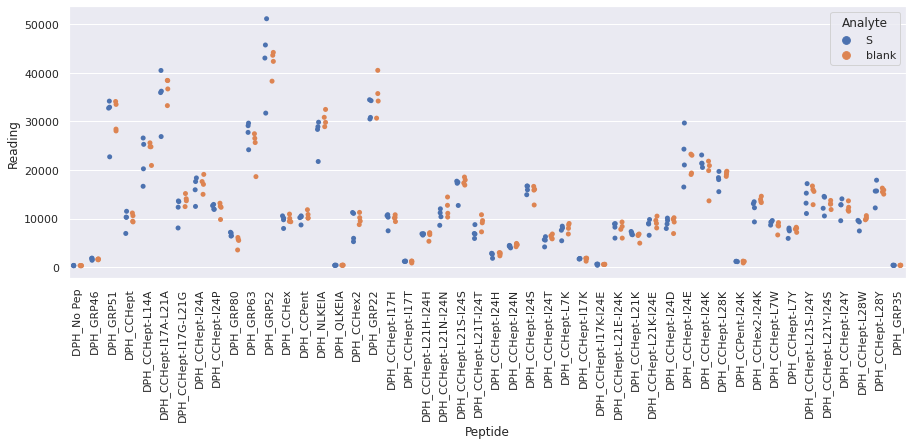

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_4.xlsx
Drawing scatter plot of data spread for V_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

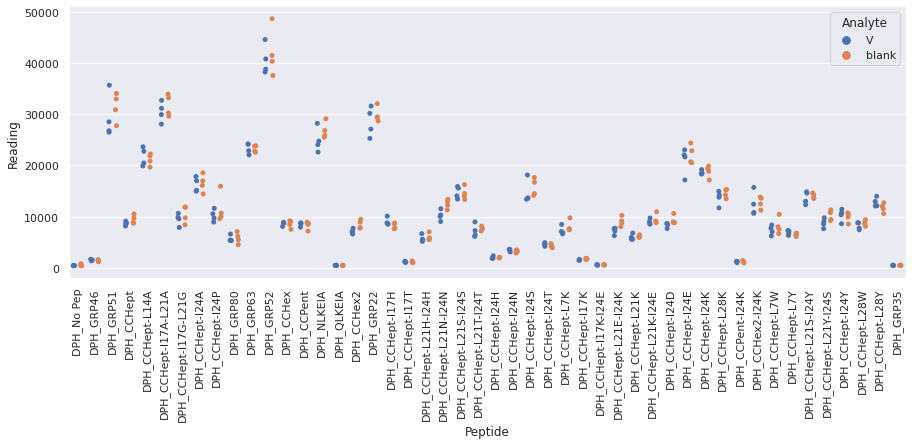

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_4.xlsx
Drawing scatter plot of data spread for W_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

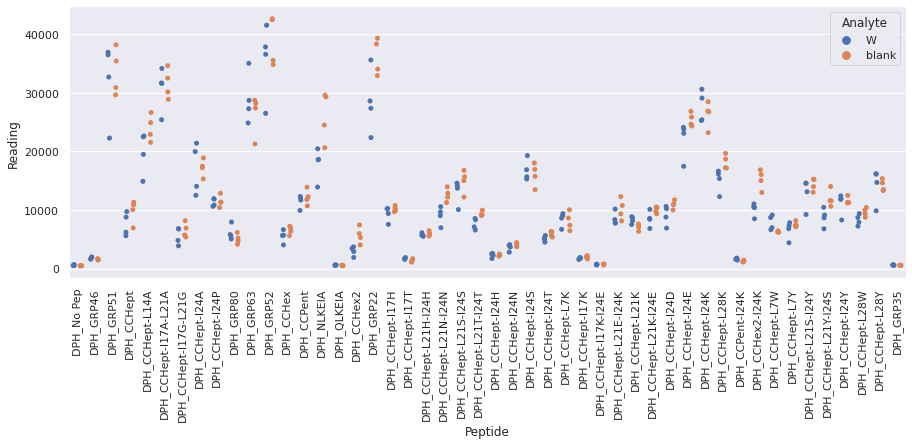

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_5.xlsx
Drawing scatter plot of data spread for E_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

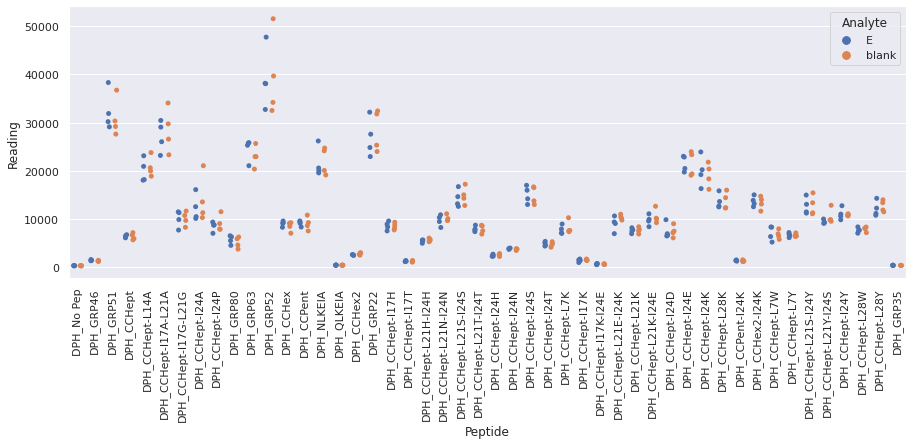

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_5.xlsx
Drawing scatter plot of data spread for R_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

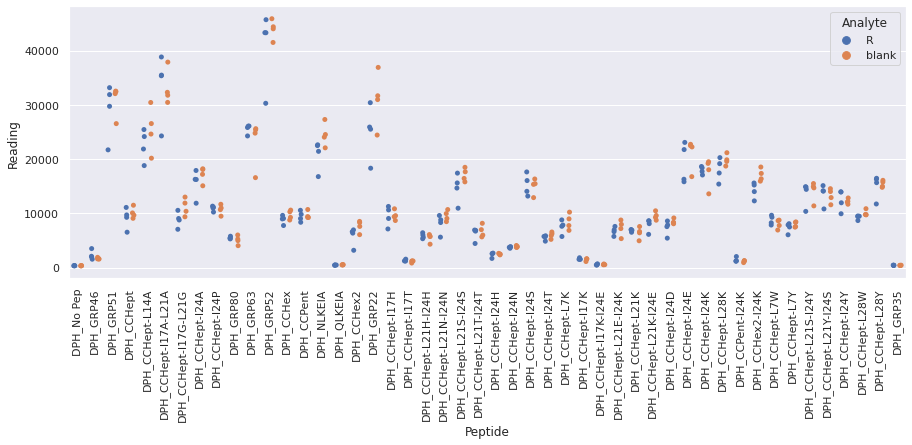

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_5.xlsx
Drawing scatter plot of data spread for S_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

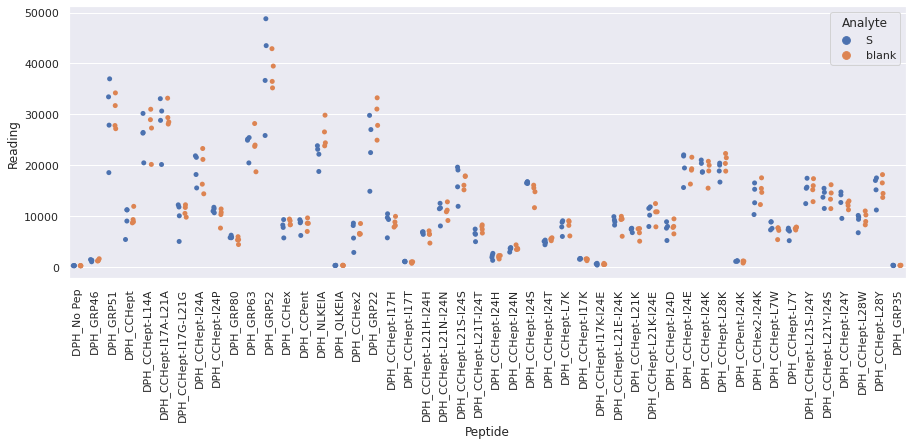

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_5.xlsx
Drawing scatter plot of data spread for V_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

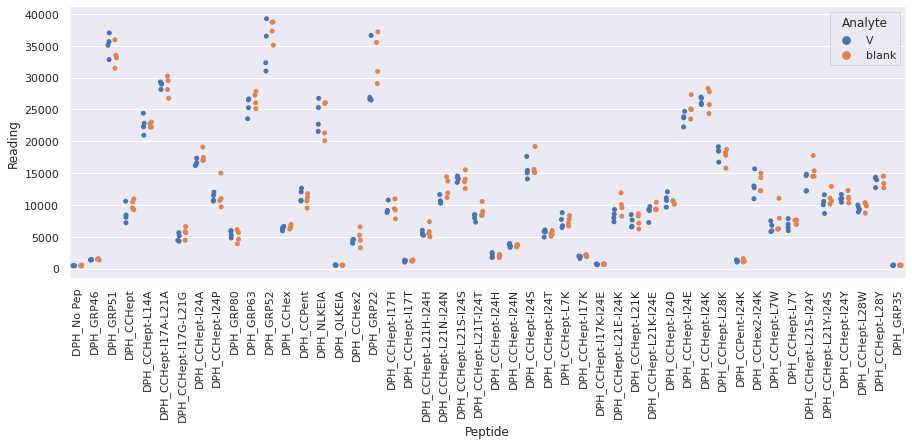

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_5.xlsx
Drawing scatter plot of data spread for W_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

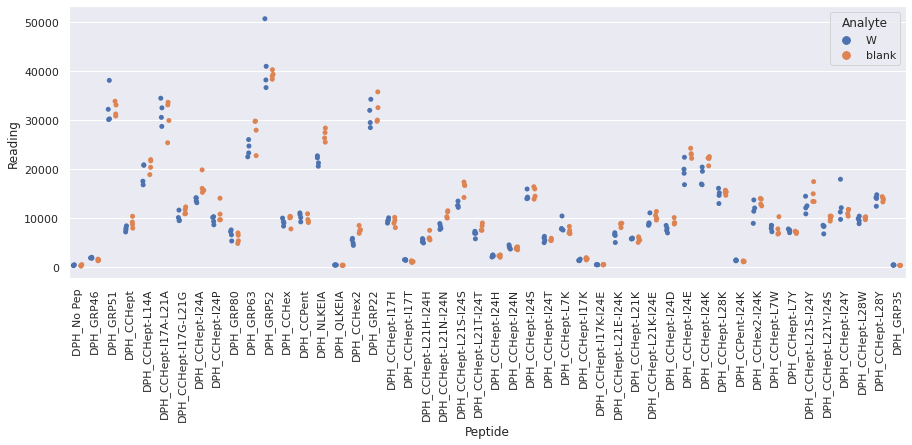

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_6.xlsx
Drawing scatter plot of data spread for E_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

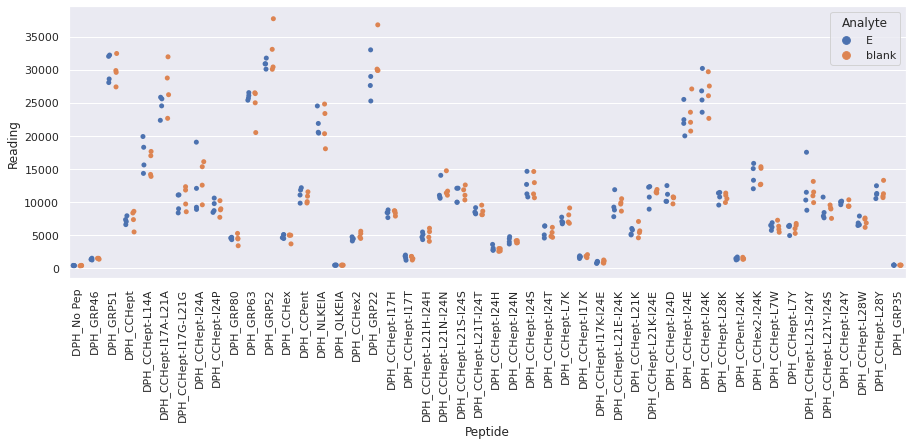

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_6.xlsx
Drawing scatter plot of data spread for R_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

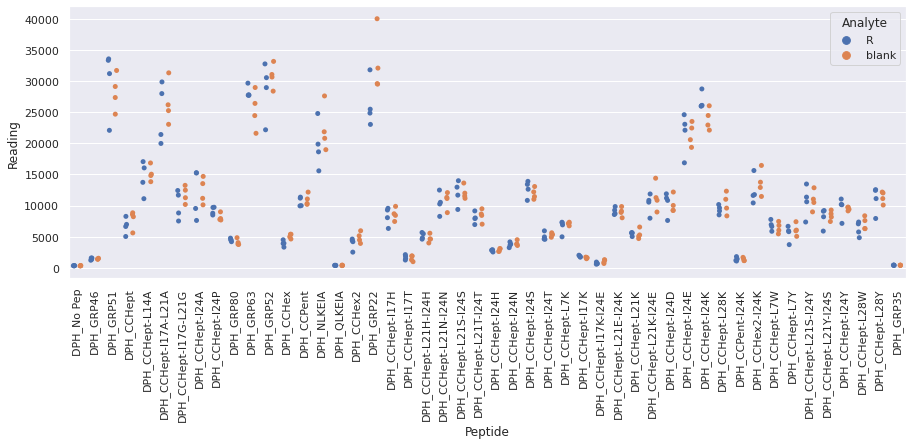

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_6.xlsx
Drawing scatter plot of data spread for S_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

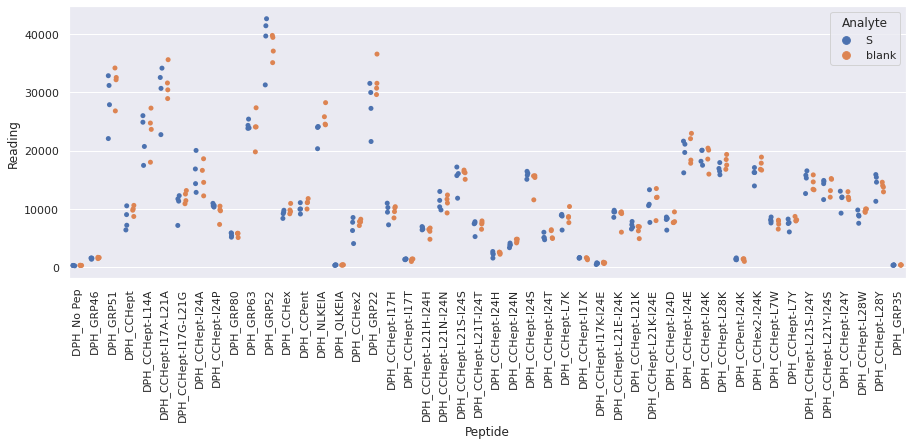

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_6.xlsx
Drawing scatter plot of data spread for V_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

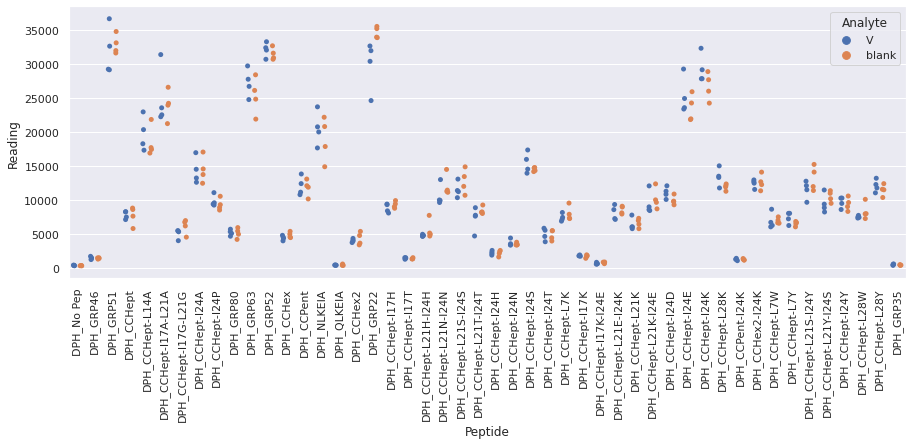

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_6.xlsx
Drawing scatter plot of data spread for W_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

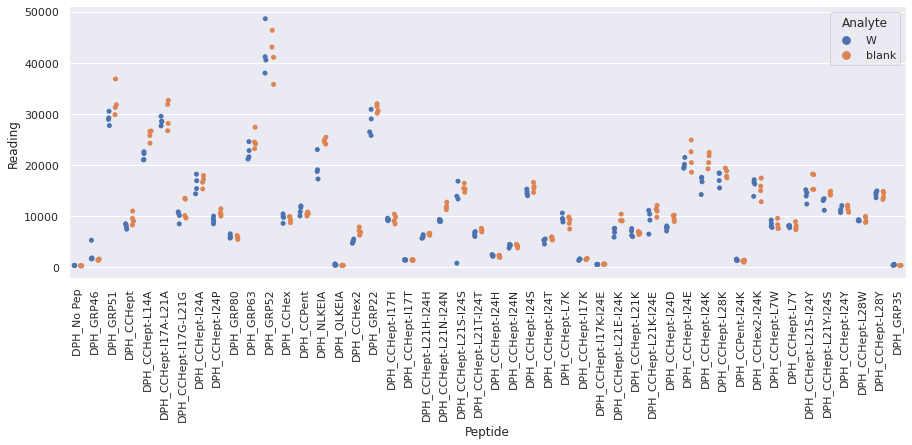

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_7.xlsx
Drawing scatter plot of data spread for E_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

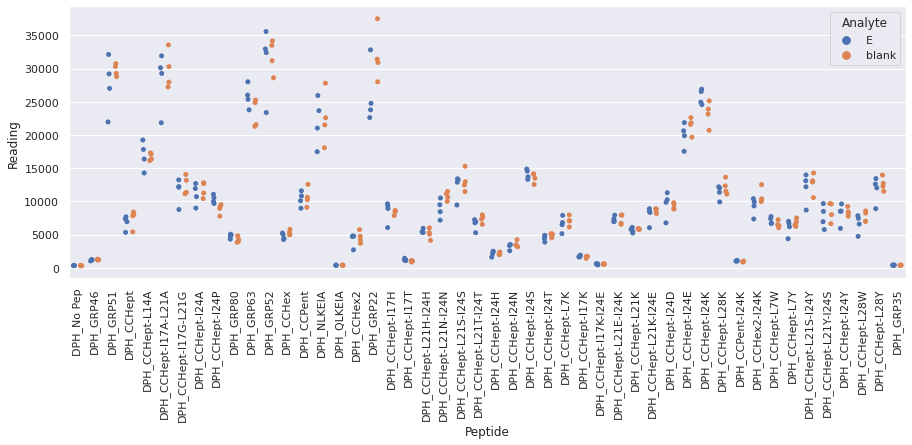

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_7.xlsx
Drawing scatter plot of data spread for R_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

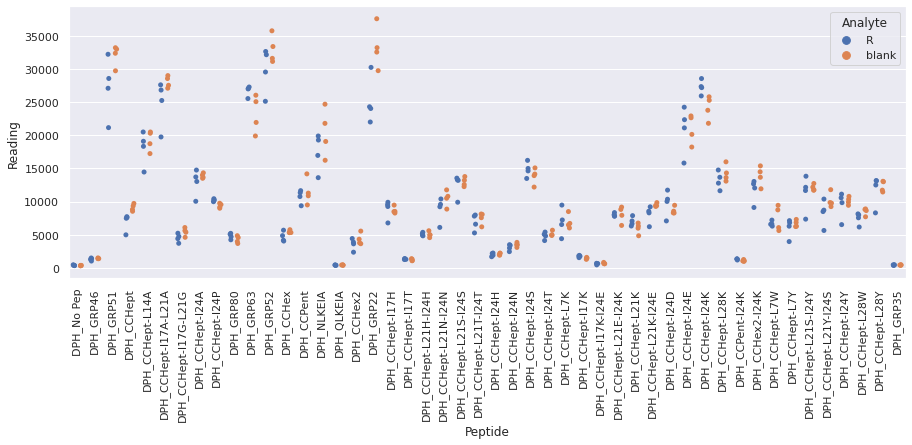

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_7.xlsx
Drawing scatter plot of data spread for S_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

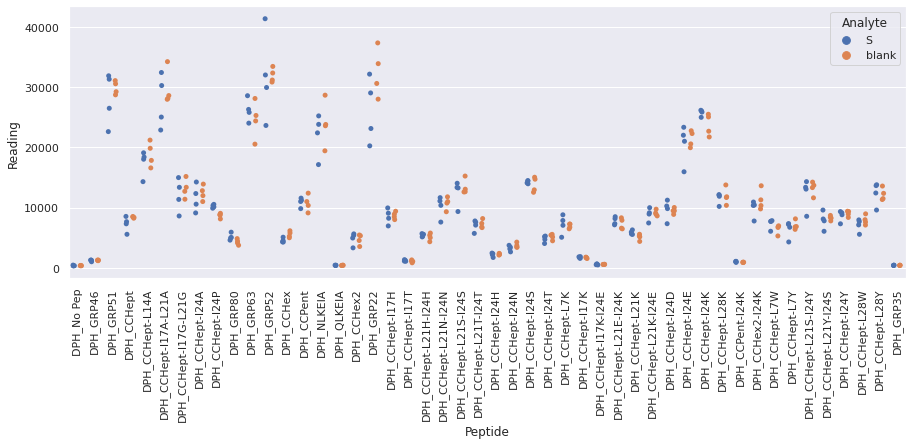

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_7.xlsx
Drawing scatter plot of data spread for V_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

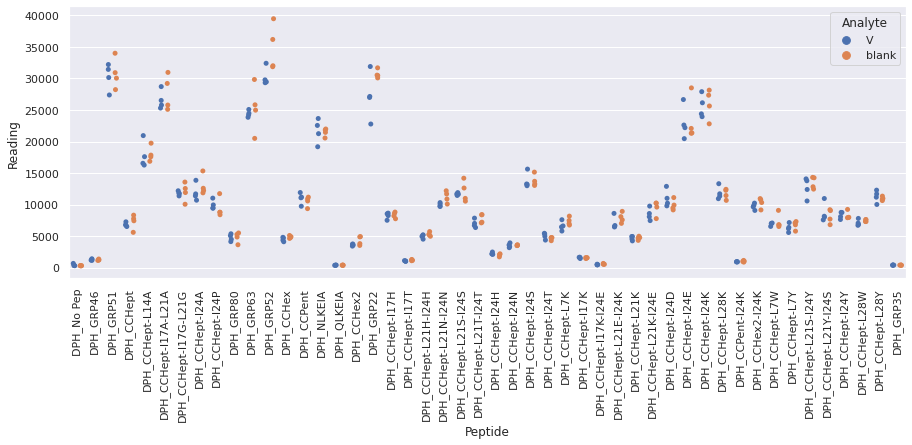

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_7.xlsx
Drawing scatter plot of data spread for W_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

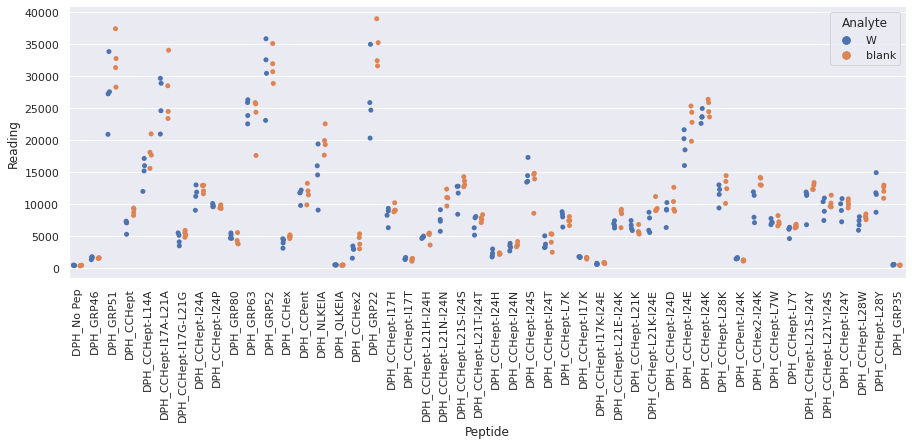

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_8.xlsx
Drawing scatter plot of data spread for E_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

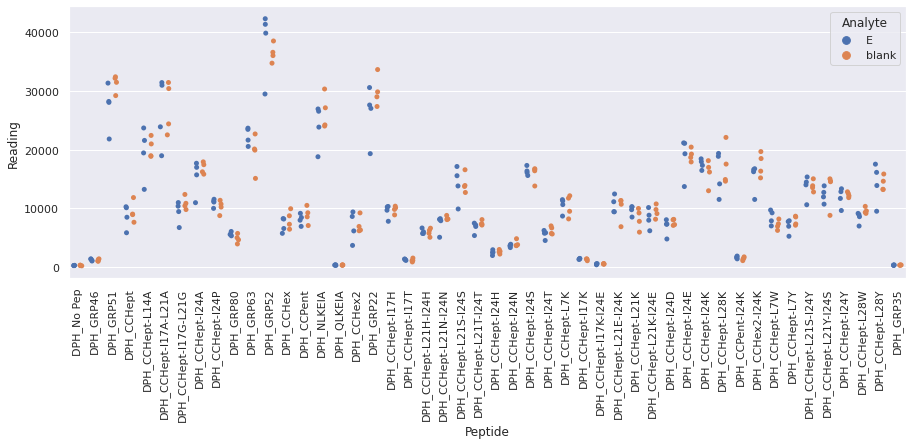

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_8.xlsx
Drawing scatter plot of data spread for R_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

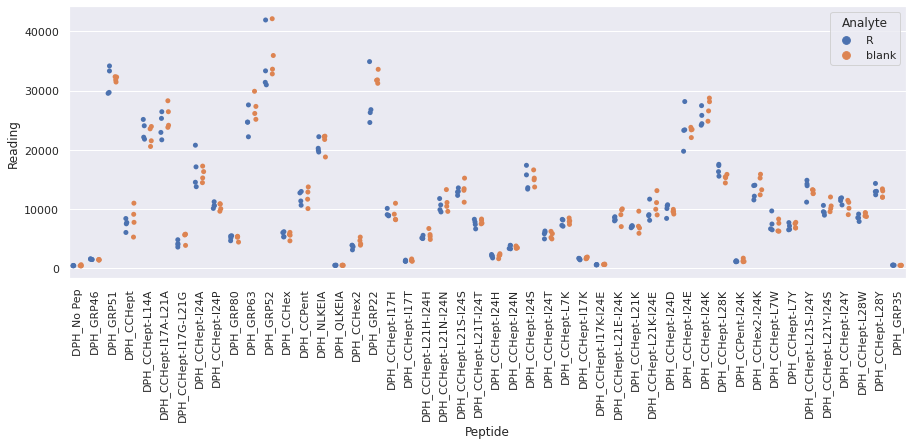

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_8.xlsx
Drawing scatter plot of data spread for S_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

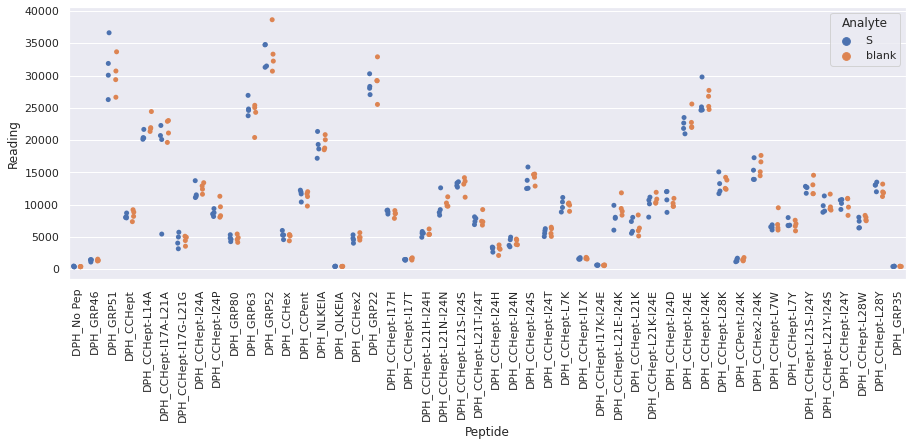

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_8.xlsx
Drawing scatter plot of data spread for V_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

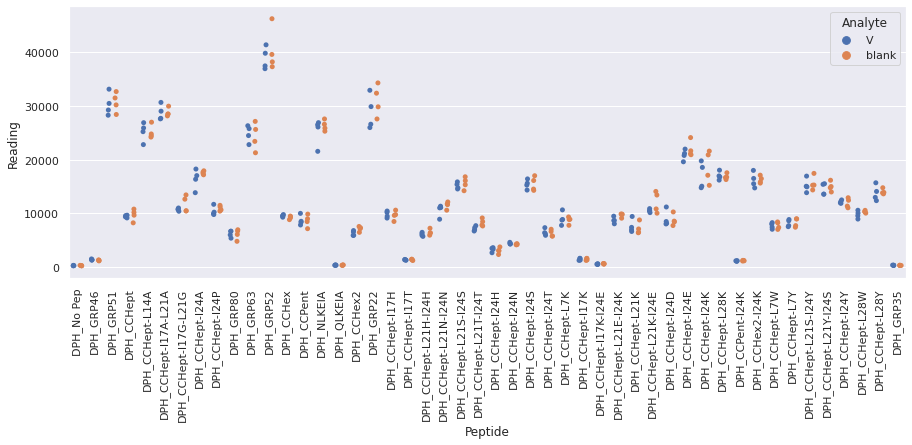

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_8.xlsx
Drawing scatter plot of data spread for W_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

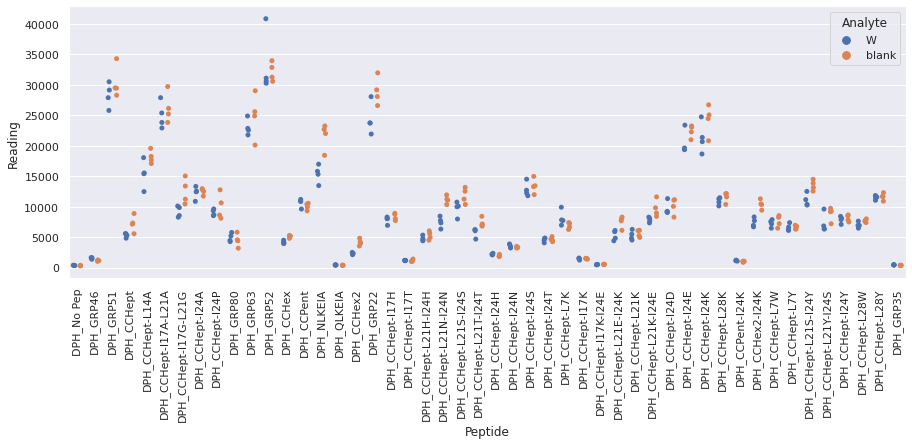

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_9.xlsx
Drawing scatter plot of data spread for E_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

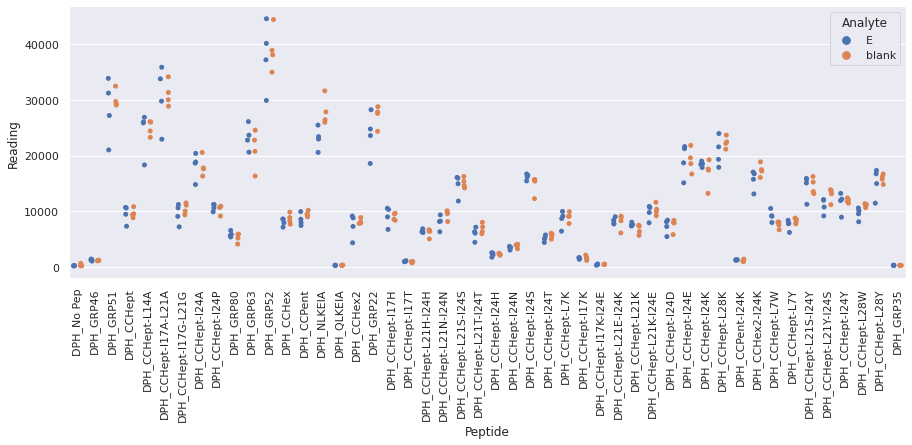

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx
Drawing scatter plot of data spread for R_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

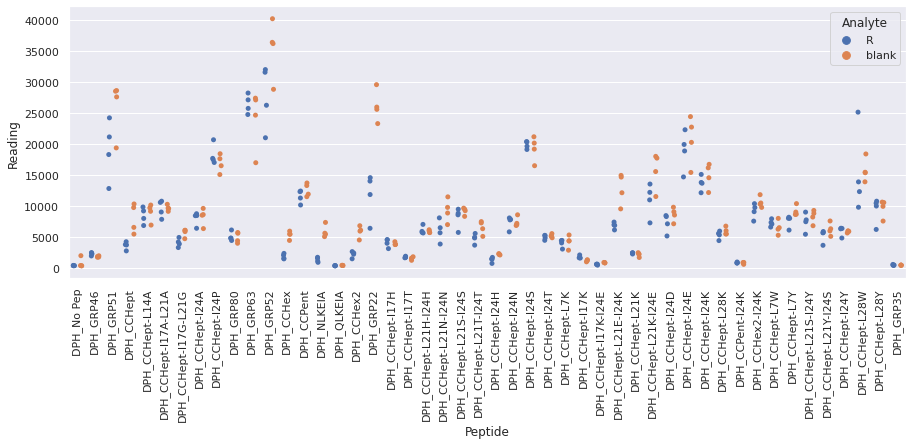

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_9.xlsx
Drawing scatter plot of data spread for S_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

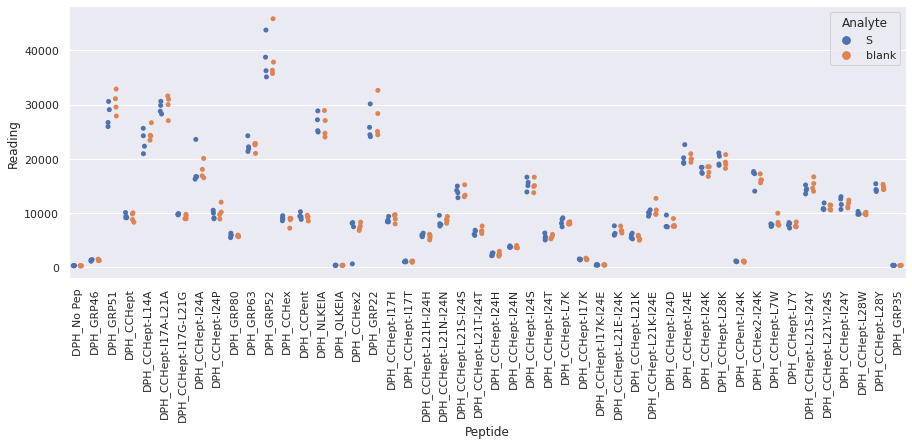

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_9.xlsx
Drawing scatter plot of data spread for V_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

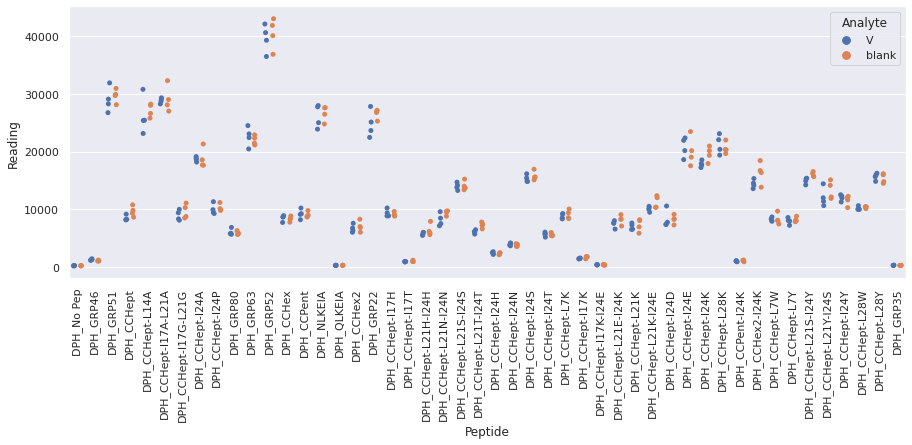

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_9.xlsx
Drawing scatter plot of data spread for W_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

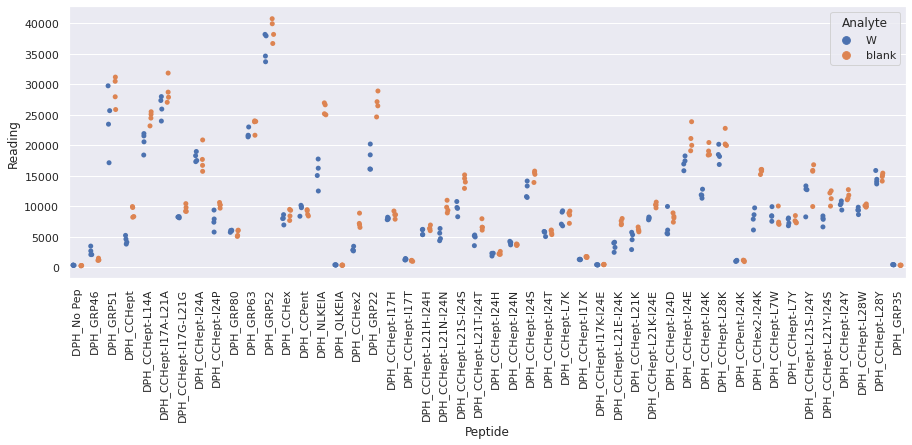

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_10.xlsx
Drawing scatter plot of data spread for E_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

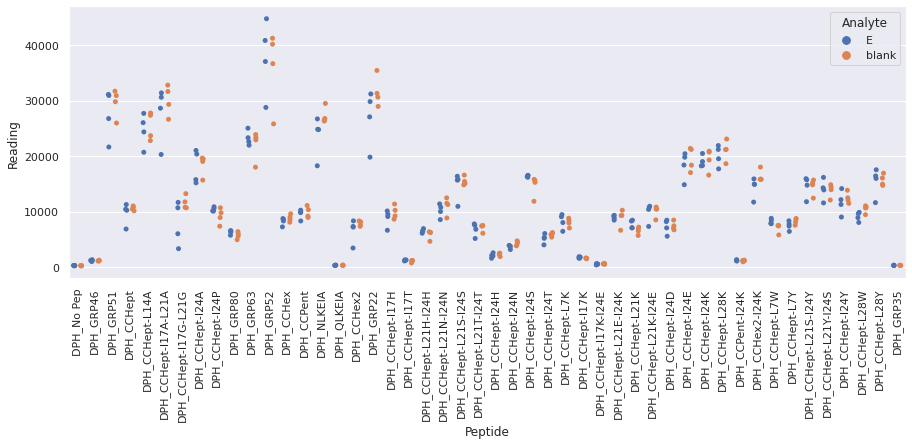

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_10.xlsx
Drawing scatter plot of data spread for R_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

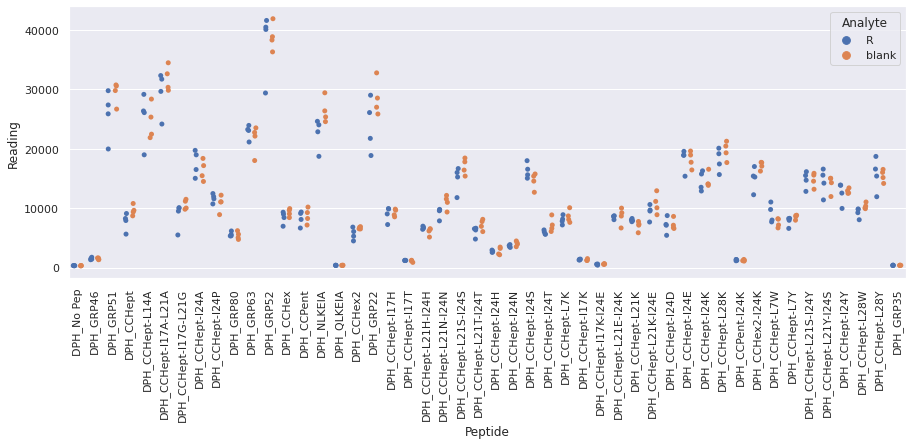

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_10.xlsx
Drawing scatter plot of data spread for S_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

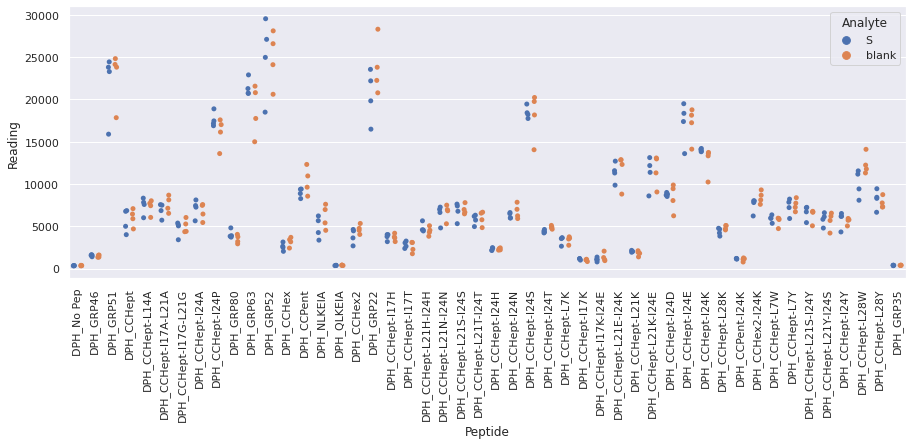

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_10.xlsx
Drawing scatter plot of data spread for V_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

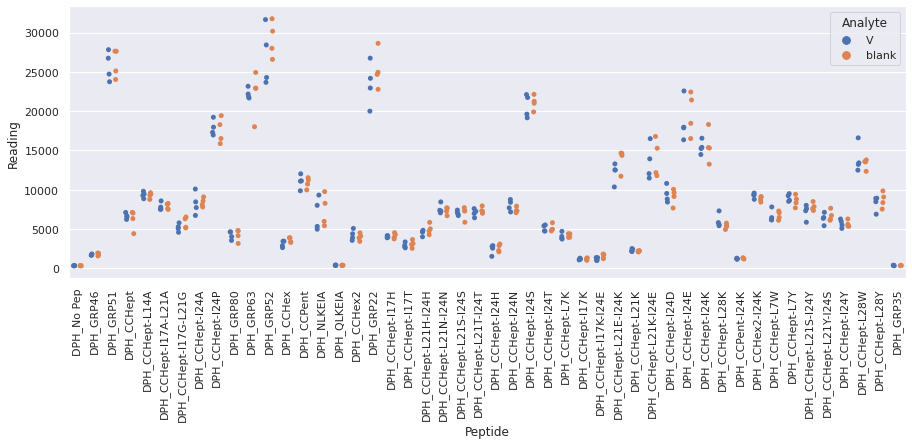

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_10.xlsx
Drawing scatter plot of data spread for W_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

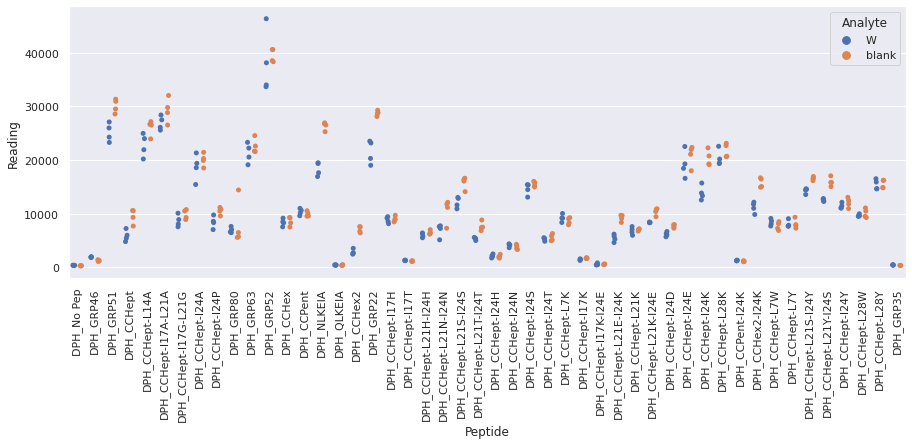

Drawing scatter plot of data spread for E_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

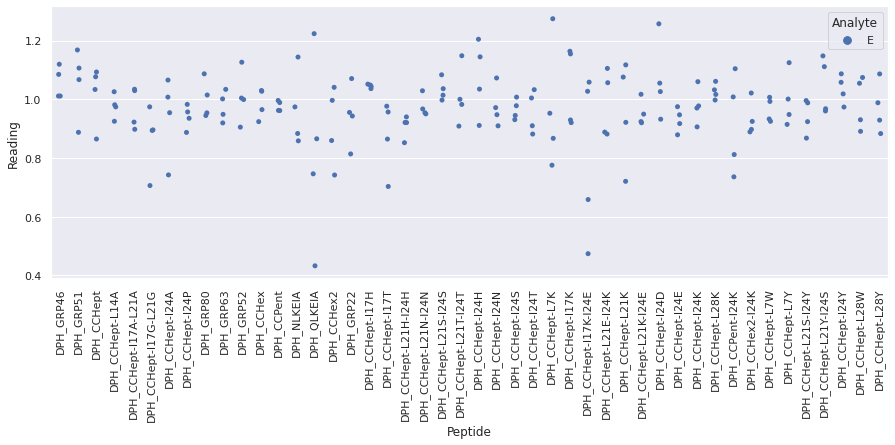

Drawing scatter plot of data spread for R_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

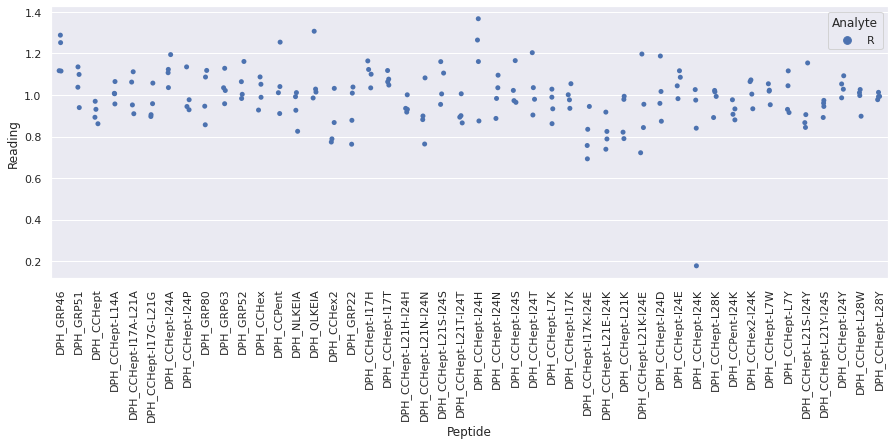

Drawing scatter plot of data spread for S_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

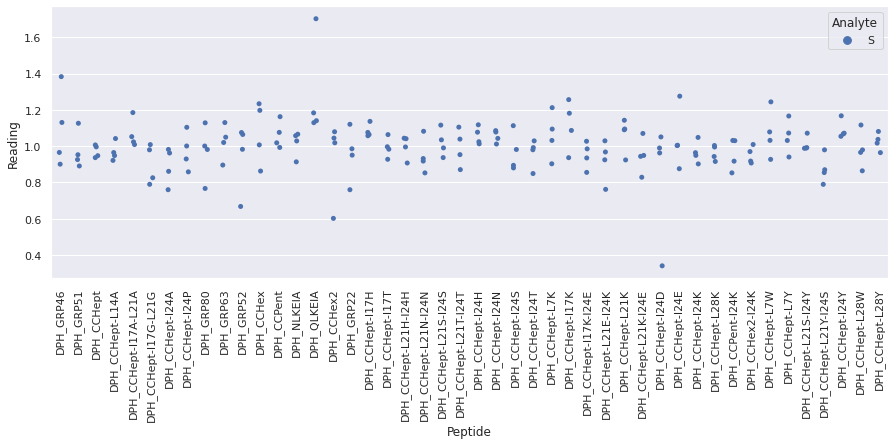

Drawing scatter plot of data spread for V_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

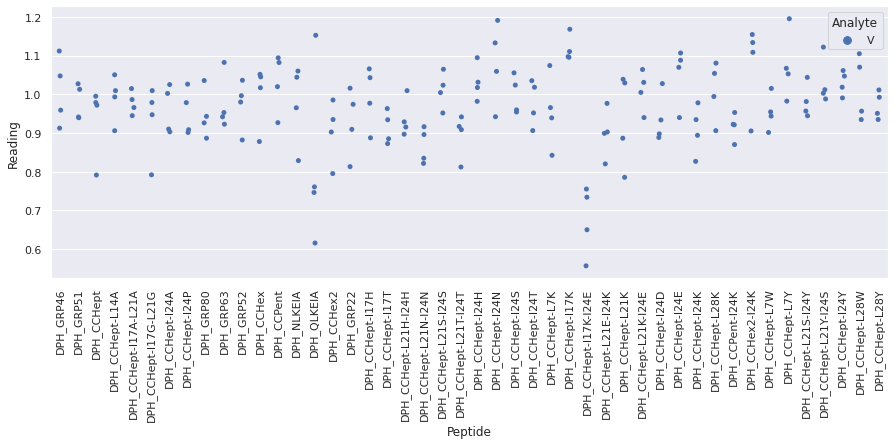

Drawing scatter plot of data spread for W_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

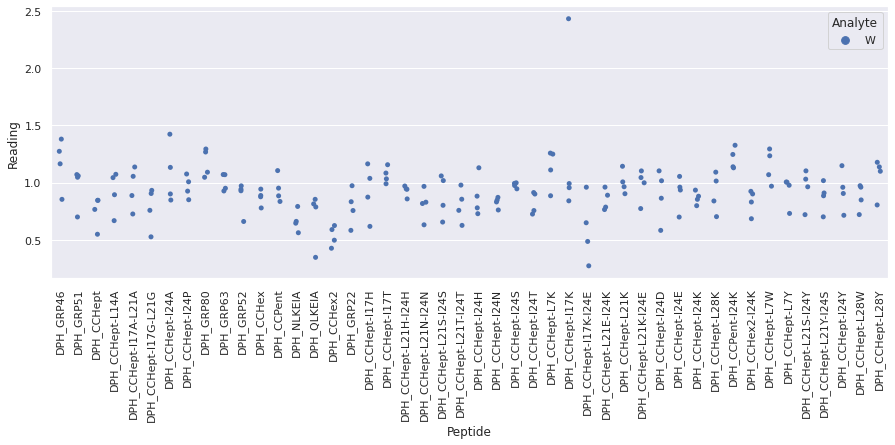

Drawing scatter plot of data spread for E_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

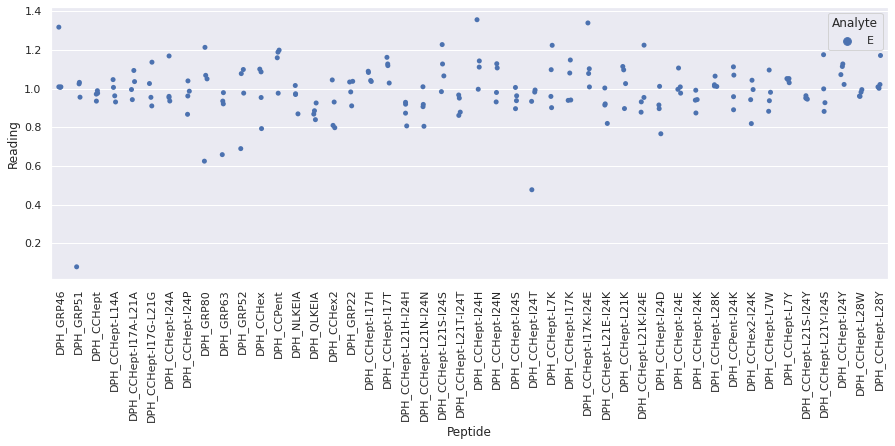

Drawing scatter plot of data spread for R_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

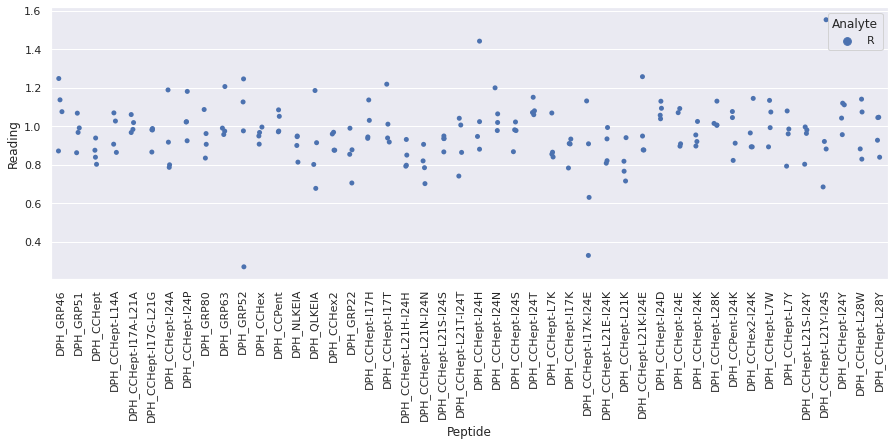

Drawing scatter plot of data spread for S_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

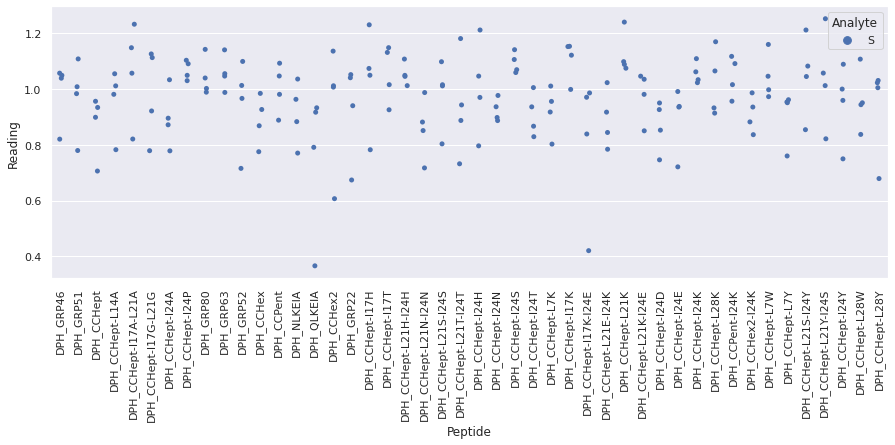

Drawing scatter plot of data spread for V_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

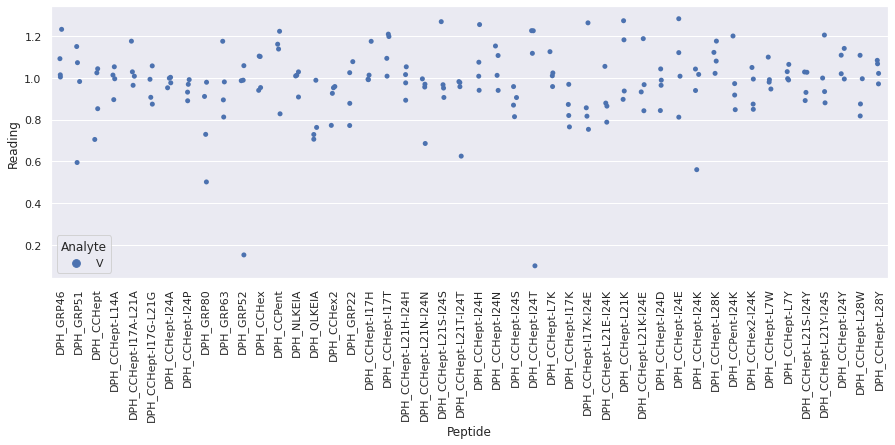

Drawing scatter plot of data spread for W_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

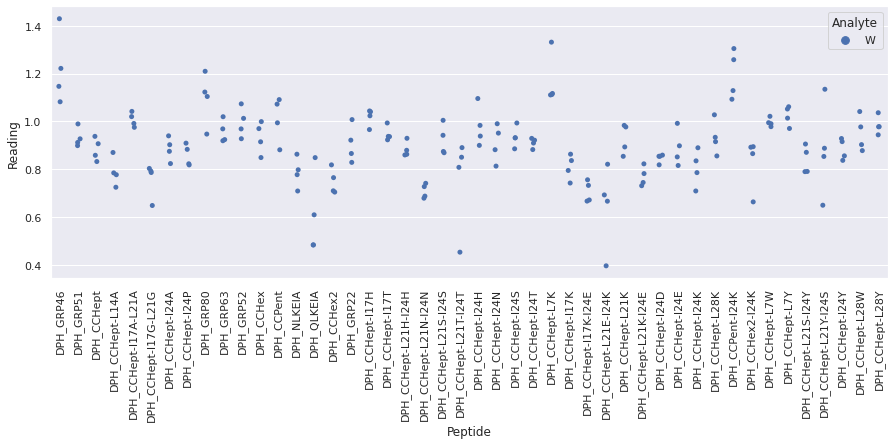

Drawing scatter plot of data spread for E_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

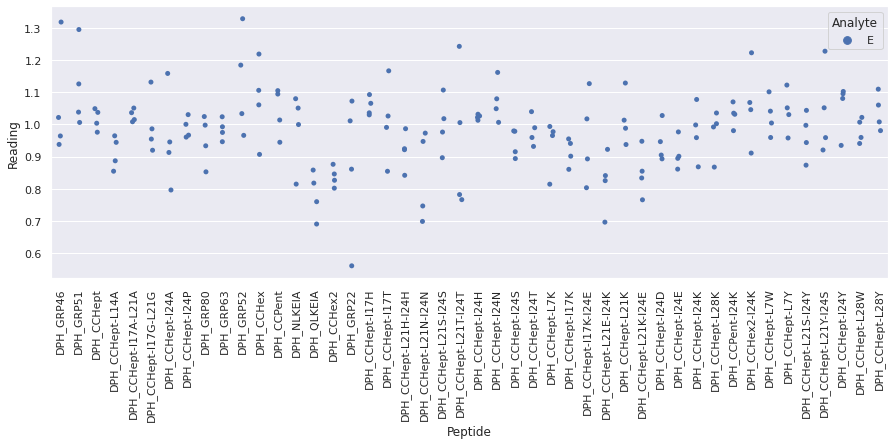

Drawing scatter plot of data spread for R_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

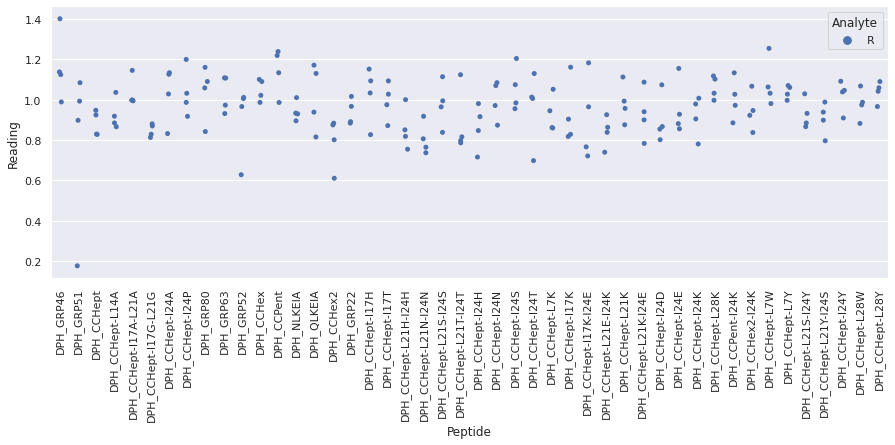

Drawing scatter plot of data spread for S_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

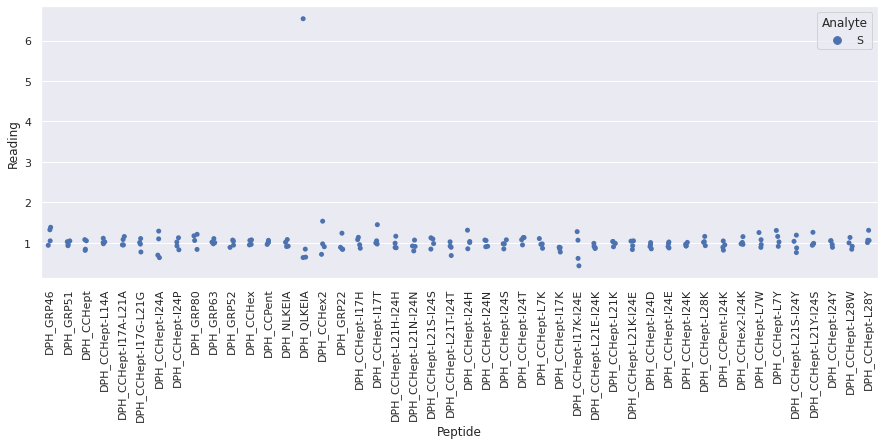

Drawing scatter plot of data spread for V_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

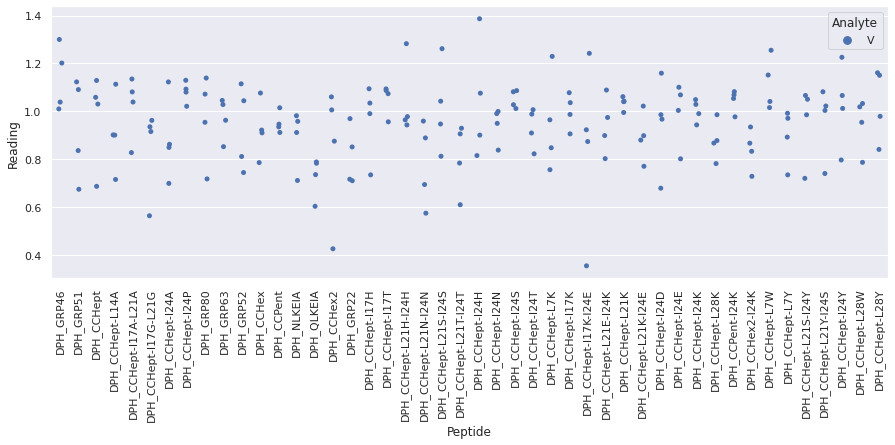

Drawing scatter plot of data spread for W_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

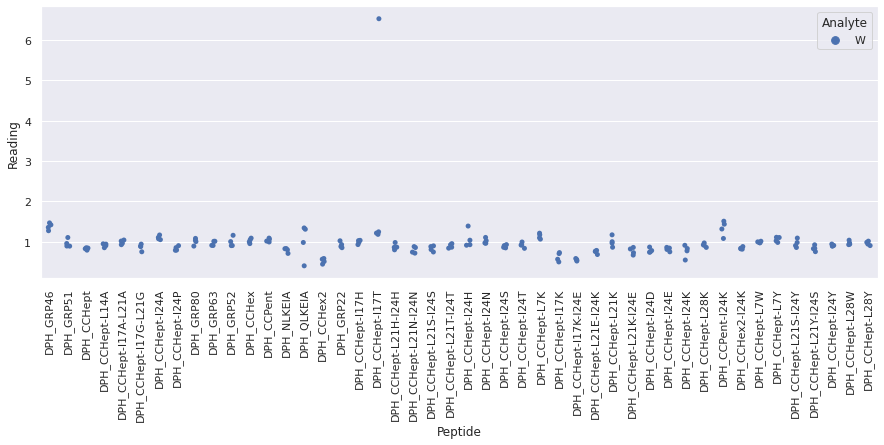

Drawing scatter plot of data spread for E_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

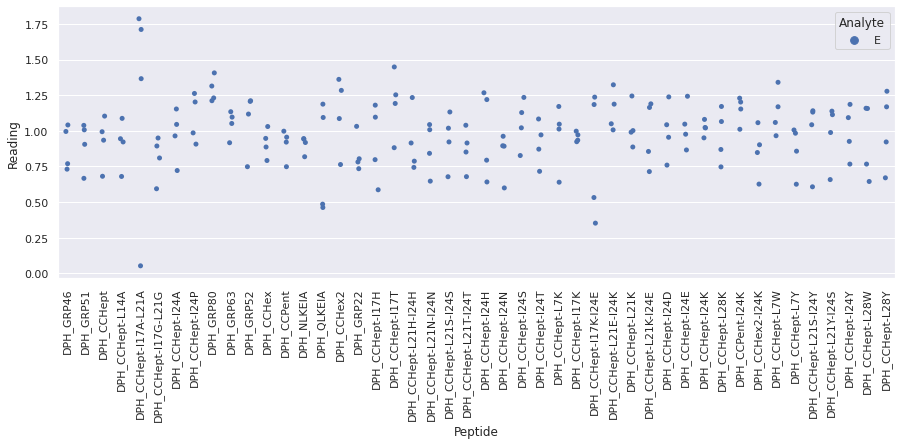

Drawing scatter plot of data spread for R_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

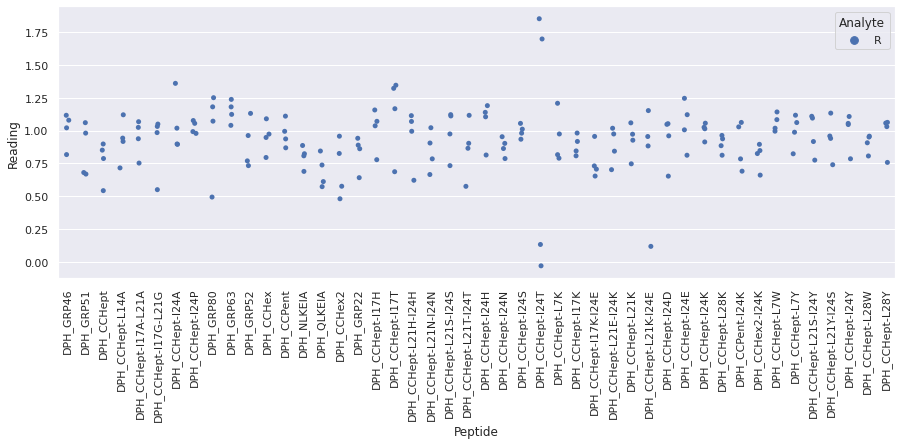

Drawing scatter plot of data spread for S_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

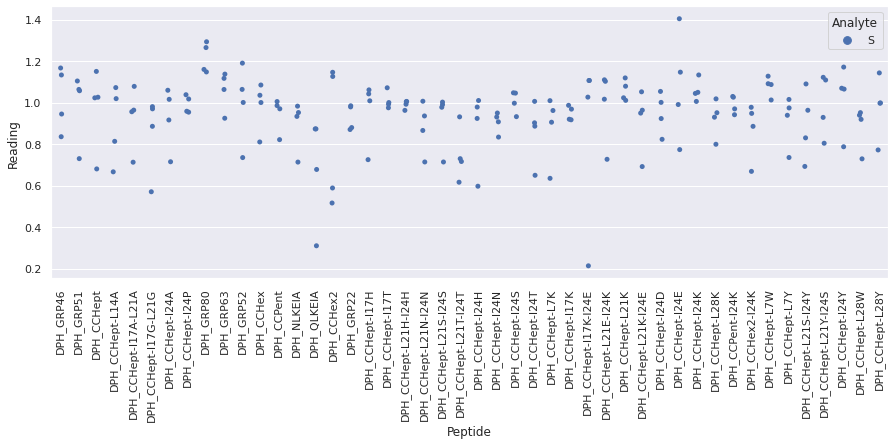

Drawing scatter plot of data spread for V_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

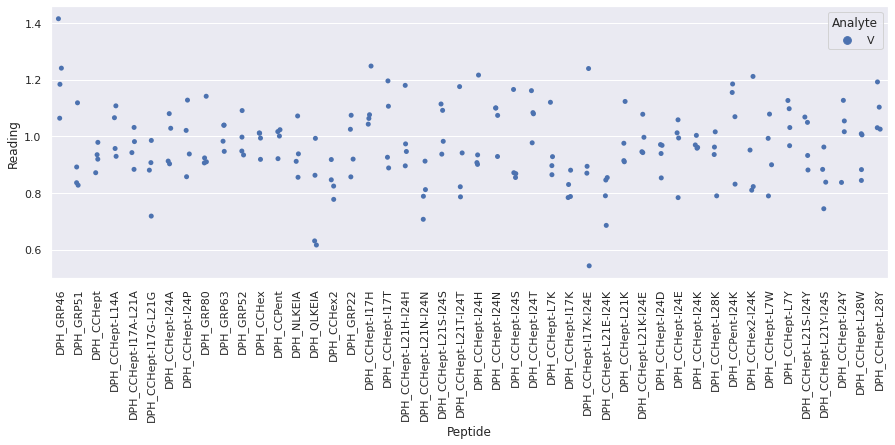

Drawing scatter plot of data spread for W_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

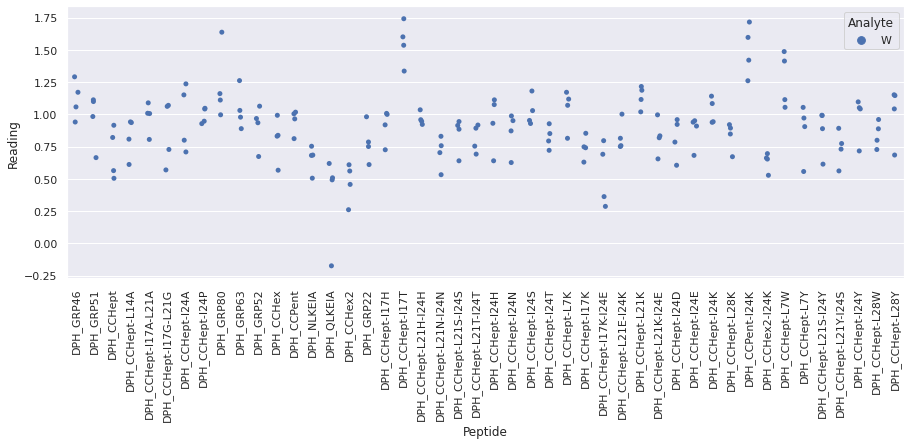

Drawing scatter plot of data spread for E_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

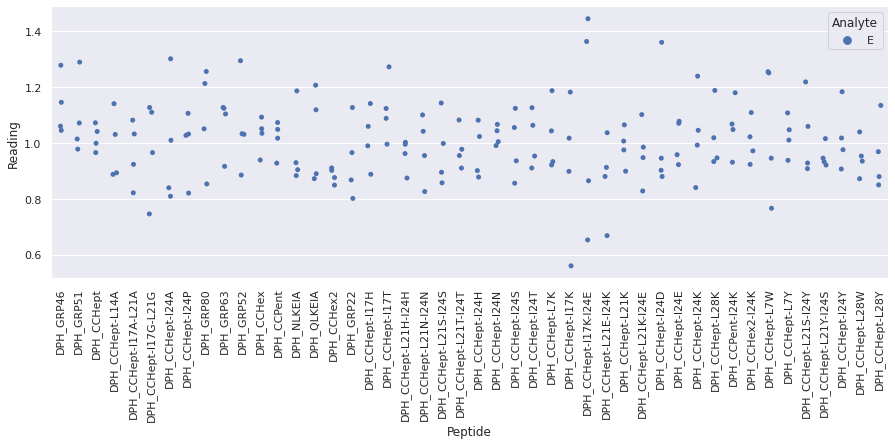

Drawing scatter plot of data spread for R_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

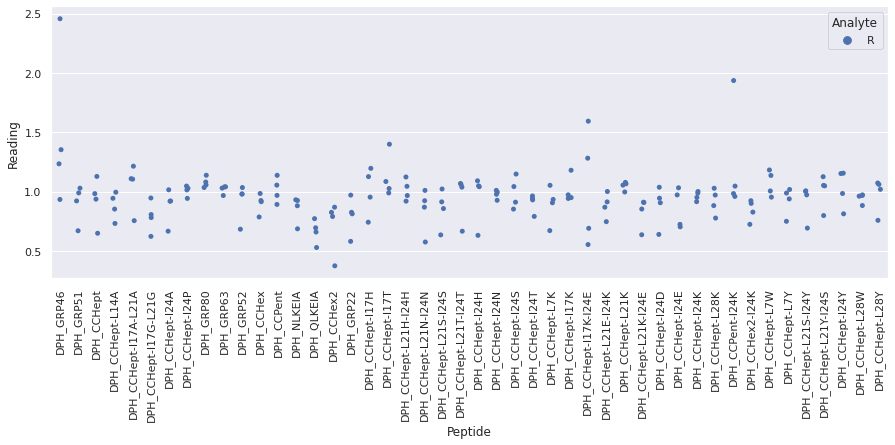

Drawing scatter plot of data spread for S_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

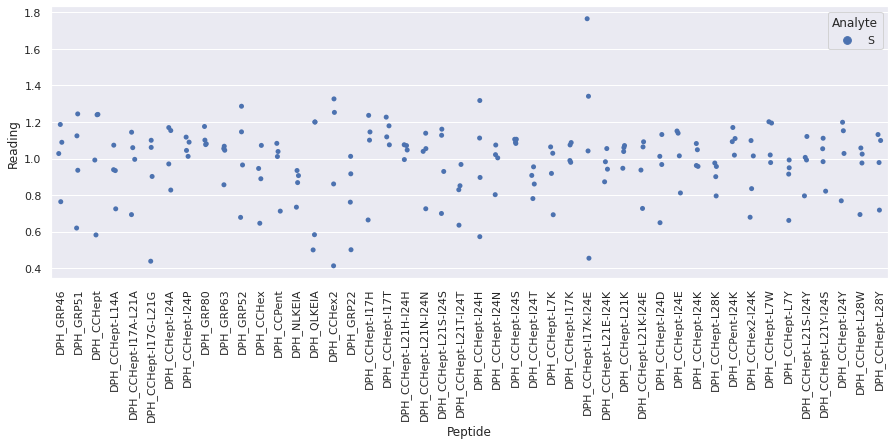

Drawing scatter plot of data spread for V_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

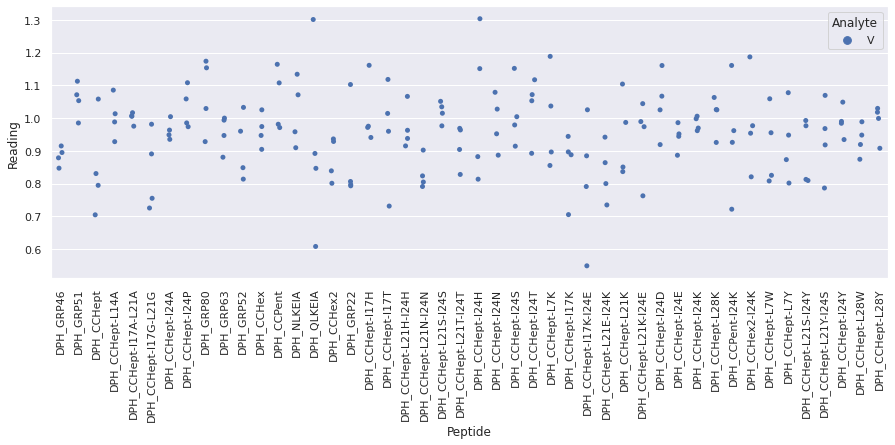

Drawing scatter plot of data spread for W_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

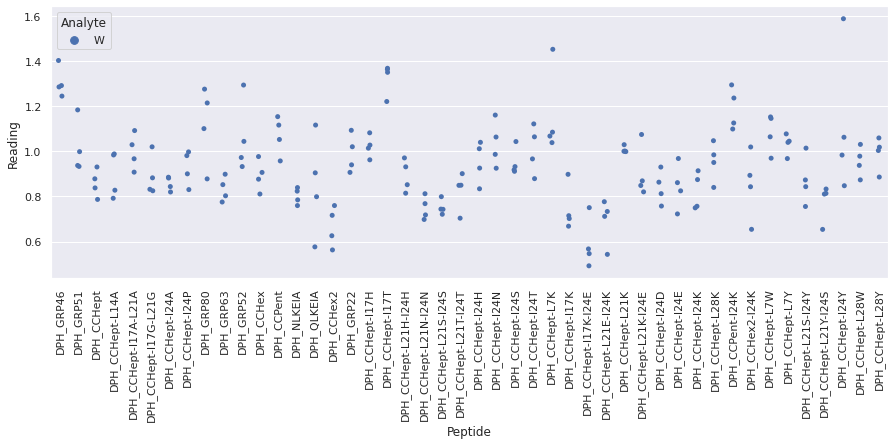

Drawing scatter plot of data spread for E_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

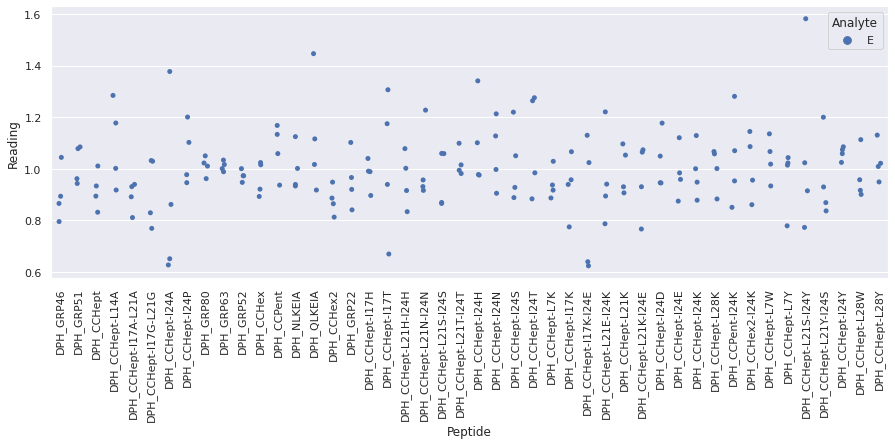

Drawing scatter plot of data spread for R_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

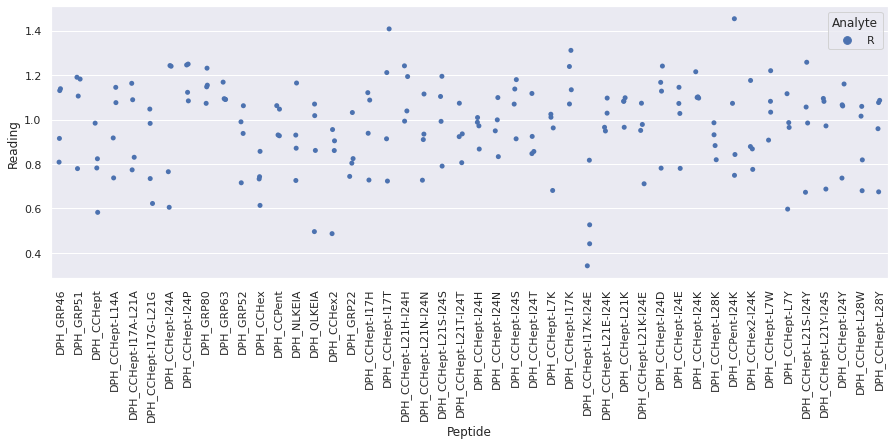

Drawing scatter plot of data spread for S_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

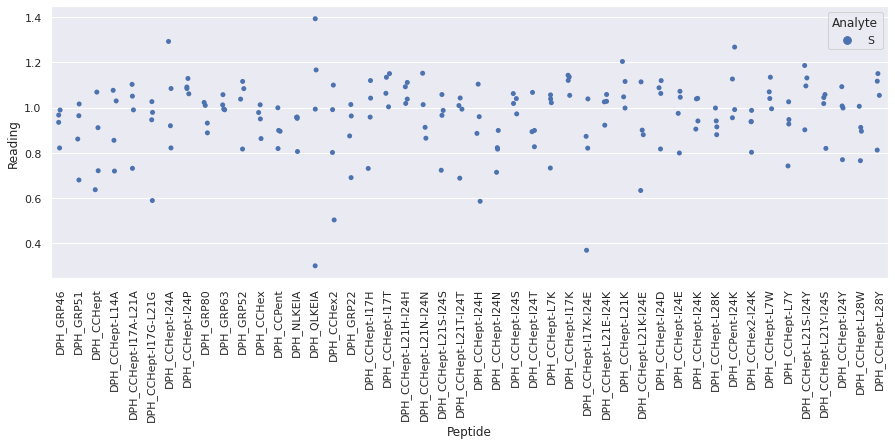

Drawing scatter plot of data spread for V_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

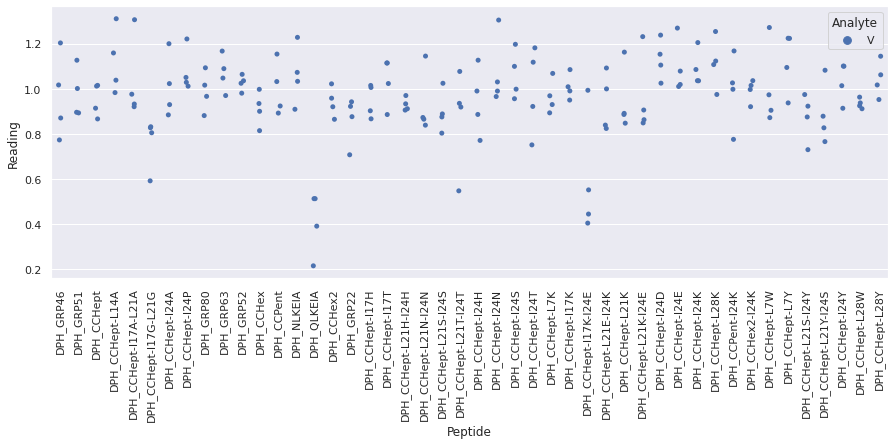

Drawing scatter plot of data spread for W_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

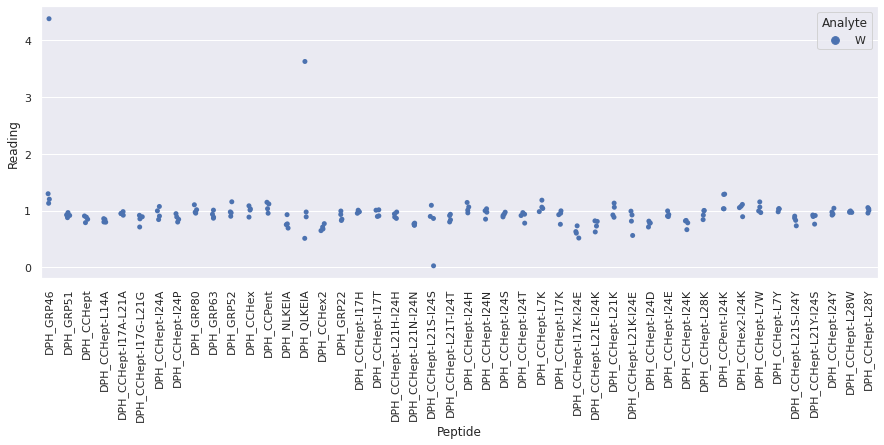

Drawing scatter plot of data spread for E_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

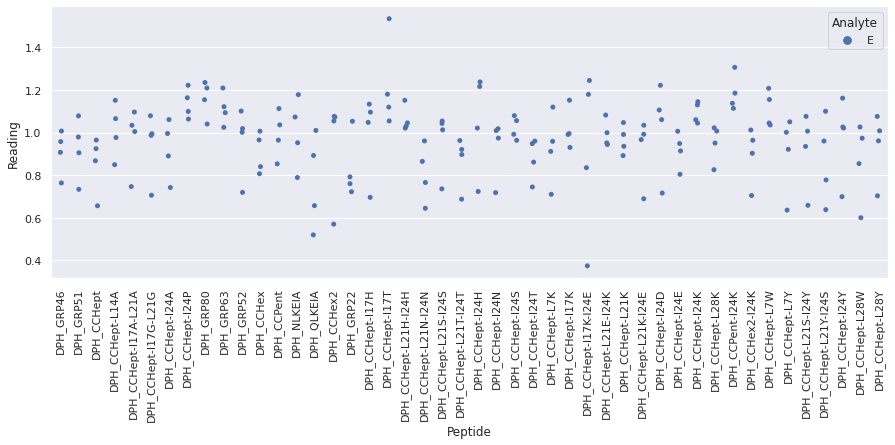

Drawing scatter plot of data spread for R_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

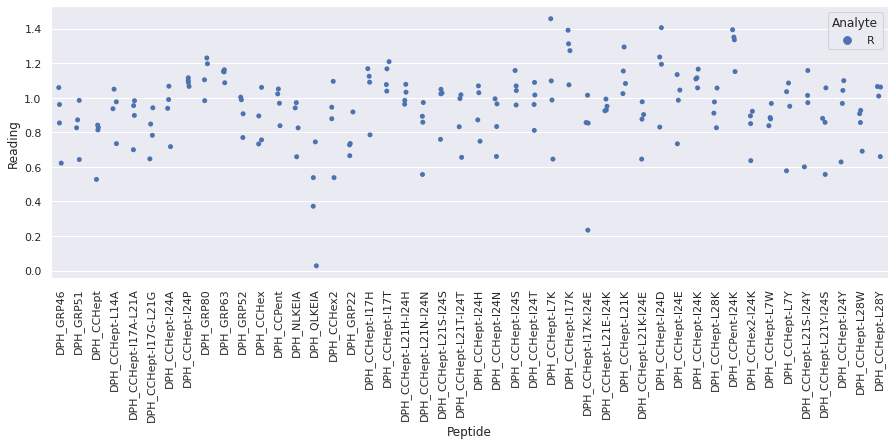

Drawing scatter plot of data spread for S_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

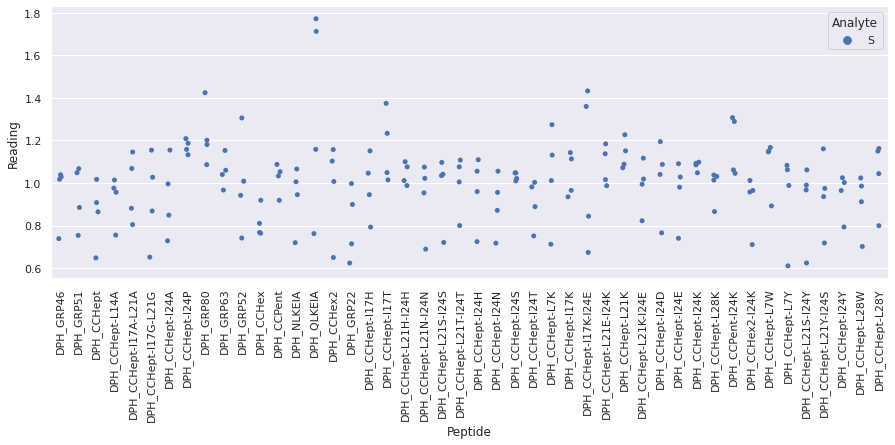

Drawing scatter plot of data spread for V_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

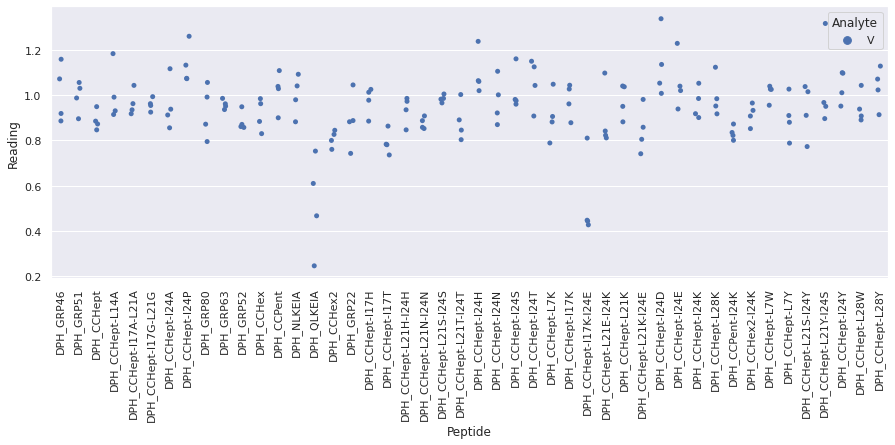

Drawing scatter plot of data spread for W_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

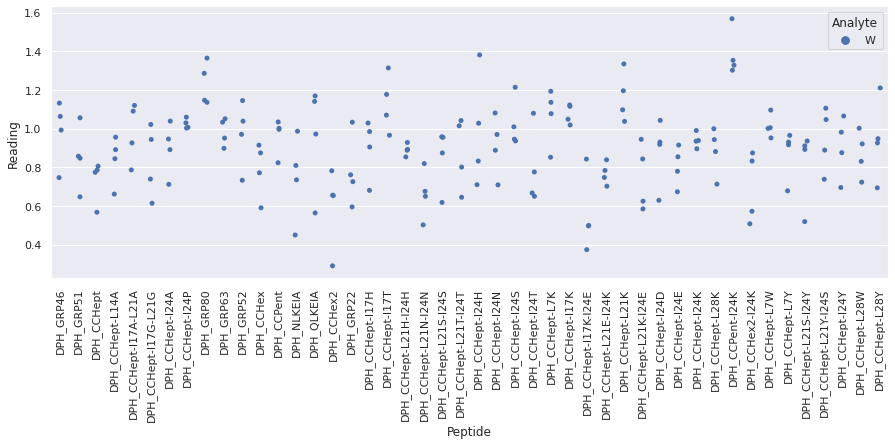

Drawing scatter plot of data spread for E_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

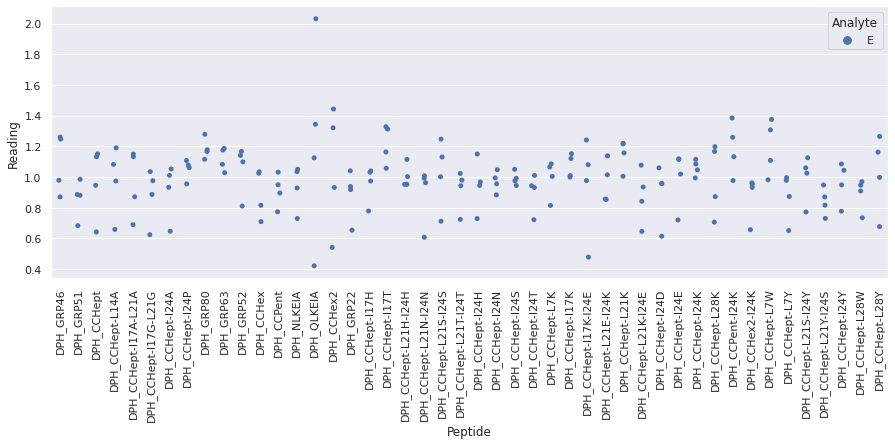

Drawing scatter plot of data spread for R_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

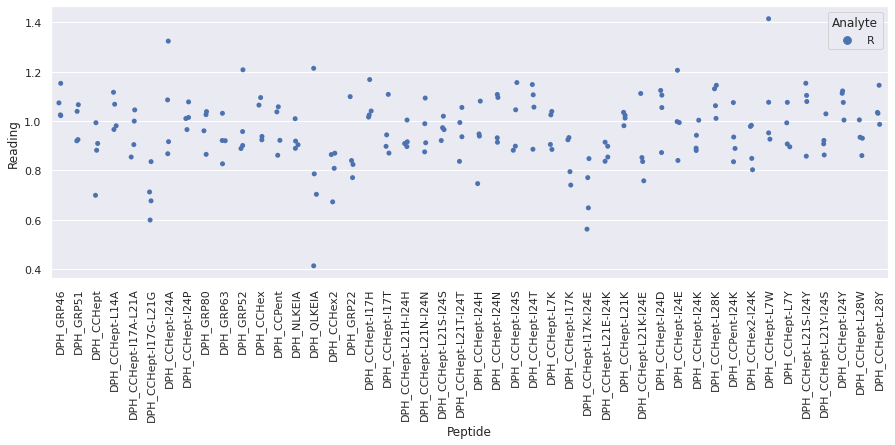

Drawing scatter plot of data spread for S_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

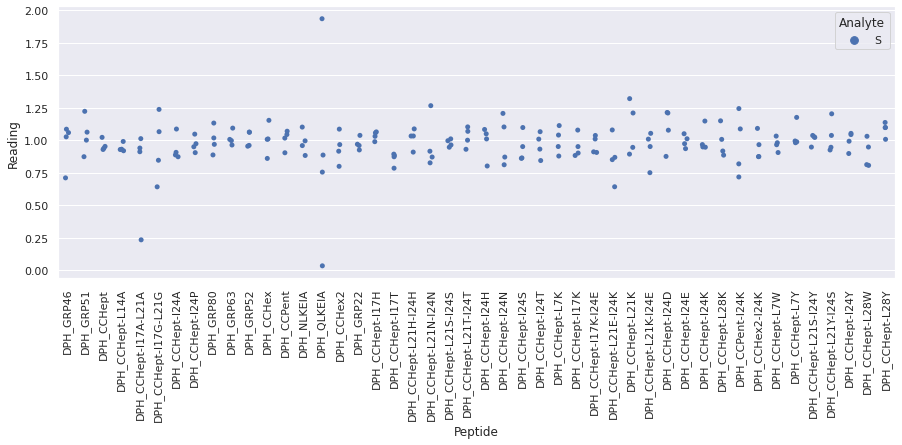

Drawing scatter plot of data spread for V_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

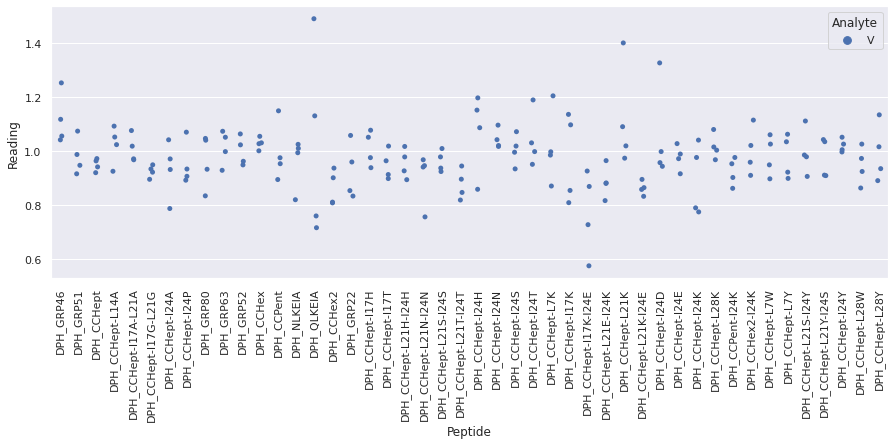

Drawing scatter plot of data spread for W_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

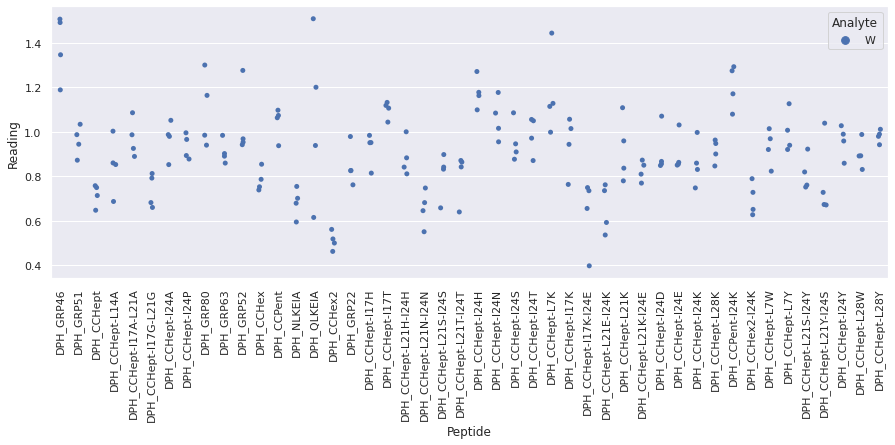

Drawing scatter plot of data spread for E_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

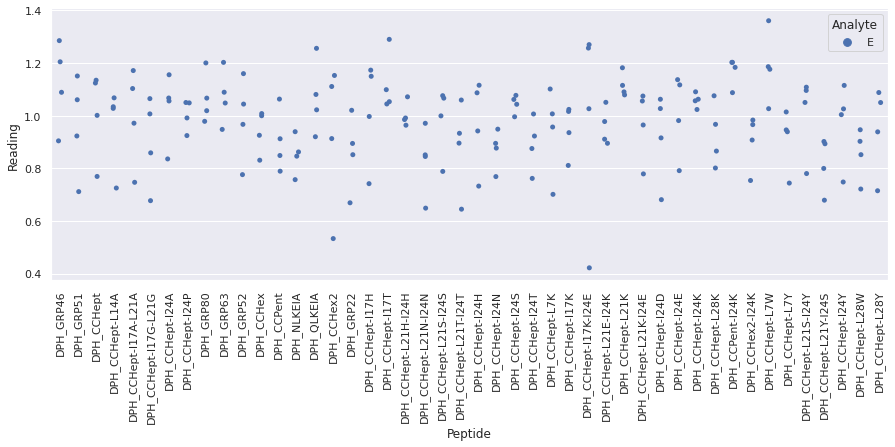

 WARNING - median fluorescence of (R + DPH_QLKEIA + fluorophore) is less than fluorescence of (R + fluorophore) alone on plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for R_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

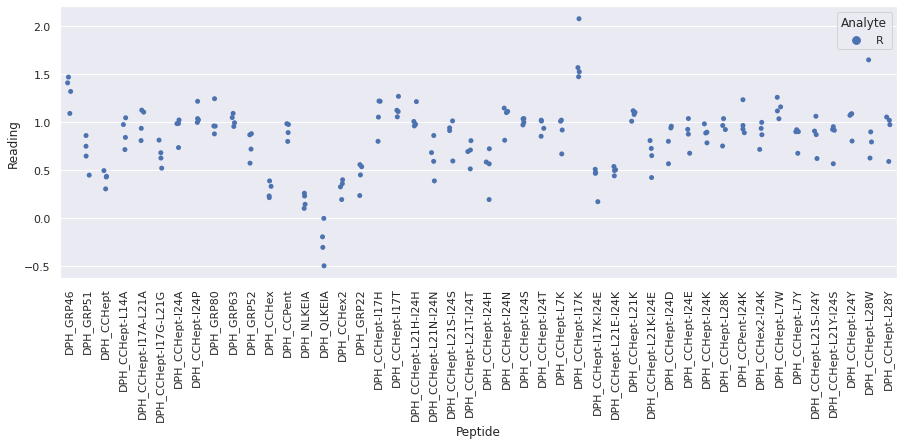

Drawing scatter plot of data spread for S_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

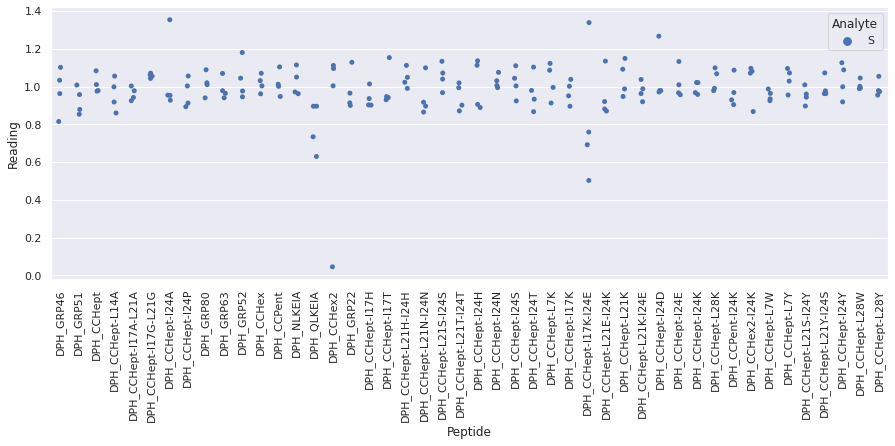

Drawing scatter plot of data spread for V_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

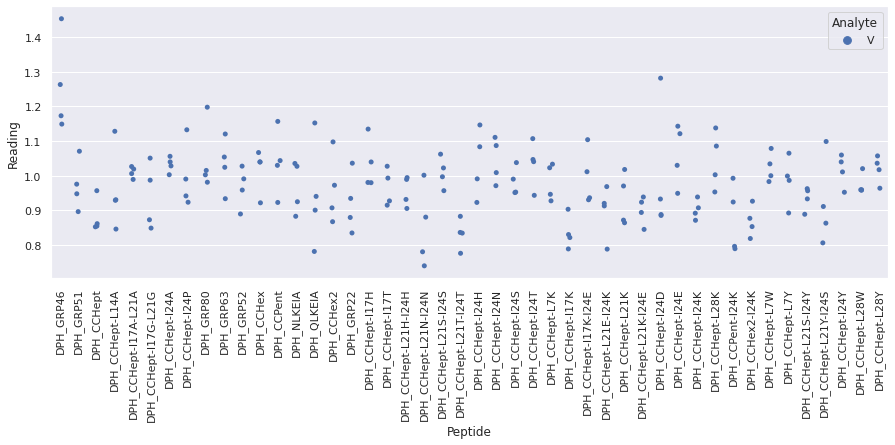

Drawing scatter plot of data spread for W_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

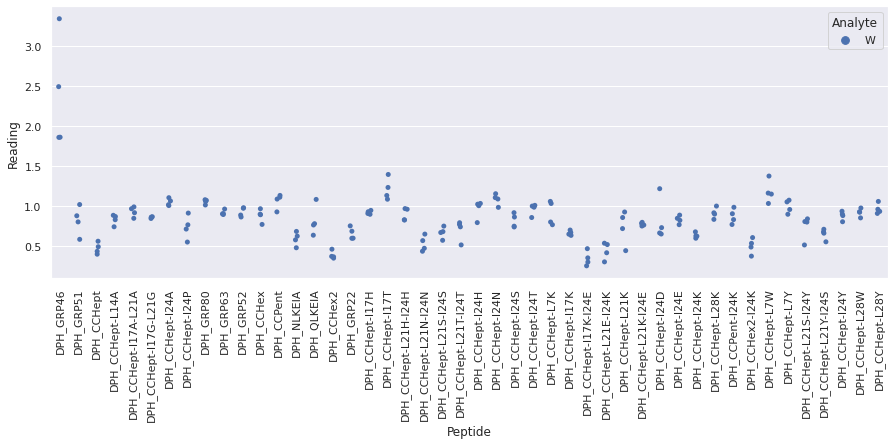

Drawing scatter plot of data spread for E_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

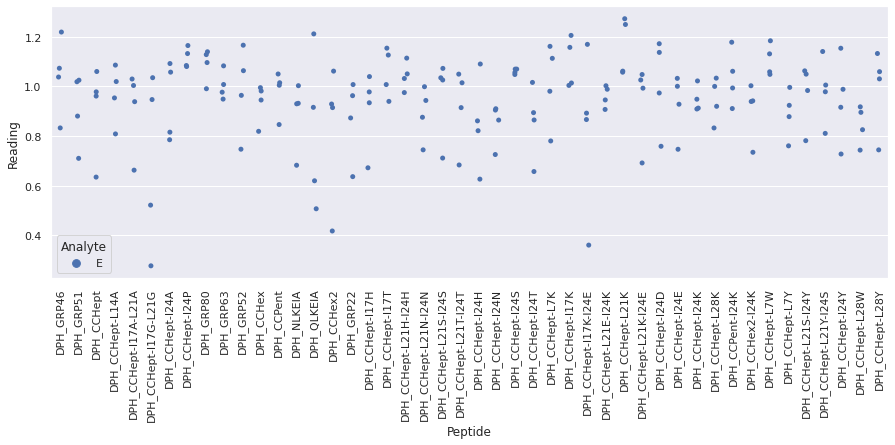

Drawing scatter plot of data spread for R_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

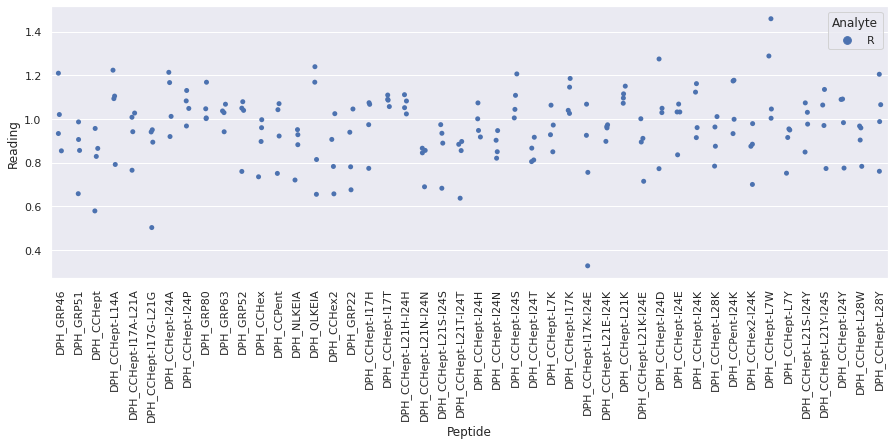

Drawing scatter plot of data spread for S_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

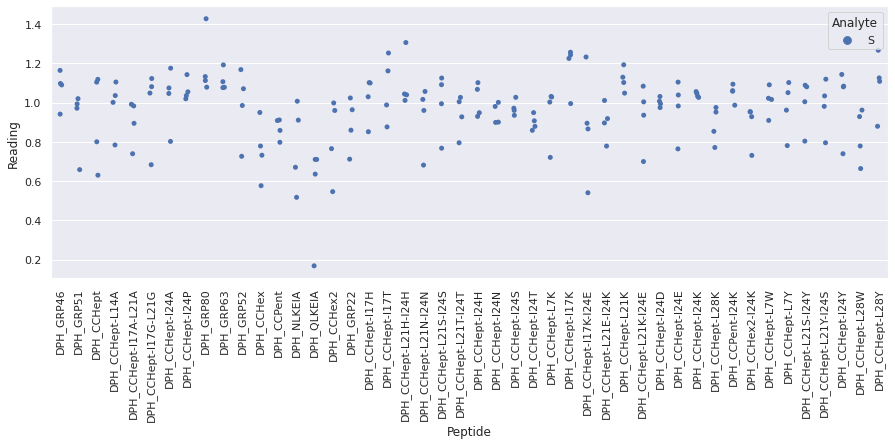

Drawing scatter plot of data spread for V_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

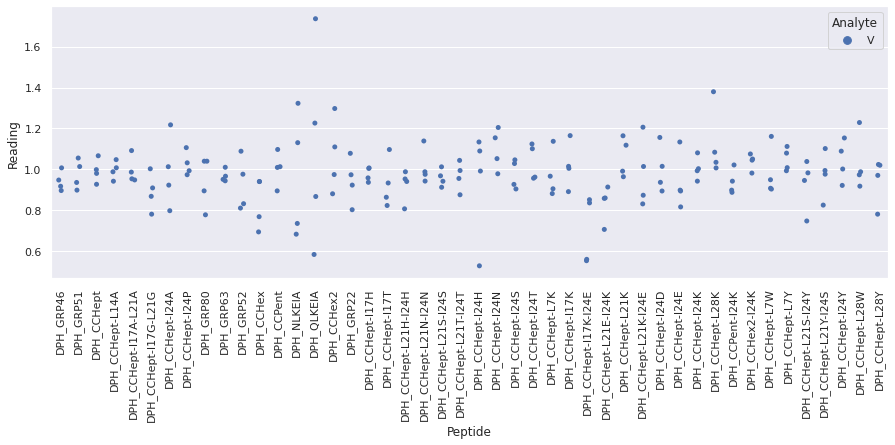

Drawing scatter plot of data spread for W_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

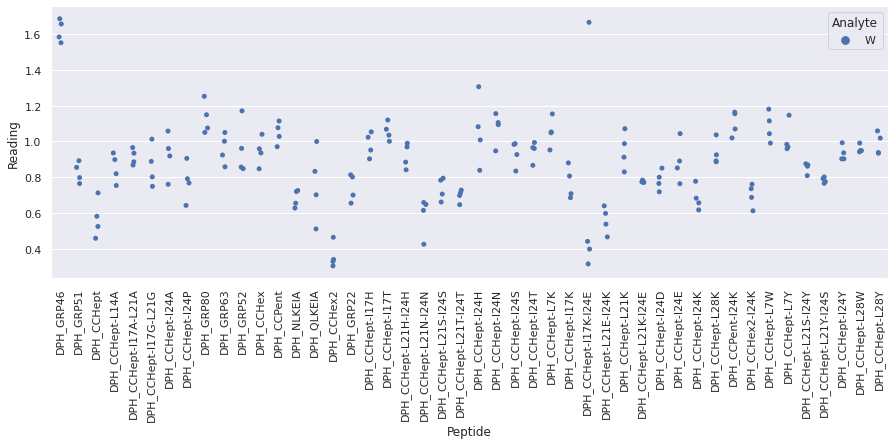



Outliers on the same plate:

/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_No Pep, 284.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept, 7562.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I17T, 1685.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24N, 6263.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24T, 5537.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-L7W, 11393.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: R, DPH_QLKEIA, 494.0
/home/ks17

In [6]:
aa_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='AA'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-I24E in the presence of DPH is very similar to that of DPH on its own. Consequently, the min-max scaled readings of these peptides are likely to contain large amounts of noise => may need to discard these peptides from the analysis if the variation in readings obtained for the same analyte with these peptides is high.
- There is not much difference in the fluorescence signal in the presence and absence of analyte => the analytes are not causing much displacement/change of interaction of DPH with the peptide. Tryptophan has a greater effect than the other analytes.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
aa_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_R: R, DPH_QLKEIA, 1.3071428571428572
repeat_1_S: S, DPH_QLKEIA, 1.7027027027027026
repeat_1_S: S, DPH_CCHex2, 0.6022068965517241
repeat_1_S: S, DPH_CCHept-I24D, 0.3405367049412979
repeat_1_S: S, DPH_CCHept-L21S-I24Y, 1.0717790863668808
repeat_1_S: S, DPH_CCHept-I24Y, 1.1675653499003633
repeat_1_V: V, DPH_CCHept, 0.7914523851746763
repeat_1_W: W, DPH_GRP51, 0.6993677535193781
repeat_1_W: W, DPH_GRP52, 0.6598825944052933
repeat_1_W: W, DPH_QLKEIA, 0.3466666666666667
repeat_1_W: W, DPH_CCHept-I17K, 2.4305694305694305
repeat_1_W: W, DPH_CCHept-L7Y, 0.7301670602641477
repeat_2_E: E, DPH_GRP46, 1.3170498084291187
repeat_2_E: E, DPH_GRP51, 0.07872613984769064
repeat_2_E: E, DPH_CCHept-I24A, 1.1681006668100666
repeat_2_E: E, DPH_CCHept-I24T, 0.47694547807798093
repeat_2_E: E, DPH_CCHept-L28K, 1.0639455782312925
repeat_2_E: E, DPH_CCHept-L28Y, 1.1706338939197931
repeat_2_R: R, DPH_CCHept-I17G-L21G, 0.8667226309811861
repeat_2_R: R, DPH_GRP63, 1.20709982788296

 Outlier excluded from final output dataset: 8, W
DPH_GRP46               Outlier: 2.1752797016515717
DPH_GRP51                                  0.836908
DPH_CCHept                                 0.458812
DPH_CCHept-L14A                            0.845744
DPH_CCHept-I17A-L21A                       0.938521
DPH_CCHept-I17G-L21G                       0.856949
DPH_CCHept-I24A                             1.03743
DPH_CCHept-I24P                             0.73539
DPH_GRP80                                   1.06135
DPH_GRP63                                  0.900616
DPH_GRP52                                  0.926958
DPH_CCHex                                   0.89149
DPH_CCPent                                  1.09599
DPH_NLKEIA                                  0.59716
DPH_QLKEIA                                    0.768
DPH_CCHex2                                  0.36393
DPH_GRP22                                  0.638238
DPH_CCHept-I17H                            0.914785
DPH_CCHept-I17

Display range of data points across repeats for the different analytes




Original_data:


E


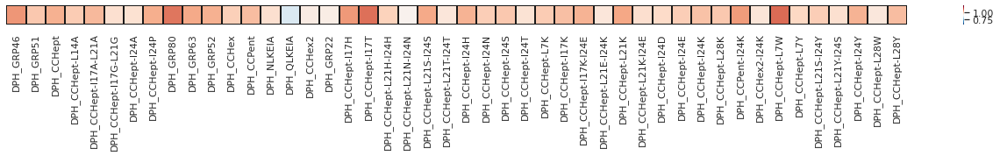


R


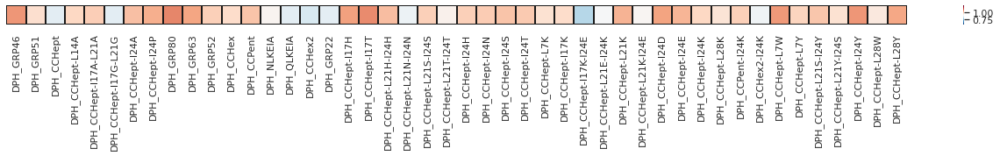


S


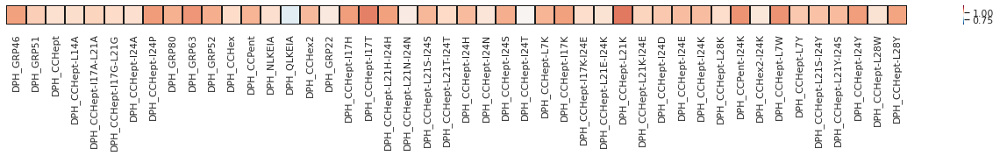


V


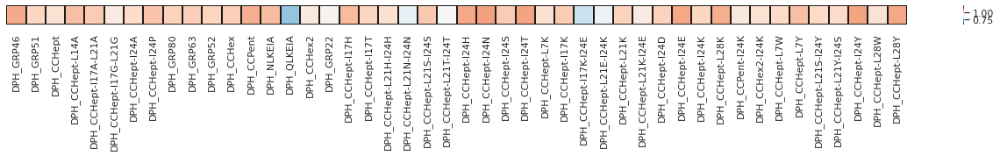


W


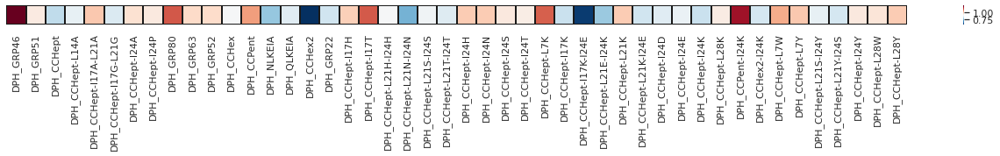




Scaled_data:


E


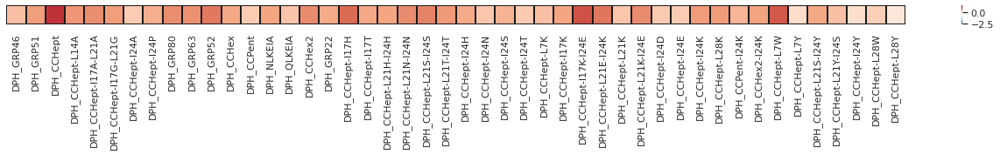


R


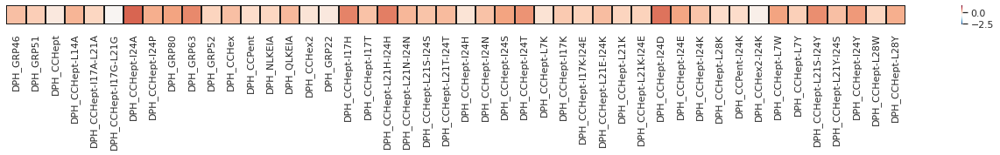


S


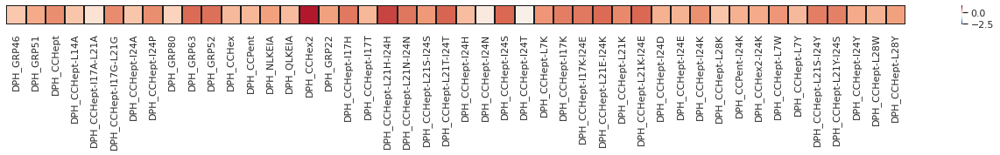


V


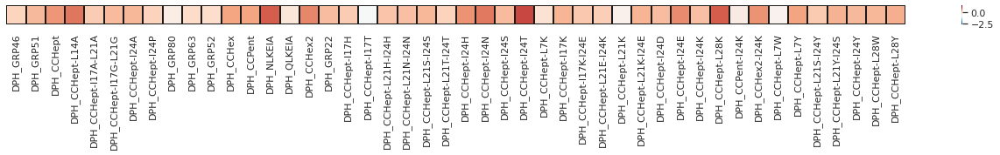


W


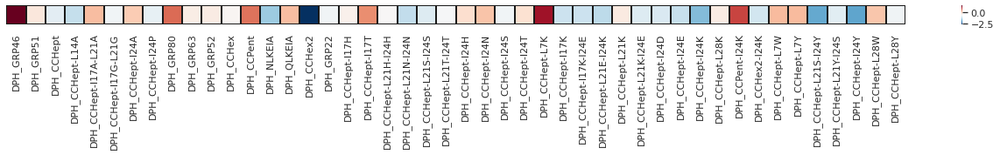




Original_data:



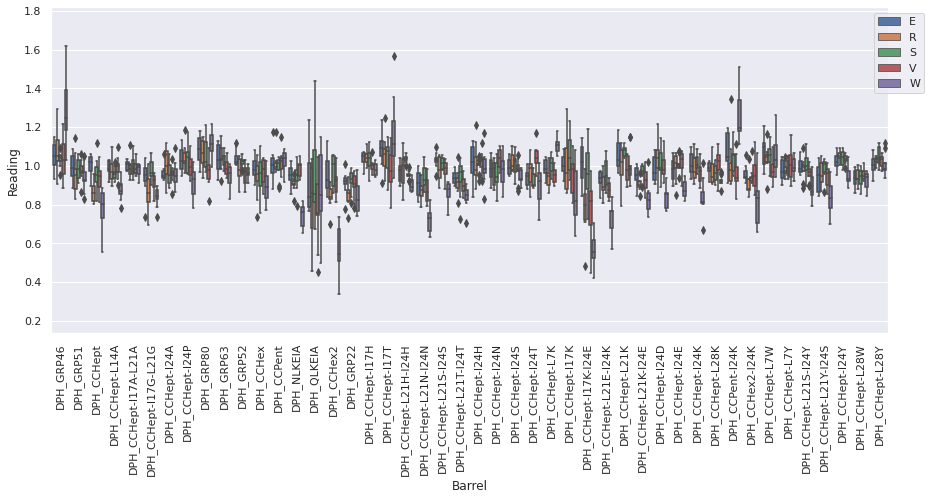

E


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


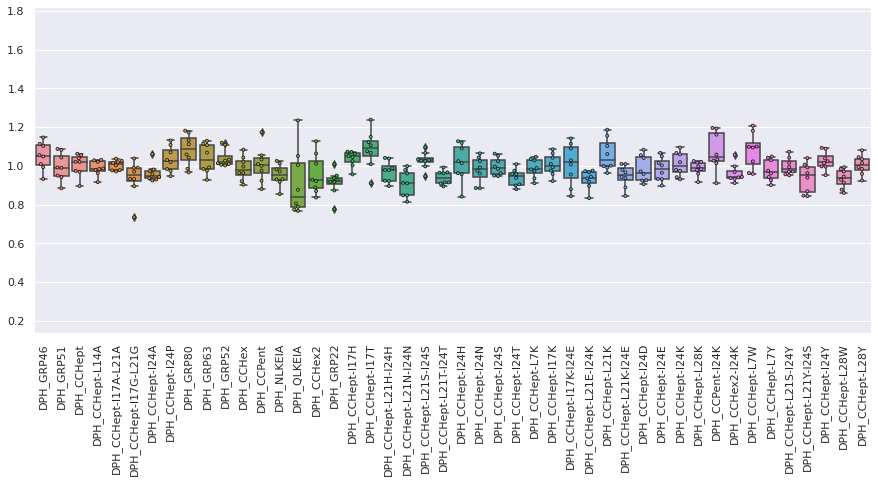

R


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


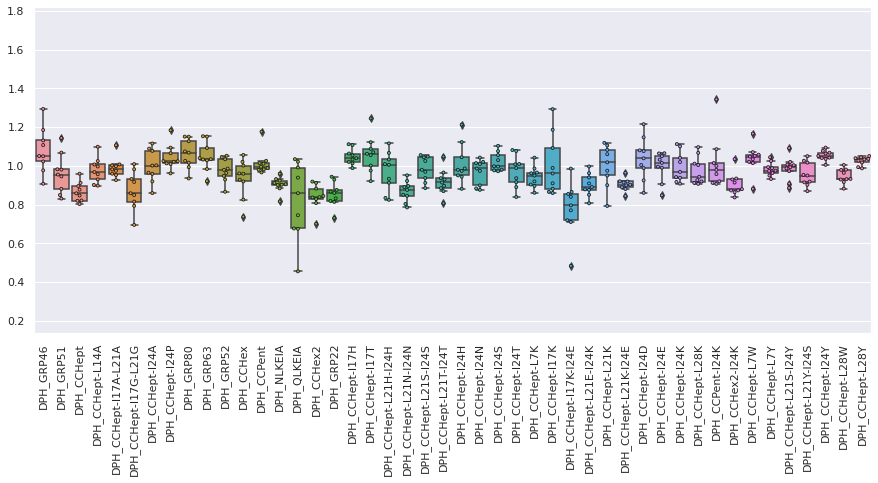

S


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


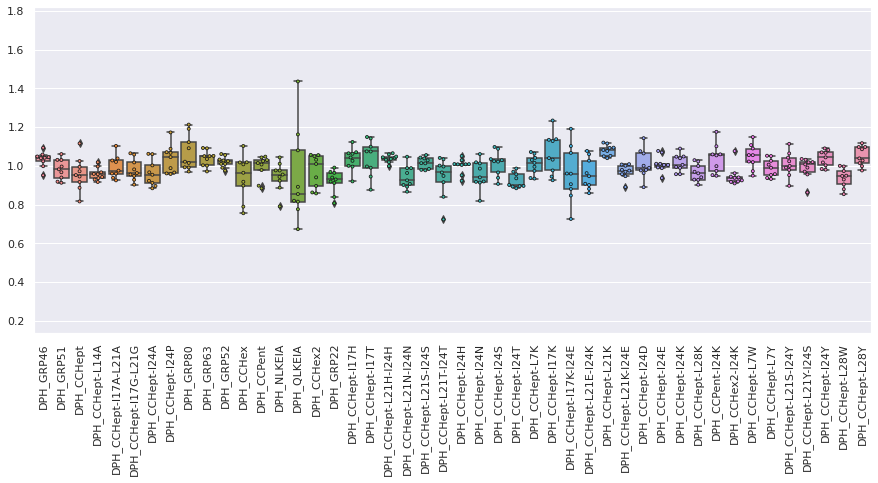

V


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


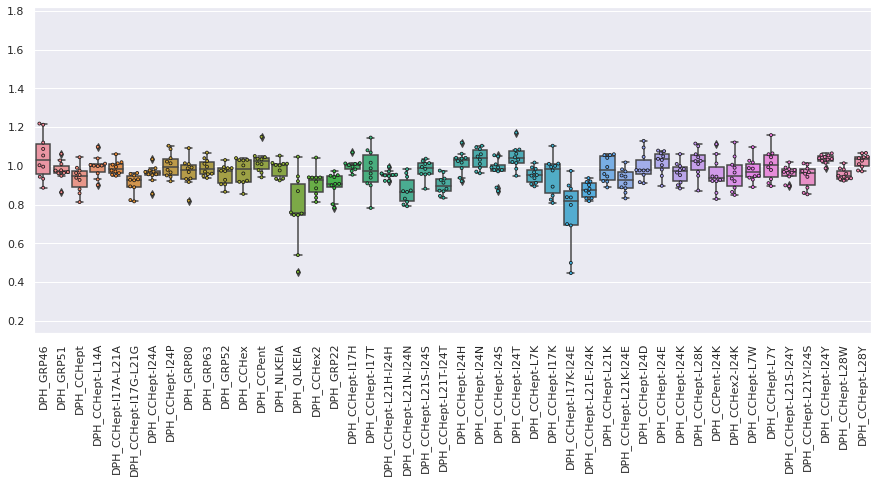

W


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


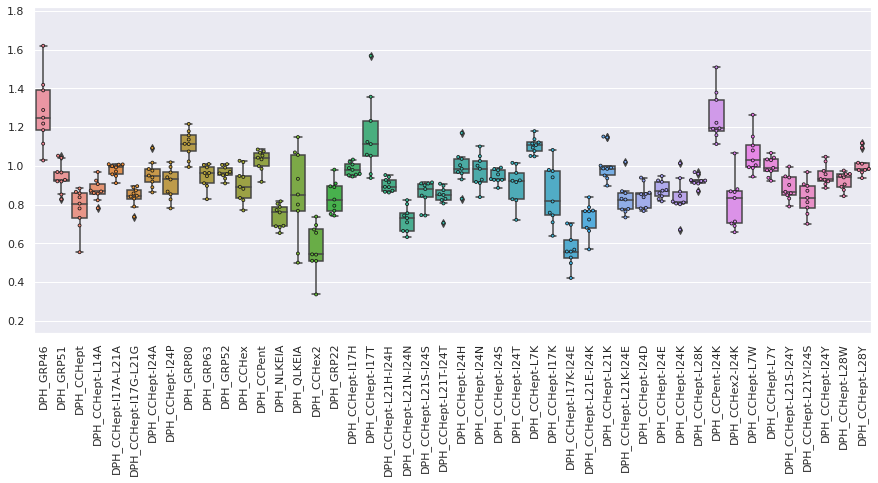




Scaled_data:



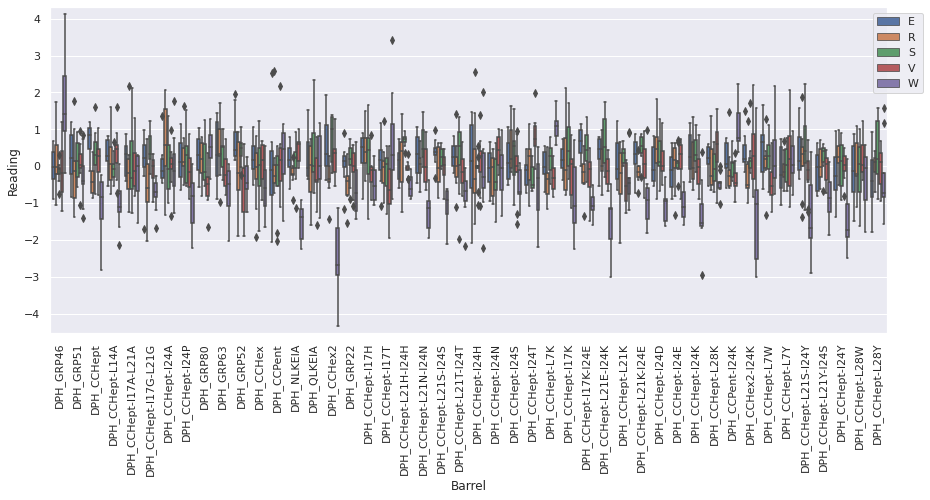

E


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


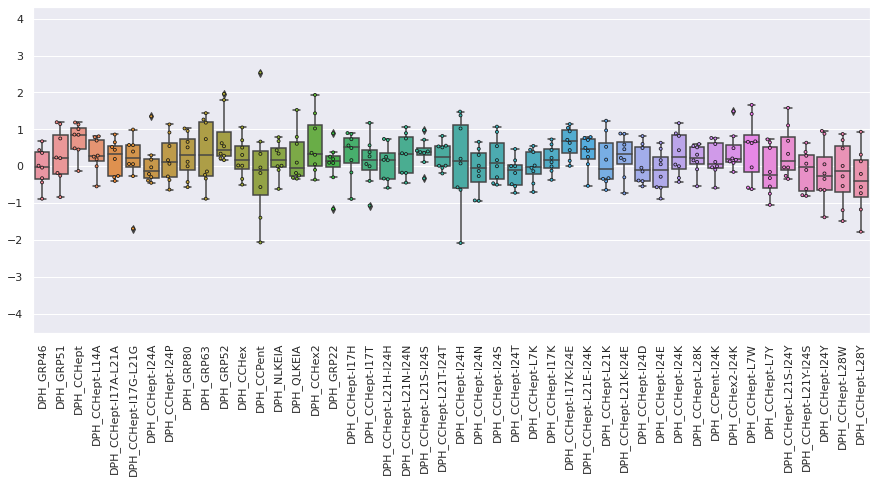

R


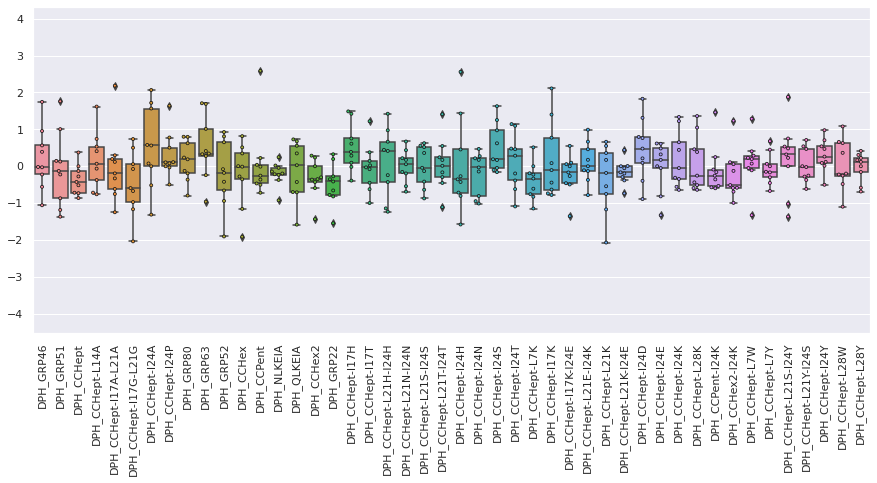

S


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


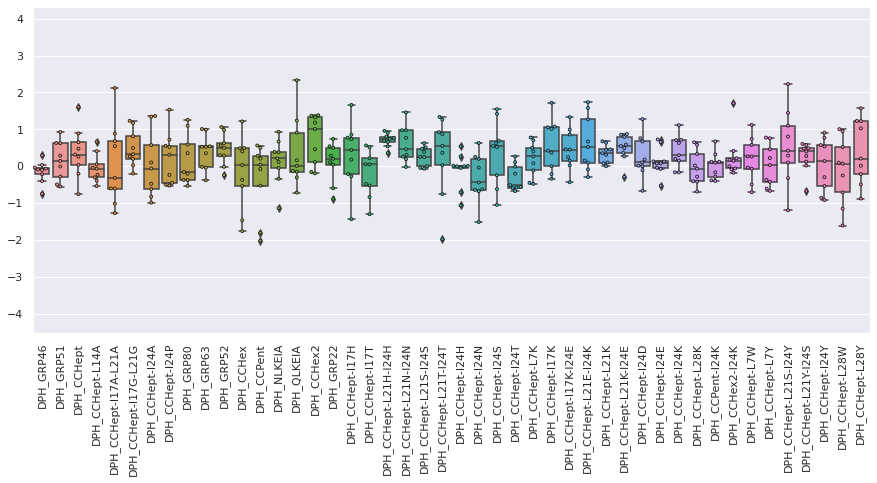

V


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


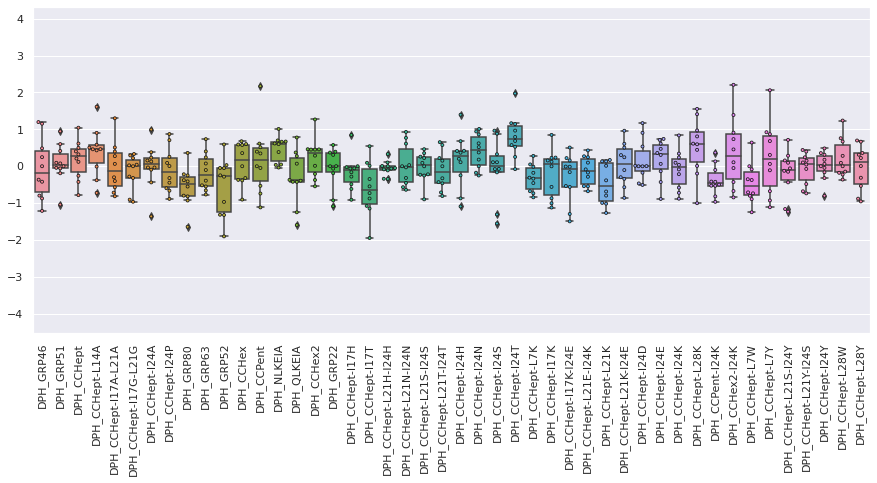

W


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


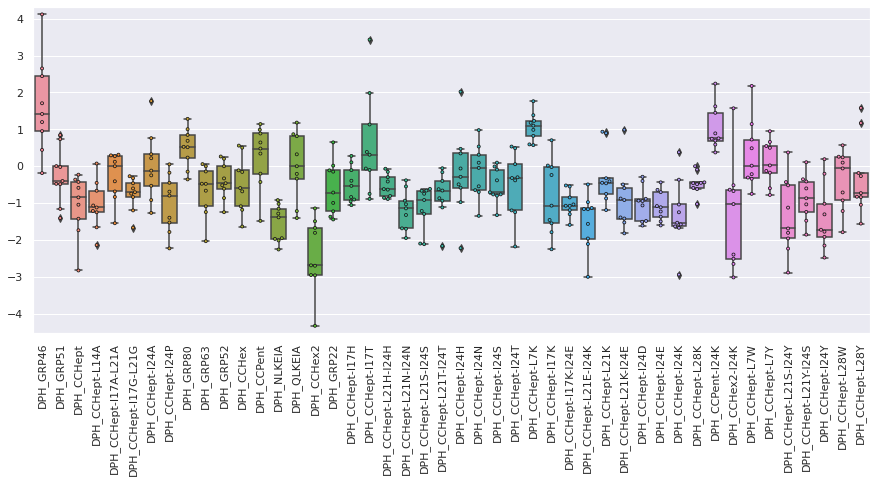

In [8]:
aa_fluor_data.display_data_distribution()

- As suggested by the scatter plots of the raw data above, the fingerprint of W is the most easily distinguishable, whereas the other four amino acids are similar to one another.
- When looking at the unscaled data, the ranges of readings obtained for QLKEIA (identified above as having a minimal effect upon the fluorescence of DPH) are large and show a high degree of overlap. However when looking at the scaled data, the overlap of different classes is not noticeably (by eye) poorer than many of the other peptides (e.g. compare to CCPent).

Consequently, I will not discard any of the peptides from the initial dataset used for ML training.

In [9]:
aa_fluor_data.ml_fluor_data

,DPH_GRP46,DPH_GRP51,DPH_CCHept,DPH_CCHept-L14A,DPH_CCHept-I17A-L21A,DPH_CCHept-I17G-L21G,DPH_CCHept-I24A,DPH_CCHept-I24P,DPH_GRP80,DPH_GRP63,...,DPH_CCPent-I24K,DPH_CCHex2-I24K,DPH_CCHept-L7W,DPH_CCHept-L7Y,DPH_CCHept-L21S-I24Y,DPH_CCHept-L21Y-I24S,DPH_CCHept-I24Y,DPH_CCHept-L28W,DPH_CCHept-L28Y,Analyte
0,1.048248,1.086967,1.055368,0.977987,0.976229,0.895105,0.981102,0.946389,0.984478,0.975287,...,0.910192,0.911260,0.963116,0.974770,0.956102,1.039729,1.038388,0.992671,0.958880,E
1,1.008621,0.989615,0.973460,0.983957,1.015221,0.990072,0.956442,0.973714,1.058936,0.927796,...,1.013535,0.968451,0.958733,1.048108,0.950815,0.962443,1.092850,0.970839,1.014424,E
2,0.993021,1.082156,1.020715,0.915819,1.025857,0.970540,0.929360,0.983653,0.965823,0.984071,...,1.033352,1.057116,1.022945,1.041148,0.970608,1.005461,1.088111,0.983391,1.034135,E
3,1.103119,1.043016,1.020103,0.961970,0.977959,1.037881,0.924622,1.029730,1.131978,1.114332,...,1.058071,0.997020,1.098436,1.028910,0.993846,0.939233,0.996861,0.944165,0.924188,E
4,0.932137,0.941951,0.895843,1.020826,1.019093,0.990576,0.942828,1.130901,1.181197,1.107040,...,1.160988,0.932947,1.099746,0.961071,0.970396,0.868783,1.023438,0.913675,0.984327,E
5,1.113367,0.883839,1.039392,1.028514,1.002124,0.931716,0.972280,1.069779,1.172258,1.129352,...,1.195792,0.943548,1.207681,0.925965,1.042655,0.843687,0.996385,0.928380,1.080244,E
6,1.146381,0.991345,1.062297,1.030485,1.036922,0.932425,1.061135,1.019655,1.042473,1.068261,...,1.192737,0.936436,1.180891,0.942078,1.072734,0.846128,1.014528,0.876904,0.993883,E
7,1.055239,0.949390,0.969349,0.986353,0.970878,0.734249,0.936356,1.107924,1.111805,0.991949,...,1.027042,0.940277,1.094662,0.900760,1.016227,0.991673,0.951953,0.860375,1.044588,E
8,1.184641,1.068276,0.911947,1.007017,1.007306,0.931783,1.115319,0.960921,1.016349,1.028363,...,0.920160,1.034466,1.020918,0.987630,0.886209,0.952933,1.040610,1.004214,0.992948,R
9,1.107234,0.980364,0.858027,0.967695,1.002089,0.982174,0.859246,1.023615,0.934832,0.983348,...,0.979306,0.929889,1.034094,0.973810,0.972577,0.902168,1.077630,0.978965,0.986936,R


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_ML_plots',
    fluor_data=aa_fluor_data.ml_fluor_data.drop(['Analyte'], axis=1),
    classes=aa_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [11]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

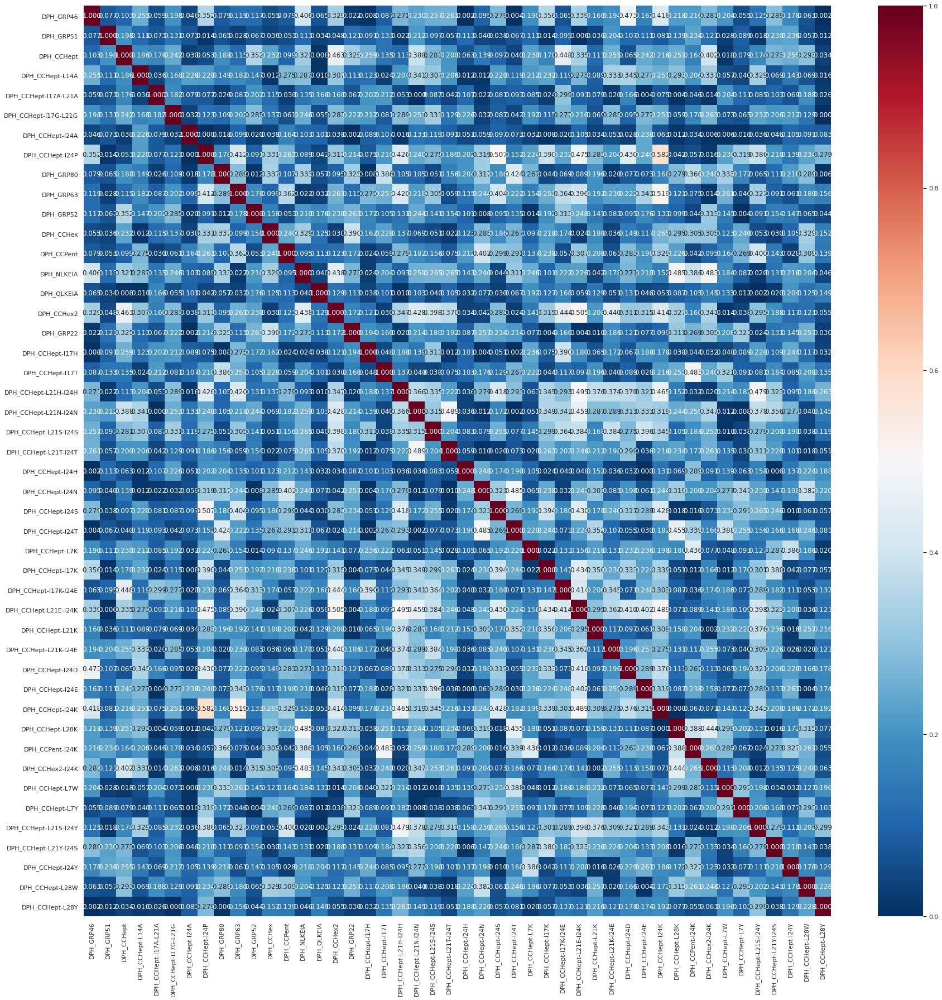

In [12]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

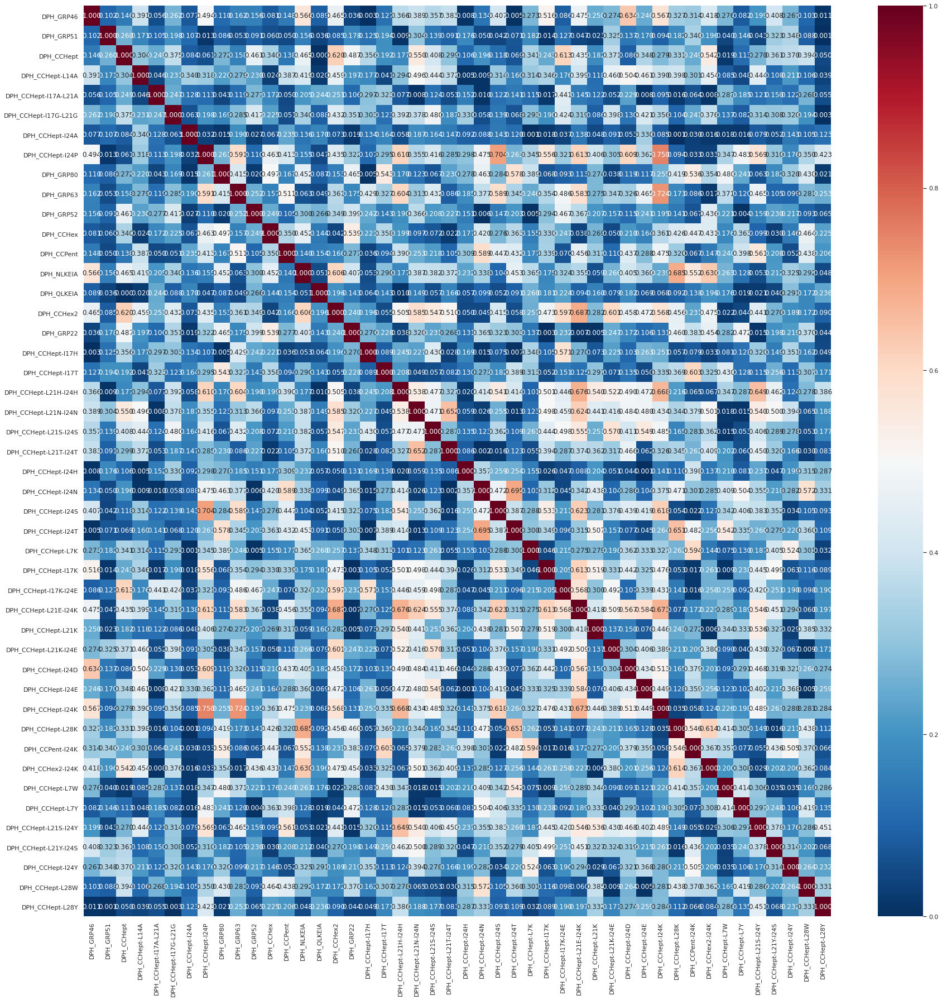

In [13]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

The correlation coefficients between the readings from most of the barrels are pretty low. Would expect that if the readings are providing useful information (i.e. not just noise) about amino acid class that a larger number would show higher correlation coefficients (as it is highly unlikely that all 46 peptides will provide unique, unrelated information about amino acid class). Consequently model training might be tricky, and feature reduction might lead to an improvement in performance (by removing peptides that just contribute noise) - we will see whether this is the case in the following analysis!

In [14]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

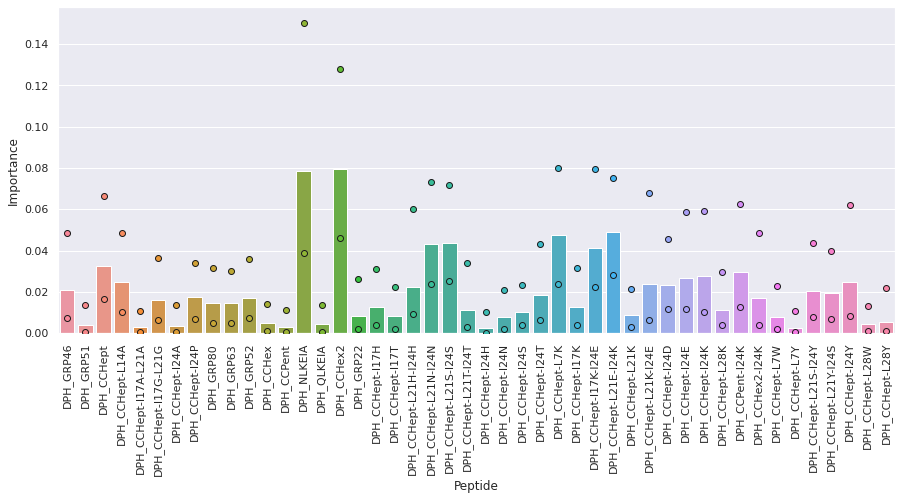

<Figure size 720x720 with 0 Axes>

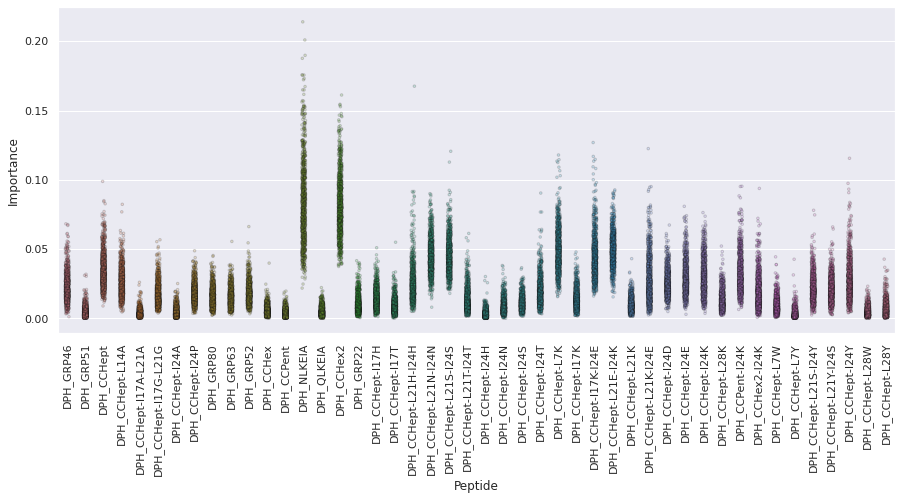

In [15]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHex2,0.079305,0.046032,0.128014
1,DPH_NLKEIA,0.078357,0.038910,0.150473
2,DPH_CCHept-L21E-I24K,0.049204,0.028076,0.075299
3,DPH_CCHept-L7K,0.047734,0.023628,0.079861
4,DPH_CCHept-L21S-I24S,0.043557,0.025312,0.071635
5,DPH_CCHept-L21N-I24N,0.043436,0.023906,0.073051
6,DPH_CCHept-I17K-I24E,0.041241,0.022420,0.079395
7,DPH_CCHept,0.032720,0.016741,0.066361
8,DPH_CCPent-I24K,0.029455,0.012819,0.062721
9,DPH_CCHept-I24K,0.027665,0.010374,0.059067


In [17]:
with open('{}/KBest_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((kbest_feat_importances_dict), f)

KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another, etc..

From this analysis, NLKEIA and CCHex2 are identified as the two most important peptides. Looking back at the box plots above, it is noticeable that both of these peptides have distinctly different ranges of readings for tryptophan as compared to the other four amino acids.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

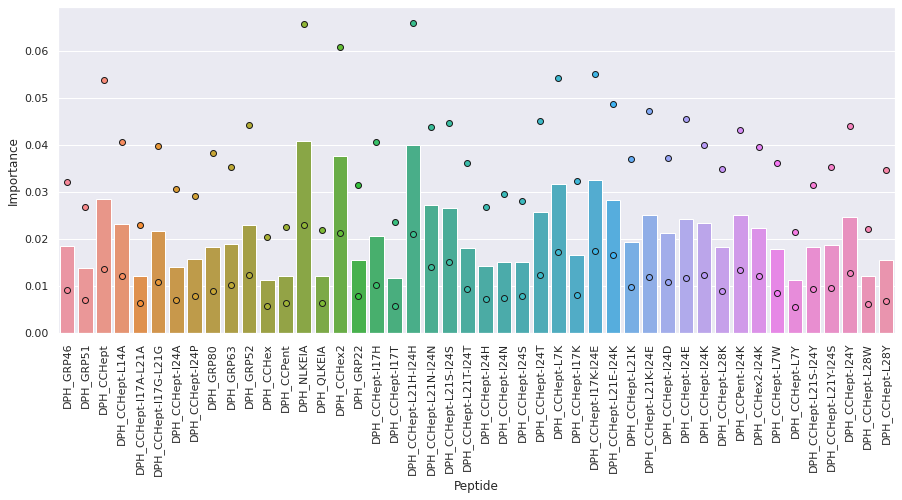

<Figure size 720x720 with 0 Axes>

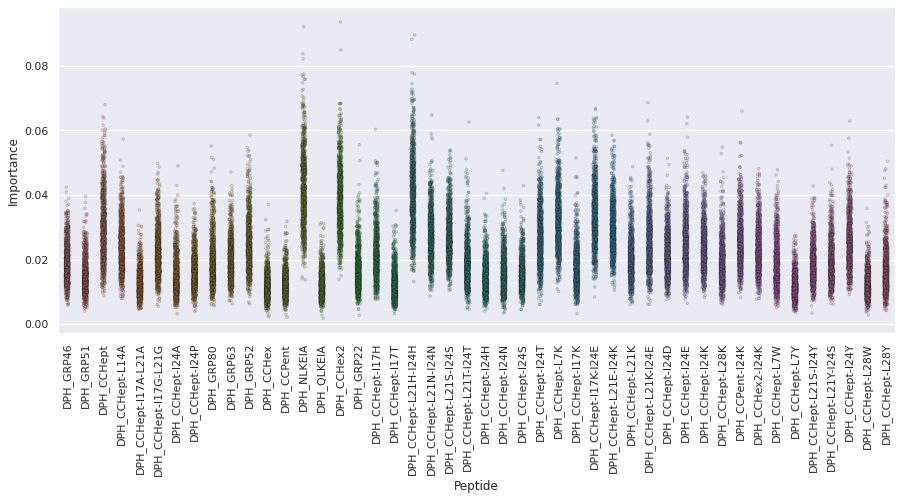

In [18]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [19]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_NLKEIA,0.040902,0.022922,0.065753
1,DPH_CCHept-L21H-I24H,0.039910,0.021009,0.065963
2,DPH_CCHex2,0.037599,0.021329,0.060686
3,DPH_CCHept-I17K-I24E,0.032555,0.017432,0.054940
4,DPH_CCHept-L7K,0.031692,0.017136,0.054183
5,DPH_CCHept,0.028480,0.013636,0.053661
6,DPH_CCHept-L21E-I24K,0.028378,0.016674,0.048615
7,DPH_CCHept-L21N-I24N,0.027185,0.014109,0.043793
8,DPH_CCHept-L21S-I24S,0.026582,0.015201,0.044598
9,DPH_CCHept-I24T,0.025632,0.012396,0.045001


In [20]:
with open('{}/Tree_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((tree_feat_importances_dict), f)

In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

There is some overlap in the most important peptides identified by the ExtraTrees classifier - again, NLKEIA and CCHex2 have high scores. However, the second highest scoring peptide here, CCHept-L21H-I24H, returns a fairly low importance score in the KBest analysis => the results obtained using the two methods are similar, but not identical.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

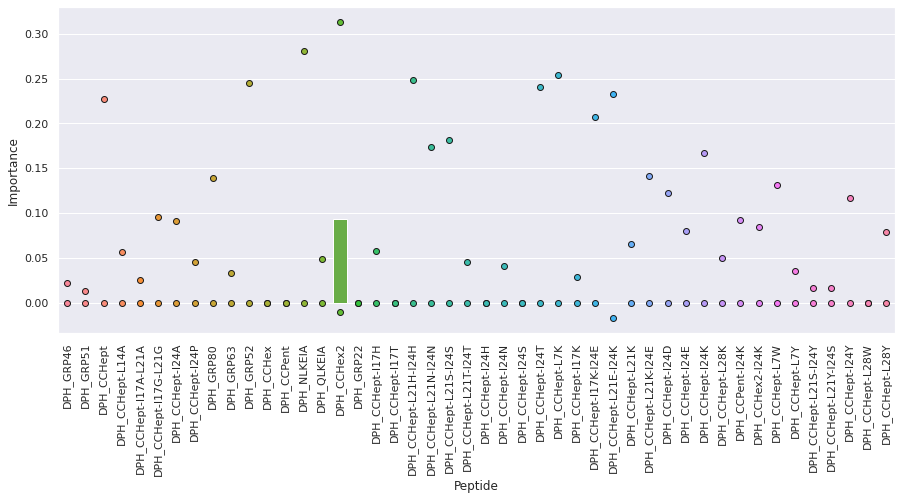

<Figure size 720x720 with 0 Axes>

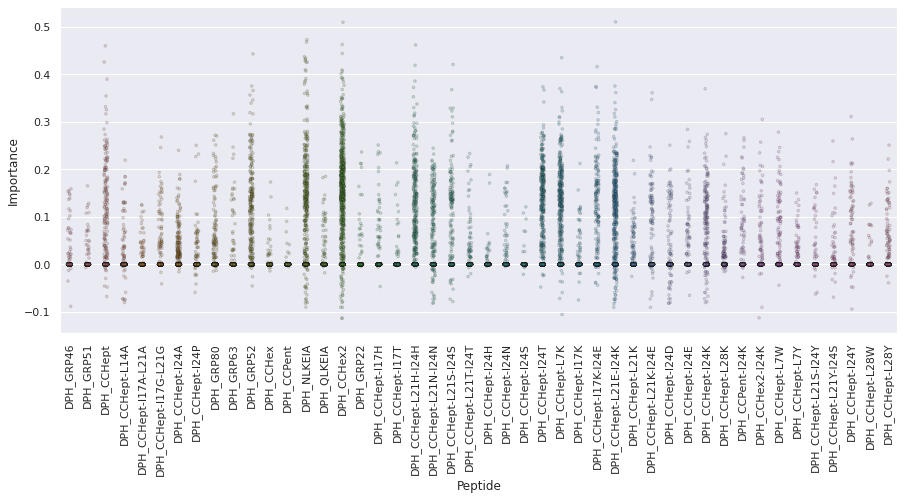

In [21]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1,
    num_repeats=1000, scale=True, plt_name=''
)

In [22]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHex2,0.093624,-9.931284e-03,0.313375
1,DPH_GRP46,0.000000,0.000000e+00,0.021649
2,DPH_CCHept-I24E,0.000000,0.000000e+00,0.079972
3,DPH_CCHept-I24T,0.000000,0.000000e+00,0.240603
4,DPH_CCHept-L7K,0.000000,0.000000e+00,0.254029
5,DPH_CCHept-I17K,0.000000,0.000000e+00,0.029237
6,DPH_CCHept-I17K-I24E,0.000000,0.000000e+00,0.206956
7,DPH_CCHept-L21E-I24K,0.000000,-1.741921e-02,0.233217
8,DPH_CCHept-L21K,0.000000,0.000000e+00,0.065687
9,DPH_CCHept-L21K-I24E,0.000000,0.000000e+00,0.141105


In [23]:
mean_permut_feat_importances_df = OrderedDict({})
lower_conf_permut_feat_importances_df = OrderedDict({})
upper_conf_permut_feat_importances_df = OrderedDict({})

for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
    lower_conf_permut_feat_importances_df[feat] = np.percentile(score_list, 2.5)
    upper_conf_permut_feat_importances_df[feat] = np.percentile(score_list, 97.5)

mean_permut_feat_importances_df = pd.DataFrame({
    'Feature': list(mean_permut_feat_importances_df.keys()),
    'Score': list(mean_permut_feat_importances_df.values()),
    'Lower conf limit': list(lower_conf_permut_feat_importances_df.values()),
    'Upper conf limit': list(upper_conf_permut_feat_importances_df.values())
})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [24]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHex2,0.101699,-9.931284e-03,0.313375
1,DPH_NLKEIA,0.050550,-3.220612e-07,0.280916
2,DPH_CCHept-L7K,0.046964,0.000000e+00,0.254029
3,DPH_CCHept-I24T,0.045698,0.000000e+00,0.240603
4,DPH_CCHept-L21E-I24K,0.044824,-1.741921e-02,0.233217
5,DPH_CCHept-L21H-I24H,0.035844,0.000000e+00,0.248705
6,DPH_GRP52,0.029340,0.000000e+00,0.244721
7,DPH_CCHept,0.021747,0.000000e+00,0.227124
8,DPH_CCHept-I17K-I24E,0.020069,0.000000e+00,0.206956
9,DPH_CCHept-I24K,0.015782,0.000000e+00,0.166792


In [25]:
with open('{}/Permutation_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((permut_feat_importances_dict), f)

In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

As can be seen from the plots, most of the features provide little unique information about the output class. Again, peptides CCHex2 and (to a lesser extent) NLKEIA are found to be the most important, CCHept-L21H-I24H is also close to the top of the rankings. CCHept-L7K is the third most important peptide identified by permutation analysis; it is also found to be one of the most important peptides by both of the other two methods. CCHex2 is found to be much the most important peptide by permutation analysis, whereas in contrast it is found to be one of several similarly important peptides by the KBest and ExtraTrees analysis.

So, whilst there is some variation in the relative order of the less important peptides, overall there is good agreement between the results obtained with all three methods. CCHex2, NLKEIA and CCHept-L7K are found to be three of the most important peptides in the dataset, whilst peptide CCHept-L21H-I24H is also identified as important by the latter two methods. 

- What percentage of the signal in the data can be measured by N principal components?

If there are more features than samples, can't run PCA. Have 45 samples, 46 peptides => need to discard one peptide if want to run PCA. Will discard peptide QLKEIA, given that as described above the fluorescence of QLKEIA and DPH is (by eye) barely distinguishable from that of DPH alone, plus it is not calculated as having a high importance score by any of the three methods above.

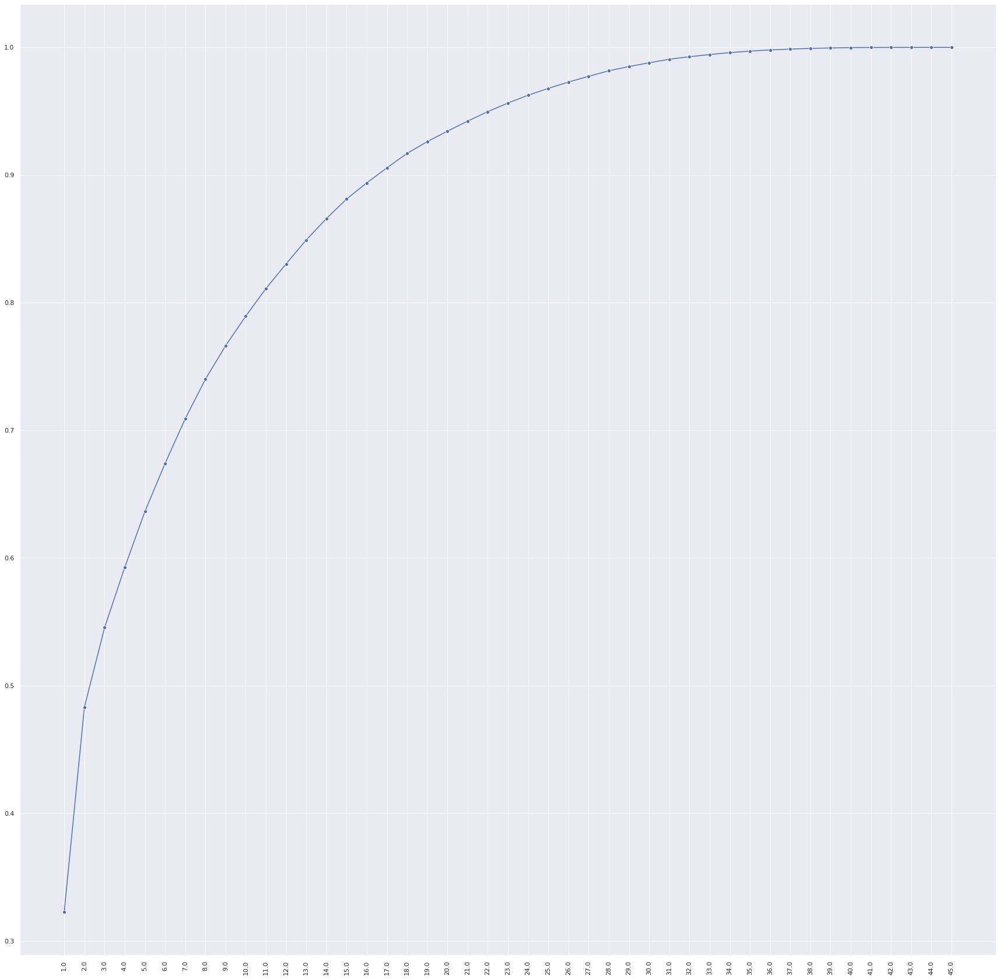

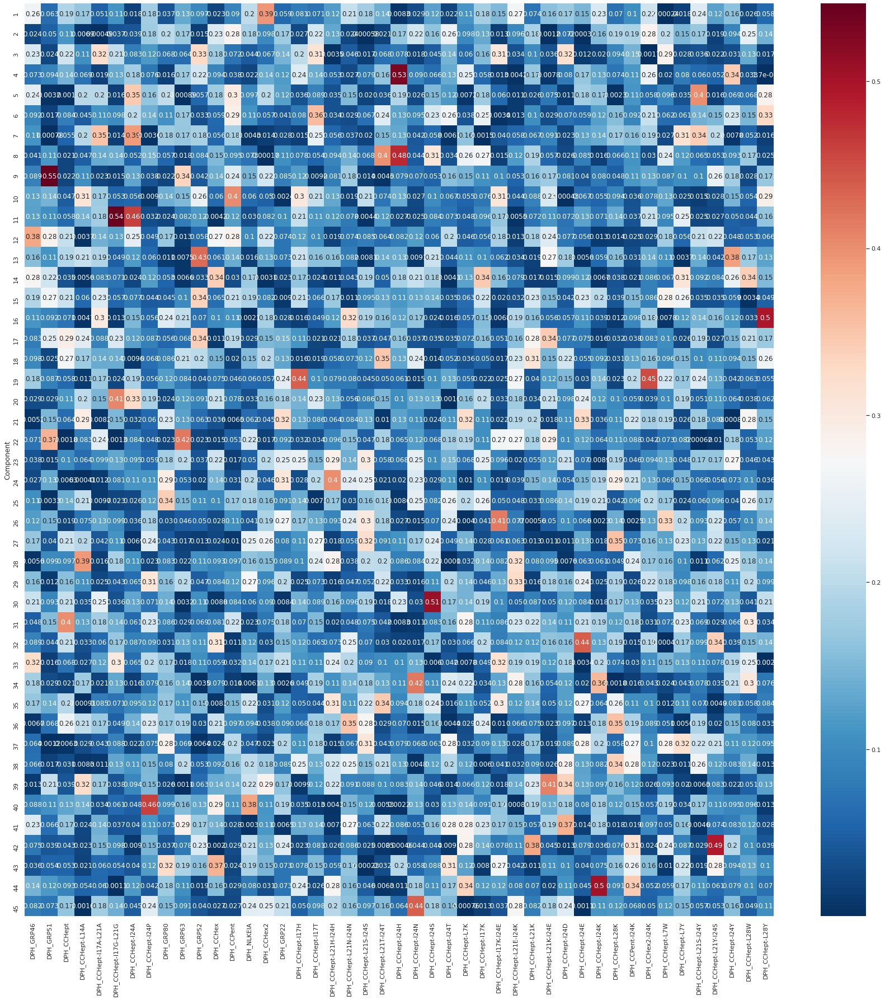

In [26]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(
    fluor_data=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1), scale=True, plt_name=''
)
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

17 components are required to represent >90% of the variance in the data. CCHex2 makes the largest contribution to the first principal component, but several other peptides also make sizeable contributions.

Scatter plots of data transformed to PCA dimensions

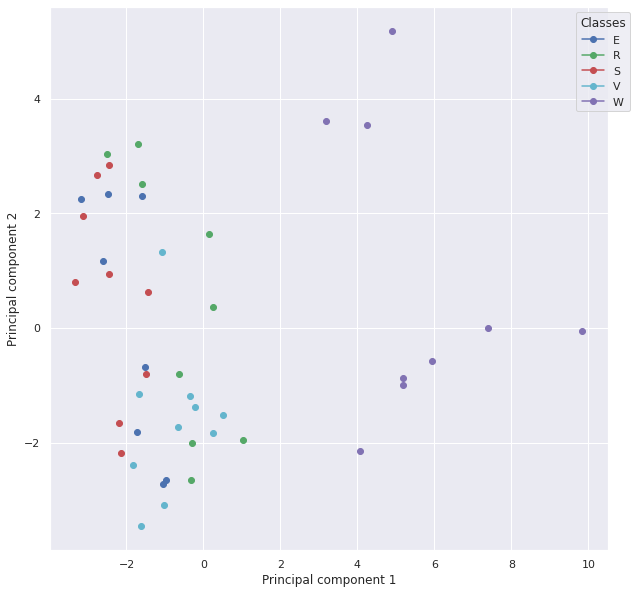

In [27]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=2, scale=True, plt_name=''
)

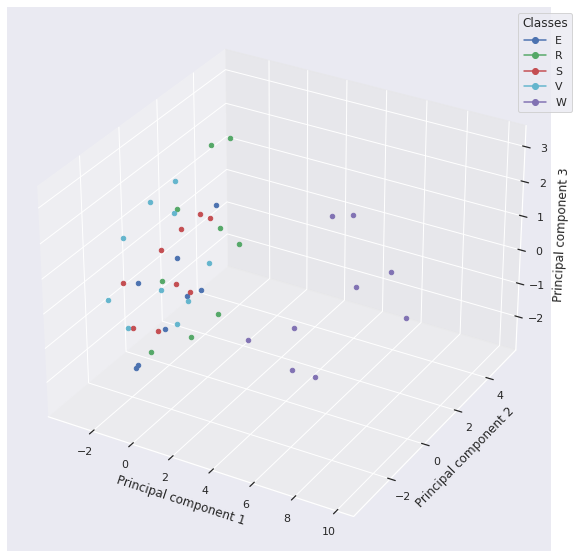

In [28]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter plots of fluorescence readings, tryptophan clusters separately from the other amino acids, whereas the other four are more difficult to distinguish from one another.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 6 different ML algorithms and 2 dummy (random) classifiers. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [29]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        if index == 0:
            fixed_params = OrderedDict({'strategy': 'prior',
                                        'random_state': 1})
            tuned_params = OrderedDict({})
        elif index == 1:
            fixed_params = OrderedDict({'strategy': 'stratified',
                                        'random_state': 1})
            tuned_params = OrderedDict({})
        else:
            fixed_params = ml.define_fixed_model_params(classifier=algorithm())
            if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                fixed_params['random_state'] = 1
            tuned_params = ml.define_tuned_model_params(
                classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
            )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        if index == 0:
            all_feat_searches[
                'DummyClassifierPrior__{}'.format(resampling_method)
            ] = copy.deepcopy(nested_cv_search)
        elif index == 1:
            all_feat_searches[
                'DummyClassifierStratified__{}'.format(resampling_method)
            ] = copy.deepcopy(nested_cv_search)
        else:
            all_feat_searches[
                '{}__{}'.format(algorithm.__name__, resampling_method)
            ] = copy.deepcopy(nested_cv_search)

        if index == 0:
            all_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
        elif index == 1:
            all_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
        else:
            all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for n, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing
Parameters: OrderedDic

In [30]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [31]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
1,DummyClassifier_stratified,no_balancing,0.066667,0.099381,0.066667,0.099381,0.111111,0.157135,0.081481,0.118287
2,KNeighborsClassifier,no_balancing,0.511111,0.099381,0.511111,0.099381,0.491852,0.157971,0.484656,0.121826
3,GaussianNB,no_balancing,0.622222,0.168508,0.622222,0.168508,0.614074,0.196966,0.595767,0.174326
4,LinearDiscriminantAnalysis,no_balancing,0.377778,0.126686,0.377778,0.126686,0.345926,0.106239,0.348995,0.103304
5,LinearSVC,no_balancing,0.466667,0.182574,0.466667,0.182574,0.492593,0.189125,0.454815,0.175260
6,SVC,no_balancing,0.533333,0.121716,0.533333,0.121716,0.507407,0.180306,0.491852,0.135030
7,AdaBoostClassifier,no_balancing,0.355556,0.092962,0.355556,0.092962,0.258519,0.084220,0.269841,0.068289


In [32]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

There is quite a lot of variation in model performance - some of the algorithms perform well, especially given the small size of the dataset, the high number of categories, and how similar the fingerprints of four of the amino acids look by eye. One would predict therefore that with a larger dataset a substantial improvement in model performance could be obtained. Algorithm selection has a big effect upon performance, as can be seen across all of the scoring metrics calculated. Moreover, because of the small dataset size the standard deviation values associated with these scores are in all cases large. All models however perform better than random guessing (which would yield an accuracy score of ~0.2 - see the results for the dummy classifiers).

GaussianNB performs best across all four performance metrics => take this model forwards.

In [33]:
all_feat_searches['GaussianNB__no_balancing']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [34]:
all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [35]:
all_feat_searches['GaussianNB__no_balancing']['test_scores']['accuracy']

[0.5555555555555556,
 0.6666666666666666,
 0.5555555555555556,
 0.8888888888888888,
 0.4444444444444444]

In [36]:
all_feat_nested_pred = all_feat_searches['GaussianNB__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['GaussianNB__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['GaussianNB__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

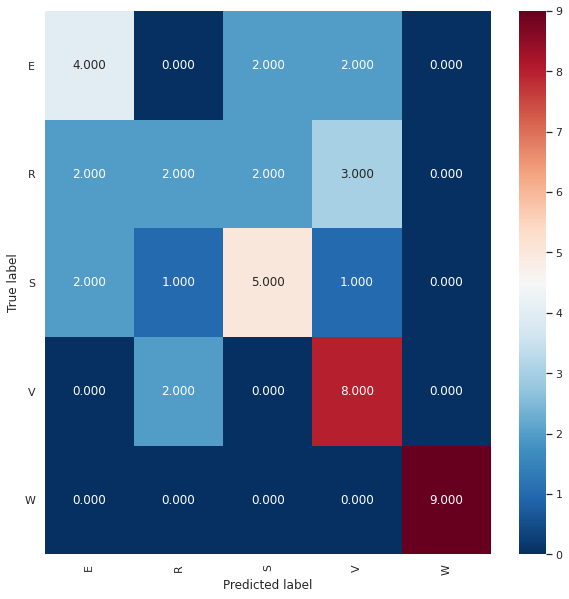

Normalised over true label (rows)


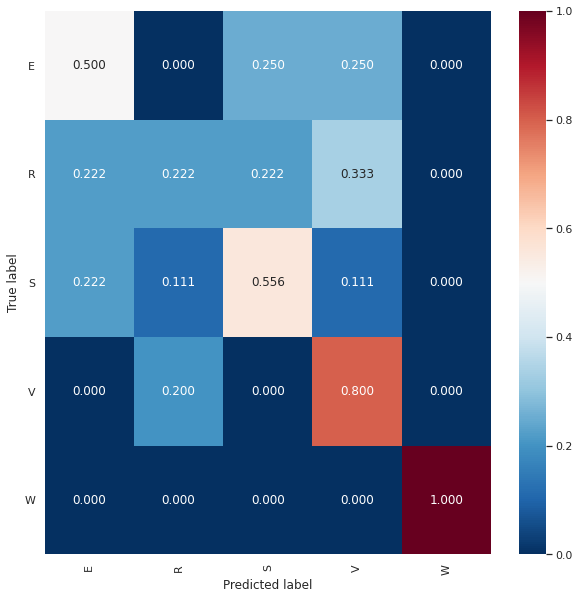

Normalised over pred label (columns)


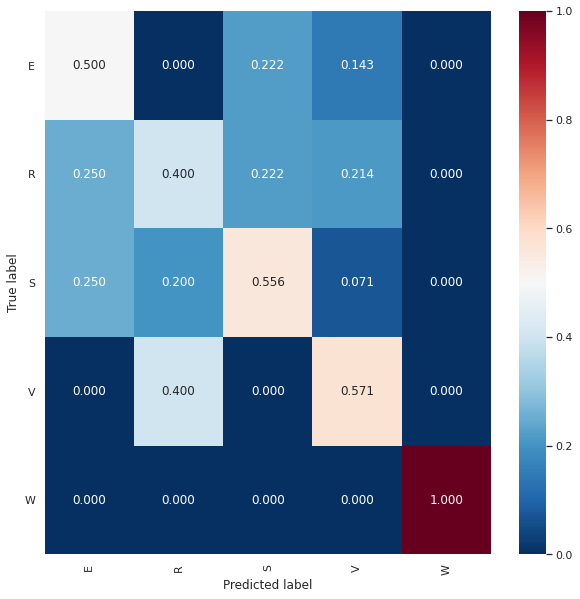

In [37]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [38]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

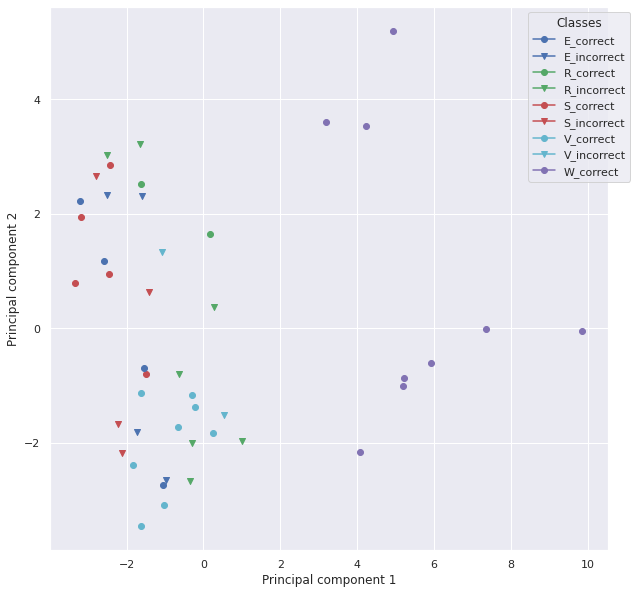

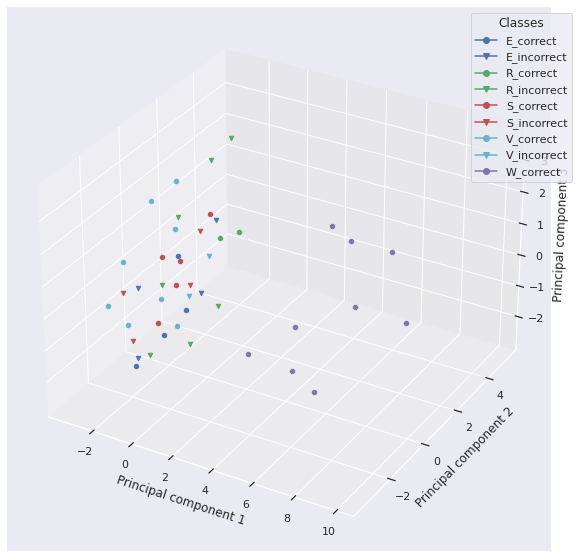

In [39]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

As expected from the earlier analysis in this notebook, the trained model can readily distinguish Trp (there are no false positives or false negatives for Trp). It also is fairly good at identifying Val, whereas it struggles more with Ser, Arg and Glu. There is consequently a rough correlation between an amino acid's hydrophobicity and the ability of the model to identify it. This makes sense - more hydrophobic molecules tend to be more effective at interacting with the barrels (=> greater effect upon DPH fluorescence).

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [40]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                if index == 0:
                    fixed_params = OrderedDict({'strategy': 'prior',
                                                'random_state': 1})
                    tuned_params = OrderedDict({})
                elif index == 1:
                    fixed_params = OrderedDict({'strategy': 'stratified',
                                                'random_state': 1})
                    tuned_params = OrderedDict({})
                else:
                    fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                    if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                        fixed_params['random_state'] = 1
                    tuned_params = ml.define_tuned_model_params(
                        classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                    )

                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                if index == 0:
                    red_feat_searches[
                        'DummyClassifierPrior__{}__{}__{}'.format(resampling_method, feat_method, num_features)
                    ] = copy.deepcopy(nested_cv_search)
                elif index == 1:
                    red_feat_searches[
                        'DummyClassifierStratified__{}__{}__{}'.format(
                            resampling_method, feat_method, num_features
                        )
                    ] = copy.deepcopy(nested_cv_search)
                else:
                    red_feat_searches[
                        '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                    ] = copy.deepcopy(nested_cv_search)

                if index == 0:
                    red_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
                elif index == 1:
                    red_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
                else:
                    red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for n, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])






DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'p





DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




Dum





DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F





KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5259259259259259




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.45185185185185184




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: Order





KNeighborsClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




KNeighborsClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




KNeighborsClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




KNeighborsClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




KNeighborsClassifier: no_balancing,  KBest_Fscore,  46
Parameters: 





KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 2), ('weights', 'distance')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 2), ('weights', 'distance')])
Accuracy: 0.4444444444444444
F1: 0.48148148148148145




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




KNeighborsClassifier: no_balancing,  Permut





GaussianNB: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict()
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




GaussianNB: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




GaussianNB: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




GaussianNB: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.48148148148148145




GaussianNB: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.34814814814814815




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6296296296296295




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.68148148148148





GaussianNB: no_balancing,  Permutation_score,  46
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




GaussianNB: no_balancing,  Permutation_score,  46
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.5851851851851851




GaussianNB: no_balancing,  Permutation_score,  46
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5925925925925926




GaussianNB: no_balancing,  Permutation_score,  46
Parameters: OrderedDict()
Accuracy: 0.8888888888888888
F1: 0.8814814814814815




GaussianNB: no_balancing,  Permutation_score,  46
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4148148148148148




LinearDiscriminantAnalysis: no_balancing,  KBest_Fs





LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  2
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.3862433862433863




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  2
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  2
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4259259259259259




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  2
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  2
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  3
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  3
Parameters: OrderedDict()
Accuracy: 0.2222222222





LinearSVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LinearSVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LinearSVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LinearSVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.5555555555555556
F1: 0.5




LinearSVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.6666666666666666
F1: 0.6148148148148148
Range tested: [0.03125, 0.0625, 0.

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.2222222222222222
F1: 0.14814814814814814




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




LinearSVC: no_balancing, 

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




LinearSVC:





SVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




SVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.28571428571428575




SVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.35185185185185186




SVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




SVC: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




SVC: no_balancing,  KBest_Fscore,  4
Param





SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.5), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6222222222222222




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 2.0), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5333333333333333




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.5), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.43703703703703706




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6592592592592593




SVC: no_balancing,  Perm

Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 3.0517578125e-05






SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.001953125), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 1.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.3333333333333333




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 0.000244140625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.015625), ('kernel', 'rbf')])
A





AdaBoostClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.2222222222222222
F1: 0.18518518518518517




AdaBoostClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.42328042328042326




AdaBoostClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




AdaBoostClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.17777777777777778




AdaBoostClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.3333333333333333




AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('





AdaBoostClassifier: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.3333333333333333
F1: 0.23809523809523814




AdaBoostClassifier: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 1000)])
Accuracy: 0.4444444444444444
F1: 0.42328042328042326




AdaBoostClassifier: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.4444444444444444
F1: 0.3333333333333333




AdaBoostClassifier: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.2222222222222222
F1: 0.17777777777777778




AdaBoostClassifier: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.3333333333333333




AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: Order

In [41]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [42]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,KBest_Fscore,1,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
1,DummyClassifier_prior,no_balancing,KBest_Fscore,2,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
2,DummyClassifier_prior,no_balancing,KBest_Fscore,3,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
3,DummyClassifier_prior,no_balancing,KBest_Fscore,4,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
4,DummyClassifier_prior,no_balancing,KBest_Fscore,5,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
...,...,...,...,...,...,...,...,...,...,...,...,...
155,AdaBoostClassifier,no_balancing,Permutation_score,10,0.355556,0.121716,0.355556,0.121716,0.330741,0.186061,0.305397,0.118132
156,AdaBoostClassifier,no_balancing,Permutation_score,15,0.355556,0.092962,0.355556,0.092962,0.311587,0.191703,0.291922,0.109938
157,AdaBoostClassifier,no_balancing,Permutation_score,20,0.333333,0.157135,0.333333,0.157135,0.321217,0.193039,0.289594,0.135707
158,AdaBoostClassifier,no_balancing,Permutation_score,30,0.377778,0.099381,0.377778,0.099381,0.304074,0.150231,0.301164,0.095110


In [43]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

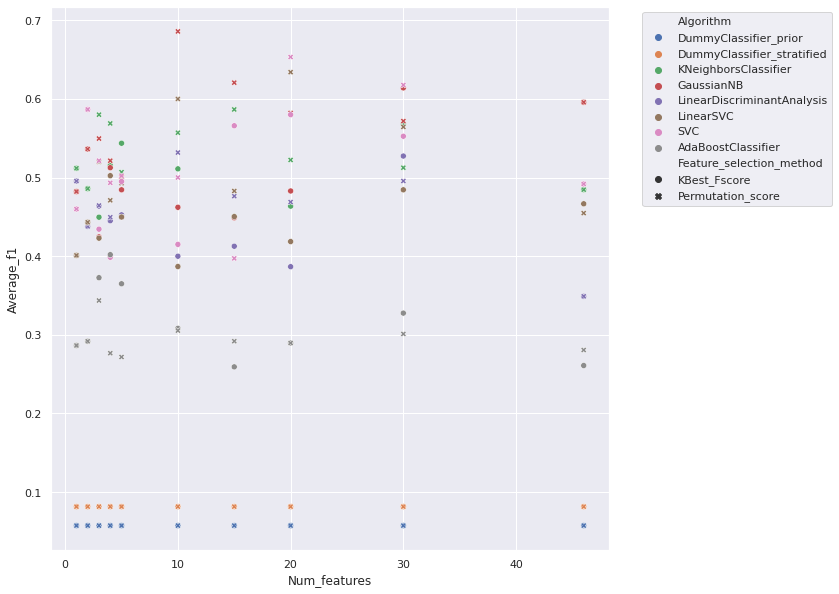

In [44]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, from the plot above, appears that model performance peaks after ~10-15 features have been included (depending upon the algorithm). Also, it does appear the including all 46 features leads to a slight decrease in performance, however the dataset is small and hence it's difficult to tell whether this decrease is real or not (see the significance tests below).

In [45]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 10)
].reset_index(drop=True)

In [46]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,KBest_Fscore,10,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
1,DummyClassifier_prior,no_balancing,Permutation_score,10,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
2,DummyClassifier_stratified,no_balancing,KBest_Fscore,10,0.066667,0.099381,0.066667,0.099381,0.111111,0.157135,0.081481,0.118287
3,DummyClassifier_stratified,no_balancing,Permutation_score,10,0.066667,0.099381,0.066667,0.099381,0.111111,0.157135,0.081481,0.118287
4,KNeighborsClassifier,no_balancing,KBest_Fscore,10,0.511111,0.185924,0.511111,0.185924,0.551852,0.224678,0.511111,0.197307
5,KNeighborsClassifier,no_balancing,Permutation_score,10,0.577778,0.092962,0.577778,0.092962,0.601852,0.092593,0.557037,0.089718
6,GaussianNB,no_balancing,KBest_Fscore,10,0.466667,0.213726,0.466667,0.213726,0.492593,0.227409,0.462222,0.208371
7,GaussianNB,no_balancing,Permutation_score,10,0.688889,0.164804,0.688889,0.164804,0.725926,0.200907,0.685926,0.173134
8,LinearDiscriminantAnalysis,no_balancing,KBest_Fscore,10,0.422222,0.182574,0.422222,0.182574,0.411111,0.182574,0.400000,0.166461
9,LinearDiscriminantAnalysis,no_balancing,Permutation_score,10,0.555556,0.157135,0.555556,0.157135,0.553704,0.202479,0.531852,0.172005


GaussianNB model with 10 features selected by permutation analysis achieves the best performance of this subset.

In [47]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [48]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [49]:
red_feat_nested_pred = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['predictions']
red_feat_nested_y_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['y_true']
red_feat_nested_x_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

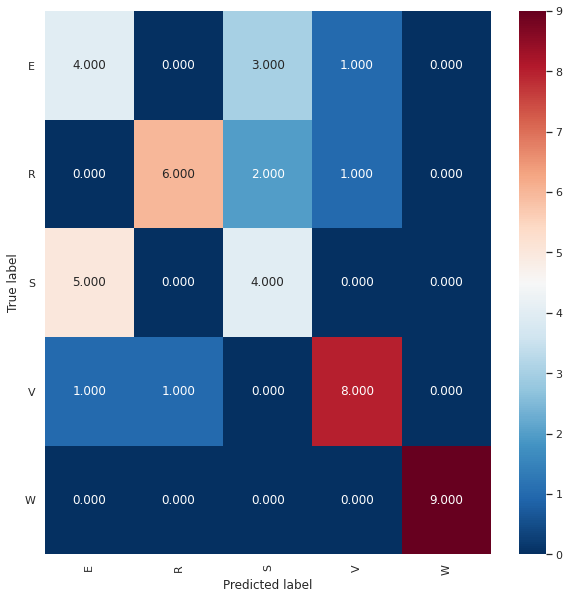

Normalised over true label (rows)


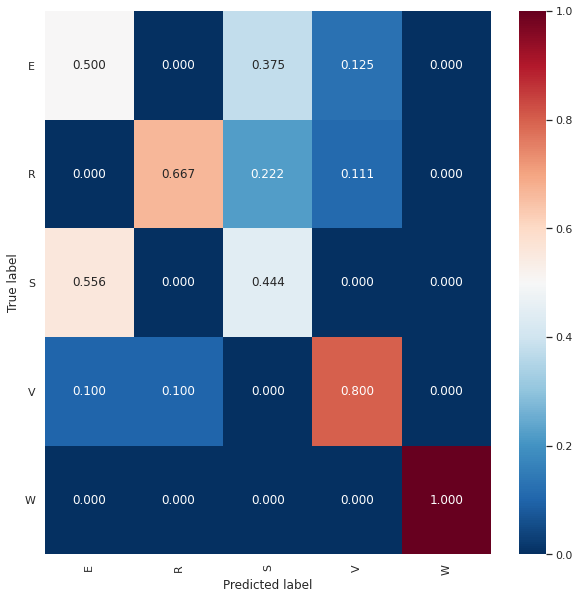

Normalised over pred label (columns)


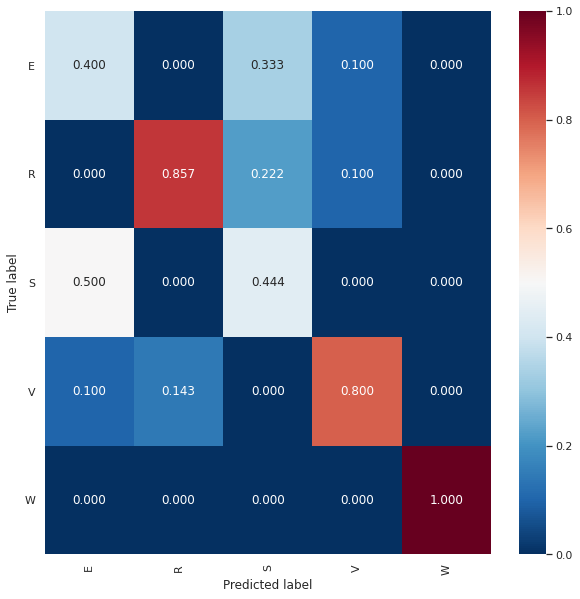

In [50]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [51]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

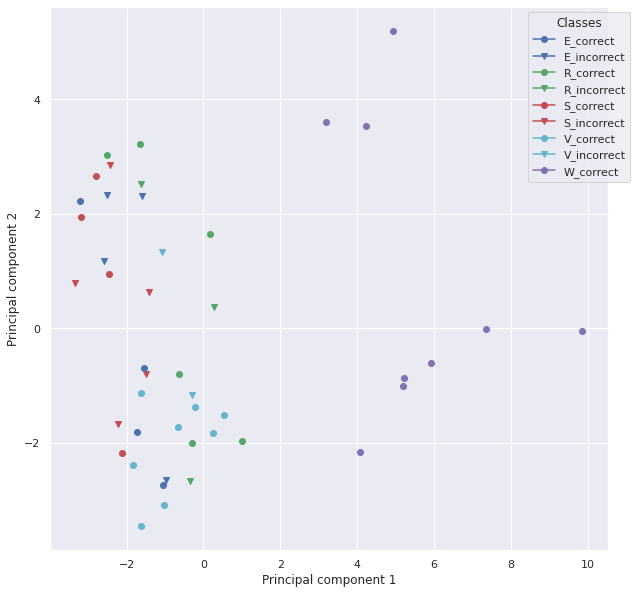

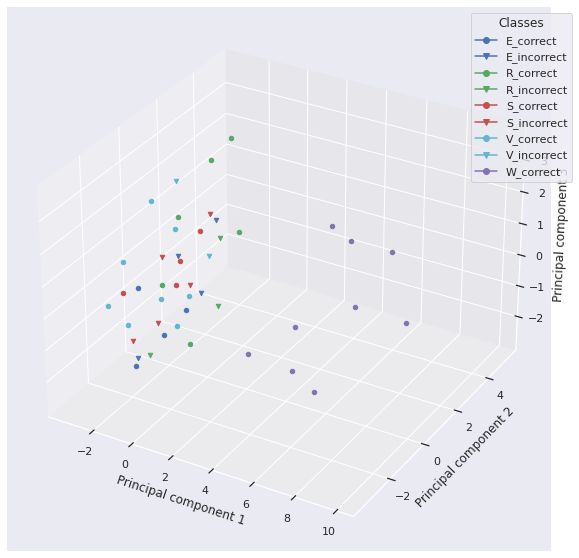

In [52]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

Predictions obtained from this second model are largely similar to those obtained from the first model - again, Trp is identified easily, whilst Val is also identified well. In comparison with the first model (trained with all features), this second model does a better job at identifying Arg, but at slight detriment to its ability to distinguish Glu and Ser.

#### Am I overestimating classifier performance by performing feature selection outside of the CV loop?

In order to test whether the number of features in the array can be reduced, I want to select the same subset of features in every CV fold. This subset has been selected from feature importance analysis on the entire dataset. Therefore there is a danger of information "leakage" between the training and test sets, and consequent overestimation of model performance. Consequently, as a sanity check on the results above, below I perform feature selection (via KBest analysis) within the CV loop.

In [53]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

cv_imp_feat_searches = OrderedDict({})
cv_imp_feat_score_dict = OrderedDict({'Algorithm': [],
                                      'Resampling_method': [],
                                      'Num_features': [],
                                      'Average_accuracy': [],
                                      'Std_dev_accuracy': [],
                                      'Average_recall': [],
                                      'Std_dev_recall': [],
                                      'Average_precision': [],
                                      'Std_dev_precision': [],
                                      'Average_f1': [],
                                      'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        for num_features in num_features_list:
            if index == 0:
                fixed_params = OrderedDict({'strategy': 'prior',
                                            'random_state': 1})
                tuned_params = OrderedDict({})
            elif index == 1:
                fixed_params = OrderedDict({'strategy': 'stratified',
                                            'random_state': 1})
                tuned_params = OrderedDict({})
            else:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                )

            nested_cv_search = ml.run_nested_CV(
                clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=num_features,
                inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                fixed_params=fixed_params, tuned_params=tuned_params,
                train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
            )

            if index == 0:
                cv_imp_feat_searches[
                    'DummyClassifierPrior__{}__{}'.format(resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)
            elif index == 1:
                cv_imp_feat_searches[
                    'DummyClassifierStratified__{}__{}'.format(resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)
            else:
                cv_imp_feat_searches[
                    '{}__{}__{}'.format(algorithm.__name__, resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

            if index == 0:
                cv_imp_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
            elif index == 1:
                cv_imp_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
            else:
                cv_imp_feat_score_dict['Algorithm'].append(algorithm.__name__)
            cv_imp_feat_score_dict['Resampling_method'].append(resampling_method)
            cv_imp_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
            cv_imp_feat_score_dict['Num_features'].append(num_features)
            cv_imp_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
            cv_imp_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
            cv_imp_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
            cv_imp_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
            cv_imp_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
            cv_imp_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
            cv_imp_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

            for n, params in enumerate(nested_cv_search['outer_loop_params']):
                print('\n\n\n')
                print('{}: {},  {}'.format(
                    algorithm.__name__, resampling_method, num_features
                ))
                print('Parameters: {}'.format(params))
                print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
                print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.02222222222222222




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  2






DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.0
F1: 0.0




DummyClassifier: no_balancing,  3
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  3
Parameters: OrderedDict([('strategy', 'stratified'), ('rand





KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2888888888888889




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'distance')])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 





GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.49259259259259264




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.4740740740740741




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5259259259259259




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6222222222222222




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7407407407407407




GaussianNB:





LinearDiscriminantAnalysis: no_balancing,  10
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.3333333333333333




LinearDiscriminantAnalysis: no_balancing,  10
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




LinearDiscriminantAnalysis: no_balancing,  10
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LinearDiscriminantAnalysis: no_balancing,  10
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LinearDiscriminantAnalysis: no_balancing,  10
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5111111111111111




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.444444444444444

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.3333333333333333
F1: 0.25925925925925924




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.6666666666666666
F1: 0.5777777777777778




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('m





SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.2222222222222222
F1: 0.18518518518518517




SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.28571428571428575




SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 1024.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




SVC: no_balancing,  4
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.03125), ('kernel', 'r





AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.3862433862433863




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.09876543209876544




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.4444444444444444
F1: 0.34444444444444444




AdaBoostClassifier: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 1000)])
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




AdaBoostClassifier:

In [54]:
cv_imp_feat_score_df = pd.DataFrame(cv_imp_feat_score_dict)

In [55]:
cv_imp_feat_score_df

,Algorithm,Resampling_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,1,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
1,DummyClassifier_prior,no_balancing,2,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
2,DummyClassifier_prior,no_balancing,3,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
3,DummyClassifier_prior,no_balancing,4,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
4,DummyClassifier_prior,no_balancing,5,0.177778,0.060858,0.177778,0.060858,0.034568,0.020286,0.057374,0.032089
...,...,...,...,...,...,...,...,...,...,...,...
75,AdaBoostClassifier,no_balancing,10,0.311111,0.121716,0.311111,0.121716,0.248148,0.175487,0.260741,0.151572
76,AdaBoostClassifier,no_balancing,15,0.377778,0.099381,0.377778,0.099381,0.323333,0.149998,0.315767,0.094378
77,AdaBoostClassifier,no_balancing,20,0.355556,0.144871,0.355556,0.144871,0.306296,0.168201,0.295873,0.122785
78,AdaBoostClassifier,no_balancing,30,0.422222,0.121716,0.422222,0.121716,0.382593,0.195217,0.363175,0.125506


In [56]:
with open('{}/CV_importance_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((cv_imp_feat_searches, cv_imp_feat_score_df), f)

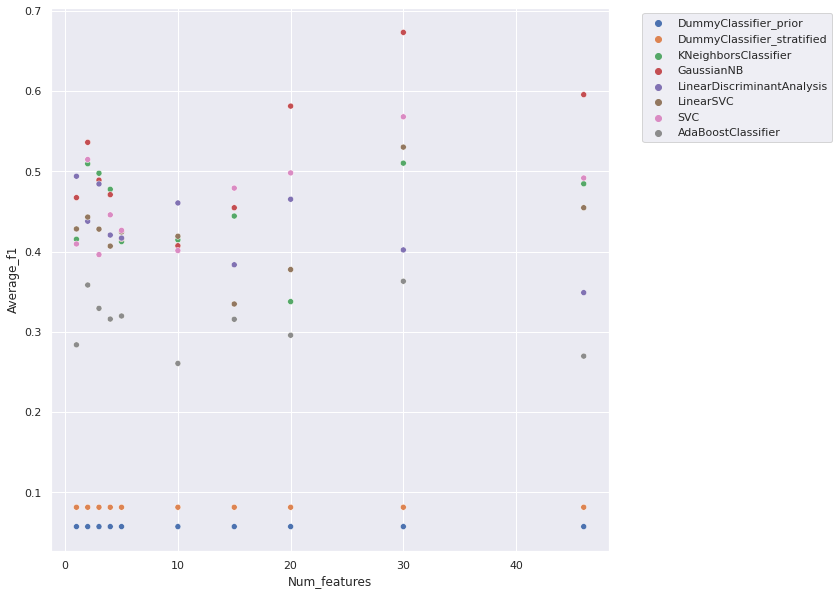

In [57]:
plt.clf()
sns.scatterplot(
    x=cv_imp_feat_score_df['Num_features'], y=cv_imp_feat_score_df['Average_f1'],
    hue=cv_imp_feat_score_df['Algorithm']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/CV_importance_feature_number_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, don't see as good a performance when training a model with a subset of features when those features are selected within the CV loop as opposed to from feature selection on the entire dataset. This does suggest that using the latter method introduces some optimistic bias into my estimate of model performance on unseen data. However, it's important to remember that this dataset is very small, and hence there is substantial random error associated with these performance metrics, as demonstrated by the large standard deviation values reported, so this may explain some of the difference. 

Regardless, it's clear that the trained models are performing better than random classifiers, and the model performance achieved with feature selection performed on the entire dataset is not solely down to the bias that this methodology introduces.

**Is there a significant difference in model performance when reduce the number of features?**

In [68]:
params_1 = all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:10]

print('Model 1:')
print('Algorithm: GaussianNB')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: GaussianNB')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=GaussianNB, classifier_2=GaussianNB, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: GaussianNB
Parameters:
OrderedDict()
Features:
['DPH_GRP46', 'DPH_GRP51', 'DPH_CCHept', 'DPH_CCHept-L14A', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I24A', 'DPH_CCHept-I24P', 'DPH_GRP80', 'DPH_GRP63', 'DPH_GRP52', 'DPH_CCHex', 'DPH_CCPent', 'DPH_NLKEIA', 'DPH_QLKEIA', 'DPH_CCHex2', 'DPH_GRP22', 'DPH_CCHept-I17H', 'DPH_CCHept-I17T', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-I24H', 'DPH_CCHept-I24N', 'DPH_CCHept-I24S', 'DPH_CCHept-I24T', 'DPH_CCHept-L7K', 'DPH_CCHept-I17K', 'DPH_CCHept-I17K-I24E', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-I24D', 'DPH_CCHept-I24E', 'DPH_CCHept-I24K', 'DPH_CCHept-L28K', 'DPH_CCPent-I24K', 'DPH_CCHex2-I24K', 'DPH_CCHept-L7W', 'DPH_CCHept-L7Y', 'DPH_CCHept-L21S-I24Y', 'DPH_CCHept-L21Y-I24S', 'DPH_CCHept-I24Y', 'DPH_CCHept-L28W', 'DPH_CCHept-L28Y']




Model 2:
Algorithm: GaussianNB
Parameters:
OrderedDict()
Features:
['

In [69]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 0.8772226411618201
p value: 0.5994743718256845


So, there is no significant difference in model performance when the number of features used in training is reduced from 46 to 10.

**Is there a significant difference between the best performing model and a random classifier?**

In [70]:
params_1 = all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']['f1']  # No significant
# difference between this model and that trained with 10 features, so because of the apparent bias introduced
# by feature selection on the entire dataset (see above), have selected the model trained with all 46 peptides
selected_features_1 = list(ml.features)
params_2 = all_feat_searches['DummyClassifierPrior__no_balancing']['best_outer_loop_params']['f1']
selected_features_2 = list(ml.features)

print('Model 1:')
print('Algorithm: GaussianNB')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: DummyClassifierPrior')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=GaussianNB, classifier_2=DummyClassifier, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: GaussianNB
Parameters:
OrderedDict()
Features:
['DPH_GRP46', 'DPH_GRP51', 'DPH_CCHept', 'DPH_CCHept-L14A', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I24A', 'DPH_CCHept-I24P', 'DPH_GRP80', 'DPH_GRP63', 'DPH_GRP52', 'DPH_CCHex', 'DPH_CCPent', 'DPH_NLKEIA', 'DPH_QLKEIA', 'DPH_CCHex2', 'DPH_GRP22', 'DPH_CCHept-I17H', 'DPH_CCHept-I17T', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-I24H', 'DPH_CCHept-I24N', 'DPH_CCHept-I24S', 'DPH_CCHept-I24T', 'DPH_CCHept-L7K', 'DPH_CCHept-I17K', 'DPH_CCHept-I17K-I24E', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-I24D', 'DPH_CCHept-I24E', 'DPH_CCHept-I24K', 'DPH_CCHept-L28K', 'DPH_CCPent-I24K', 'DPH_CCHex2-I24K', 'DPH_CCHept-L7W', 'DPH_CCHept-L7Y', 'DPH_CCHept-L21S-I24Y', 'DPH_CCHept-L21Y-I24S', 'DPH_CCHept-I24Y', 'DPH_CCHept-L28W', 'DPH_CCHept-L28Y']




Model 2:
Algorithm: DummyClassifierPrior
Parameters:
OrderedDict([('s

In [71]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 24.75426135325089
p value: 0.0012224725568005643


So, the best performing trained model performs significantly better than a random classifier.